# DM2425 - CLUSTERING ALL TESTS NOTEBOOK 

### GROUP 24
Carolina Pinto - 20240494 <br>
Francisco Pontes - 20211583 <br>
Iris Moreira - 20240659 <br>
Maria Margarida Cardoso - 20240493 <br>

 <div class="alert alert-block alert-success">

# Import: Libraries and Data
<div>

In [72]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import cm, colorbar
from matplotlib import colors as mpl_colors
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler
from mpl_toolkits.axes_grid1 import make_axes_locatable
from minisom import MiniSom
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import linkage, dendrogram
sns.set()
from matplotlib.patches import RegularPolygon

In [2]:
def get_ss(df, feats):
    """
    Calculate the sum of squares (SS) for the given DataFrame.

    The sum of squares is computed as the sum of the variances of each column
    multiplied by the number of non-NA/null observations minus one.

    Parameters:
    df (pandas.DataFrame): The input DataFrame for which the sum of squares is to be calculated.
    feats (list of str): A list of feature column names to be used in the calculation.

    Returns:
    float: The sum of squares of the DataFrame.
    """
    df_ = df[feats]
    ss = np.sum(df_.var() * (df_.count() - 1))
    
    return ss 


def get_ssb(df, feats, label_col):
    """
    Calculate the between-group sum of squares (SSB) for the given DataFrame.
    The between-group sum of squares is computed as the sum of the squared differences
    between the mean of each group and the overall mean, weighted by the number of observations
    in each group.

    Parameters:
    df (pandas.DataFrame): The input DataFrame containing the data.
    feats (list of str): A list of feature column names to be used in the calculation.
    label_col (str): The name of the column in the DataFrame that contains the group labels.
    
    Returns
    float: The between-group sum of squares of the DataFrame.
    """
    
    ssb_i = 0
    for i in np.unique(df[label_col]):
        df_ = df.loc[:, feats]
        X_ = df_.values
        X_k = df_.loc[df[label_col] == i].values
        
        ssb_i += (X_k.shape[0] * (np.square(X_k.mean(axis=0) - X_.mean(axis=0))) )

    ssb = np.sum(ssb_i)
    

    return ssb


def get_ssw(df, feats, label_col):
    """
    Calculate the sum of squared within-cluster distances (SSW) for a given DataFrame.

    Parameters:
    df (pandas.DataFrame): The input DataFrame containing the data.
    feats (list of str): A list of feature column names to be used in the calculation.
    label_col (str): The name of the column containing cluster labels.

    Returns:
    float: The sum of squared within-cluster distances (SSW).
    """
    feats_label = feats+[label_col]

    df_k = df[feats_label].groupby(by=label_col).apply(lambda col: get_ss(col, feats), 
                                                       include_groups=False)

    return df_k.sum()



def get_rsq(df, feats, label_col):
    """
    Calculate the R-squared value for a given DataFrame and features.

    Parameters:
    df (pd.DataFrame): The input DataFrame containing the data.
    feats (list): A list of feature column names to be used in the calculation.
    label_col (str): The name of the column containing the labels or cluster assignments.

    Returns:
    float: The R-squared value, representing the proportion of variance explained by the clustering.
    """

    df_sst_ = get_ss(df, feats)                 # get total sum of squares
    df_ssw_ = get_ssw(df, feats, label_col)     # get ss within
    df_ssb_ = df_sst_ - df_ssw_                 # get ss between

    # r2 = ssb/sst 
    return (df_ssb_/df_sst_)


def get_r2_hc(df, link_method, max_nclus, min_nclus=1, dist="euclidean"):
    """This function computes the R2 for a set of cluster solutions given by the application of a hierarchical method.
    The R2 is a measure of the homogenity of a cluster solution. It is based on SSt = SSw + SSb and R2 = SSb/SSt. 
    
    Parameters:
    df (DataFrame): Dataset to apply clustering
    link_method (str): either "ward", "complete", "average", "single"
    max_nclus (int): maximum number of clusters to compare the methods
    min_nclus (int): minimum number of clusters to compare the methods. Defaults to 1.
    dist (str): distance to use to compute the clustering solution. Must be a valid distance. Defaults to "euclidean".
    
    Returns:
    ndarray: R2 values for the range of cluster solutions
    """
    
    r2 = []  # where we will store the R2 metrics for each cluster solution
    feats = df.columns.tolist()
    
    for i in range(min_nclus, max_nclus+1):  # iterate over desired ncluster range
        
        # CODE HERE ####################################
        cluster = AgglomerativeClustering(linkage=link_method, metric=dist,n_clusters=i)
        
        #get cluster labels
        # CODE HERE ####################################
        hclabels = cluster.fit_predict(df)   
        
        # concat df with labels
        df_concat = pd.concat([df, pd.Series(hclabels, name='labels', index=df.index)], axis=1)  
        
        
        # append the R2 of the given cluster solution
        r2.append(get_rsq(df_concat, feats, 'labels'))
        
    return np.array(r2)

In [3]:
def plot_hexagons(som,              # Trained SOM model 
                  sf,               # matplotlib figure object
                  colornorm,        # colornorm
                  matrix_vals,      # SOM weights or
                  label="",         # title for figure
                  cmap=cm.Grays,    # colormap to use
                  annot=False       
                  ):

    
    axs = sf.subplots(1,1)
    
    for i in range(matrix_vals.shape[0]):
        for j in range(matrix_vals.shape[1]):

            wx, wy = som.convert_map_to_euclidean((i,j)) 

            hex = RegularPolygon((wx, wy), 
                                numVertices=6, 
                                radius= np.sqrt(1/3),
                                facecolor=cmap(colornorm(matrix_vals[i, j])), 
                                alpha=1, 
                                edgecolor='white',
                                linewidth=.5)
            axs.add_patch(hex)
            if annot==True:
                annot_val = np.round(matrix_vals[i,j],2)
                if int(annot_val) == annot_val:
                    annot_val = int(annot_val)
                axs.text(wx,wy, annot_val, 
                        ha='center', va='center', 
                        fontsize='x-small')


    ## Remove axes for hex plot
    axs.margins(.05)
    axs.set_aspect('equal')
    axs.axis("off")
    axs.set_title(label)

    

    # ## Add colorbar
    divider = make_axes_locatable(axs)
    ax_cb = divider.append_axes("right", size="5%", pad="0%")

    ## Create a Mappable object
    cmap_sm = plt.cm.ScalarMappable(cmap=cmap, norm=colornorm)
    cmap_sm.set_array([])

    ## Create custom colorbar 
    cb1 = colorbar.Colorbar(ax_cb,
                            orientation='vertical', 
                            alpha=1,
                            mappable=cmap_sm
                            )
    cb1.ax.get_yaxis().labelpad = 6

    # Add colorbar to plot
    sf.add_axes(ax_cb)

    return sf 

In [4]:
def predict_som_clusters(som, data, hclust_matrix):
    predictions = []
    for x in data:
        bmu = som.winner(x)  # Get BMU coordinates
        cluster = hclust_matrix[bmu]  # Get cluster label from hierarchical clustering
        predictions.append(cluster)
    return predictions

In [5]:
dfs = pd.read_csv('data_cleaned_scaled_test1_db_manual.csv')  
df = pd.read_csv('data_cleaned_test1_db_manual.csv')         

In [6]:
df.set_index('customer_id', inplace= True)

In [7]:
dfs.set_index('customer_id', inplace= True)

In [8]:
dfs.columns

Index(['customer_age', 'vendor_count', 'product_count', 'is_chain',
       'first_order', 'last_order', 'CUI_American', 'CUI_Asian',
       'CUI_Beverages', 'CUI_Cafe', 'CUI_Chicken Dishes', 'CUI_Chinese',
       'CUI_Desserts', 'CUI_Healthy', 'CUI_Indian', 'CUI_Italian',
       'CUI_Japanese', 'CUI_Noodle Dishes', 'CUI_OTHER',
       'CUI_Street Food / Snacks', 'CUI_Thai', 'DOW_0', 'DOW_1', 'DOW_2',
       'DOW_3', 'DOW_4', 'DOW_5', 'DOW_6', 'HR_0', 'HR_1', 'HR_2', 'HR_3',
       'HR_4', 'HR_5', 'HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10', 'HR_11',
       'HR_12', 'HR_13', 'HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18', 'HR_19',
       'HR_20', 'HR_21', 'HR_22', 'HR_23', 'late_night', 'early_morning',
       'morning', 'midday', 'afternoon_evening', 'night', 'weekday', 'weekend',
       'total_spending', 'total_orders', 'order_frequency', 'order_span',
       'avg_product_cost', 'avg_order_cost', 'products_per_vendor',
       'cui_diversity_score', 'dow_diversity_score', 'hr_diversity_score'

 <div class="alert alert-block alert-success">

# Grouping Methods - A Priori Grouping

<div>

### Cell-Based Segments

Using the data not scaled

In [9]:
df_quartiles=df.copy()

#### Total Spending VS Average product cost

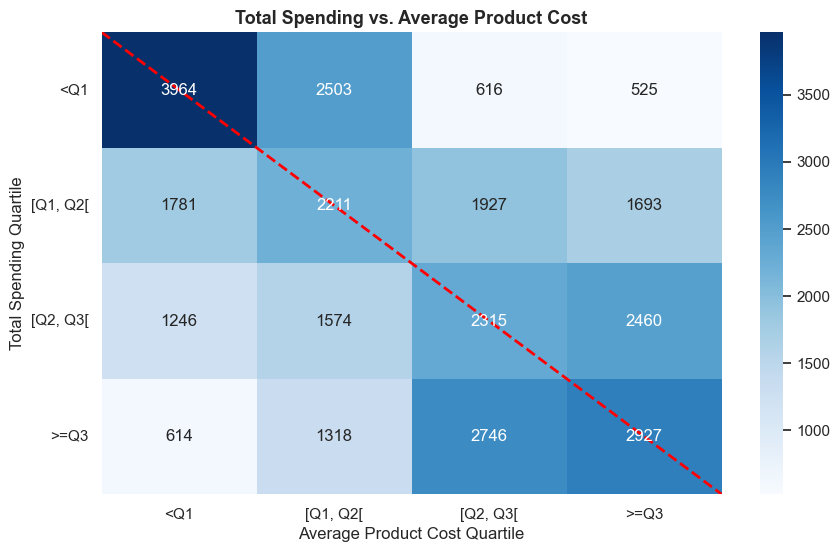

In [10]:
ts_quartiles = df['total_spending'].quantile([0.25, 0.50, 0.75])
apc_quartiles = df['avg_product_cost'].quantile([0.25, 0.50, 0.75])

df_quartiles['ts_quartiles'] = pd.cut(
    df_quartiles['total_spending'],
    bins=[-float('inf'), ts_quartiles[0.25], ts_quartiles[0.50], ts_quartiles[0.75], float('inf')],
    labels=['<Q1', '[Q1, Q2[', '[Q2, Q3[', '>=Q3'])

df_quartiles['apc_quartiles'] = pd.cut(
    df_quartiles['avg_product_cost'],
    bins=[-float('inf'), apc_quartiles[0.25], apc_quartiles[0.50], apc_quartiles[0.75], float('inf')],
    labels=['<Q1', '[Q1, Q2[', '[Q2, Q3[', '>=Q3'])

quartile_crosstab = pd.crosstab(df_quartiles['ts_quartiles'], df_quartiles['apc_quartiles'])

plt.figure(figsize=(10, 6))
sns.heatmap(quartile_crosstab, annot=True, fmt='d', cmap='Blues', cbar=True)
plt.plot(
    range(len(quartile_crosstab)+1),
    range(len(quartile_crosstab)+1),  
    color='red', linestyle='--', linewidth=2)
plt.title('Total Spending vs. Average Product Cost', fontsize=13, fontweight='bold')
plt.xlabel('Average Product Cost Quartile')
plt.ylabel('Total Spending Quartile')
plt.xticks(rotation=0)
plt.yticks(rotation=0)
plt.show()

In [11]:
#values for each quartile
print(ts_quartiles)
print(apc_quartiles)

0.25    12.64
0.50    23.60
0.75    42.21
Name: total_spending, dtype: float64
0.25     4.190625
0.50     7.026667
0.75    10.215952
Name: avg_product_cost, dtype: float64


In [12]:
quadrant1_sum = 0 
for i in (0,1):
    for j in (0,1):
        quadrant1_sum += quartile_crosstab.iloc[i,j]

quadrant2_sum = 0 
for i in (0,1):
    for j in (2,3):
        quadrant2_sum += quartile_crosstab.iloc[i,j]

quadrant3_sum = 0
for i in (2,3):
    for j in (0,1):
        quadrant3_sum += quartile_crosstab.iloc[i,j]

quadrant4_sum = 0
for i in (2,3):
    for j in (2,3):
        quadrant4_sum += quartile_crosstab.iloc[i,j]

print('Quantity of customers in Quadrant 1:', quadrant1_sum, '; Percentage:', round(quadrant1_sum/(quadrant1_sum+quadrant2_sum+quadrant3_sum+quadrant4_sum)*100, 2))
print('Quantity of customers in Quadrant 2:', quadrant2_sum, '; Percentage:', round(quadrant2_sum/(quadrant1_sum+quadrant2_sum+quadrant3_sum+quadrant4_sum)*100, 2))
print('Quantity of customers in Quadrant 3:', quadrant3_sum, '; Percentage:', round(quadrant3_sum/(quadrant1_sum+quadrant2_sum+quadrant3_sum+quadrant4_sum)*100, 2))
print('Quantity of customers in Quadrant 4:', quadrant4_sum, '; Percentage:', round(quadrant4_sum/(quadrant1_sum+quadrant2_sum+quadrant3_sum+quadrant4_sum)*100, 2))


Quantity of customers in Quadrant 1: 10459 ; Percentage: 34.38
Quantity of customers in Quadrant 2: 4761 ; Percentage: 15.65
Quantity of customers in Quadrant 3: 4752 ; Percentage: 15.62
Quantity of customers in Quadrant 4: 10448 ; Percentage: 34.35


`Insights/Conclusion`

The expected trend for the total spending vs average product cost is represented by the dash line,indicating that customers who spend more per product are likely to have higher total spending overall. 

The majority of customers fall into Quadrant 1 (low total spending and low average product cost), which is concerning as this suggests a significant portion of the customer base is contributing less to overall revenue. 

*Quadrant 1:* Represents the lower spending customers on total and per product, on average.<br>
*Quadrant 2:* Represents the lower spending customers on total but high spenders per product, on average.<br>
*Quadrant 3:* Represents the high spending customers on total but lower spenders per product, on average.<br>
*Quadrant 4:* Represents the higher spending customers on total and per product, on average.<br>

The observed trend aligns with expectations, with Quadrants 1 and 4 being the most prominent in terms of customer representation.

Also, quadrant 2 and quadrant 3 together are around 30% of the costumers, and represent a similar percentage between them. In spite of this, the most concerning costumers are the ones that have lower total spending.

To elevate customers in Quadrant 2 to Quadrant 4, a targeted marketing strategy could be implemented to engage these customers. Despite their higher spending per product, their lower total spending suggests they may not order as frequently. However, this might not always be the case, since they could be newer customers or previous active users who are no longer engaged.

***Consequent Research Questions**: How is the order span of these customers?; And when was the first_order? Was it much later?*

In [13]:
Qd2 = (((df_quartiles['ts_quartiles'] == '<Q1') | (df_quartiles['ts_quartiles'] == '[Q1, Q2[')) & 
        ((df_quartiles['apc_quartiles'] == '[Q2, Q3[') | (df_quartiles['apc_quartiles'] == '>=Q3')))

Qd2_os_stats = df_quartiles[Qd2]['order_span'].describe()
Qd134_os_stats = df_quartiles[~Qd2]['order_span'].describe()

Qd2_fo_stats = df_quartiles[Qd2]['first_order'].describe()
Qd134_fo_stats = df_quartiles[~Qd2]['first_order'].describe()

Qd2_lo_stats = df_quartiles[Qd2]['last_order'].describe()
Qd134_lo_stats = df_quartiles[~Qd2]['last_order'].describe()

pd.DataFrame({'Order Span for Quadrant 2': round(Qd2_os_stats, 1), 'Order Span for Quadrants 1, 3 & 4': round(Qd134_os_stats, 1),
             'First Order for Quadrant 2': round(Qd2_fo_stats, 1), 'First Order for Quadrants 1, 3 & 4': round(Qd134_fo_stats, 1),
             'Last Order for Quadrant 2': round(Qd2_lo_stats, 1), 'Last Order for Quadrants 1, 3 & 4': round(Qd134_lo_stats, 1)})

,Order Span for Quadrant 2,"Order Span for Quadrants 1, 3 & 4",First Order for Quadrant 2,"First Order for Quadrants 1, 3 & 4",Last Order for Quadrant 2,"Last Order for Quadrants 1, 3 & 4"
count,4761.0,25659.0,4761.0,25659.0,4761.0,25659.0
mean,10.6,38.1,41.6,26.9,52.2,64.9
std,18.6,28.1,26.0,23.0,25.9,22.1
min,0.0,0.0,0.0,0.0,0.0,0.0
25%,0.0,10.0,19.0,7.0,31.0,52.0
50%,0.0,39.0,40.0,21.0,56.0,71.0
75%,14.0,63.0,64.0,41.0,75.0,83.0
max,86.0,90.0,89.0,90.0,89.0,90.0


**Answering the proposed research questions**

Regarding Order Span: The order span is significantly shorter in Quadrant 2, indicating that these customers were active for a shorter period. (Was this period during the middle of the data collection, suggesting they became customers and churned shortly after? This can be evaluated by analyzing the first_order and last_order variables.)

Regarding First Order: Higher in quadrant 2, meaning that the customers for quadrant 2 started later than the others (newer customers.

Regarding Last Order: Slightly higher in quadrant 2, meaning that the customers for quadrant 2 also had placed orders later than the others (i.e. they are still customers).

All in All, we conclude that these customers are new customers. That is probably why they do not have high total spending yet. We want to continue to keep these customers since they buy expensive products, on average.

#### Total Spending VS Order Span (days passed between the first and last order)

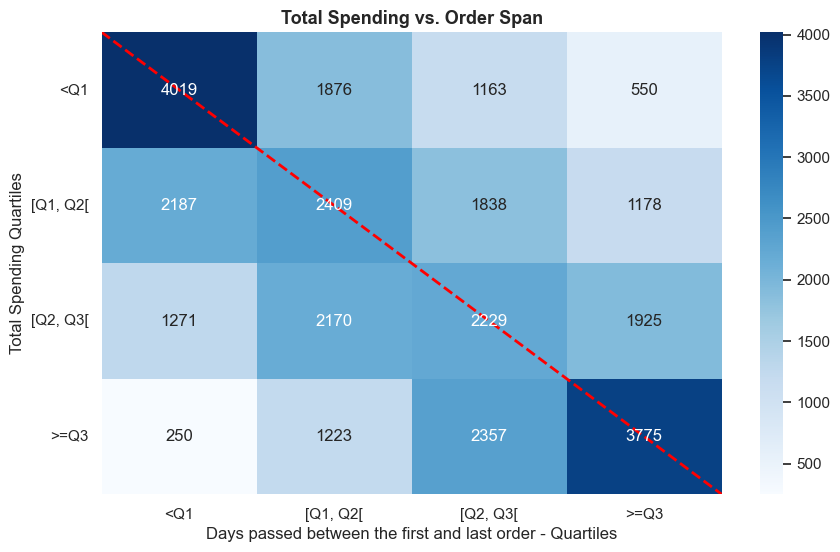

In [14]:
os_quartiles = df['order_span'].quantile([0.25, 0.50, 0.75])

df_quartiles['os_quartiles'] = pd.cut(
    df_quartiles['order_span'],
    bins=[-float('inf'), os_quartiles[0.25], os_quartiles[0.50], os_quartiles[0.75], float('inf')],
    labels=['<Q1', '[Q1, Q2[', '[Q2, Q3[', '>=Q3']
)

quartile_crosstab = pd.crosstab(df_quartiles['ts_quartiles'], df_quartiles['os_quartiles'])

plt.figure(figsize=(10, 6))
sns.heatmap(quartile_crosstab, annot=True, fmt='d', cmap='Blues', cbar=True)
plt.plot(
    range(len(quartile_crosstab)+1),
    range(len(quartile_crosstab)+1),  
    color='red', linestyle='--', linewidth=2)
plt.title('Total Spending vs. Order Span', fontsize=13, fontweight='bold')
plt.xlabel('Days passed between the first and last order - Quartiles')
plt.ylabel('Total Spending Quartiles')
plt.xticks(rotation=0)
plt.yticks(rotation=0)
plt.show()


In [15]:
print(ts_quartiles)
print(os_quartiles)

0.25    12.64
0.50    23.60
0.75    42.21
Name: total_spending, dtype: float64
0.25     2.0
0.50    32.0
0.75    59.0
Name: order_span, dtype: float64


`Insights/Conclusion`

The expected trend for total spending versus order span is represented by the dashed line, indicating that the more days that pass between a customer's first and last order, the higher their total spending is expected to be.<br>

Below the red line, we have a favorable group of customers who, despite a shorter span of days in our business, manage to spend more than the "expected" amount. 

Above the red line, however, we observe a less favorable group of customers who have been with our business for a longer period but exhibit lower total expenditure than the "expected." 

By looking at the heat map, it seems there are slightly more customers below the line than above it. This should be ideal, but there are still more long-term customers who do not contribute to higher total spending. This calls for a targeted marketing strategy to engage these customers and encourage increased spending.

#### Total Spending VS Products per vendor

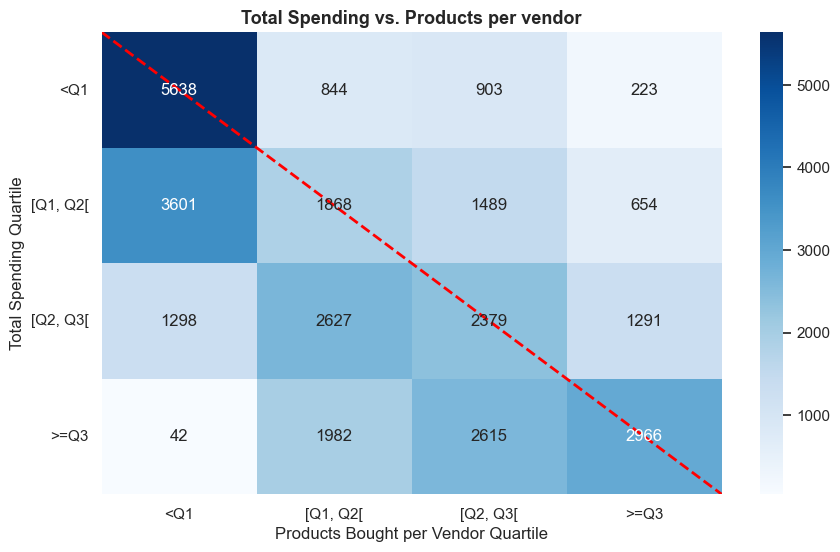

In [16]:
ppv_quartiles = df['products_per_vendor'].quantile([0.25, 0.50, 0.75])

df_quartiles['ppv_quartiles'] = pd.cut(
    df_quartiles['products_per_vendor'],
    bins=[-float('inf'), ppv_quartiles[0.25], ppv_quartiles[0.50], ppv_quartiles[0.75], float('inf')],
    labels=['<Q1', '[Q1, Q2[', '[Q2, Q3[', '>=Q3'])

quartile_crosstab = pd.crosstab(df_quartiles['ts_quartiles'], df_quartiles['ppv_quartiles'])

plt.figure(figsize=(10, 6))
sns.heatmap(quartile_crosstab, annot=True, fmt='d', cmap='Blues', cbar=True)
plt.plot(
    range(len(quartile_crosstab)+1),
    range(len(quartile_crosstab)+1),  
    color='red', linestyle='--', linewidth=2)
plt.title('Total Spending vs. Products per vendor', fontsize=13, fontweight='bold')
plt.xlabel('Products Bought per Vendor Quartile')
plt.ylabel('Total Spending Quartile')
plt.xticks(rotation=0)
plt.yticks(rotation=0)
plt.show()


In [17]:
print(ts_quartiles)
print(ppv_quartiles)

0.25    12.64
0.50    23.60
0.75    42.21
Name: total_spending, dtype: float64
0.25    1.0
0.50    1.5
0.75    2.0
Name: products_per_vendor, dtype: float64


`Insights/Conclusion`

The expected trend for total spending versus products bought per vendor is represented by the dashed line, indicating that the higher the average number of products a customer buys per vendor, the higher their total spending is expected to be. <br>

There is a clear concentration of most customers below the red line. This behavior may suggest that customers prioritize purchasing larger quantities of certain types of products (or high-value products) from a single vendor rather than diversifying across vendors.

### RFM Analysis

**Three principles:** Recency, Frequency and Monetary

However we will only focus on frequency and monetary.

**Variables:** <br>
*last_order* - Recency: Customers who have purchased more recently are more likely to purchase again.<br>
*order_frequency* - Frequency: Customers who have made more purchases are more likely to purchase again.<br>
*avg_order_cost* - Monetary: Customers who have made larger purchases are more likely to purchase again.<br>

In [18]:
df_rfm = dfs.copy()

#Higher value for last_order = Higher Score
df_rfm['R_score'] = pd.cut(df_rfm['last_order'], bins=5, labels=[1, 2, 3, 4, 5])
df_rfm['R_score'] = df_rfm['R_score'].astype(int)

#Low order_frequency (average of days between orders) = Higher score
df_rfm['F_score'] = pd.cut(df_rfm['order_frequency'], bins=5, labels=[5, 4, 3, 2, 1]) 
df_rfm['F_score'] = df_rfm['F_score'].astype(int)

#Higher products_per_vendor = Higher score
df_rfm['M_score'] = pd.cut(df_rfm['avg_order_cost'], bins=5, labels=[1, 2, 3, 4, 5])
df_rfm['M_score'] = df_rfm['M_score'].astype(int)

#Combine R, F and M scores
df_rfm['RFM_score'] = df_rfm['R_score'].astype(str) + df_rfm['F_score'].astype(str) + df_rfm['M_score'].astype(str)
df_rfm['RFM_score_sum'] = df_rfm['R_score']+df_rfm['M_score']+df_rfm['F_score']

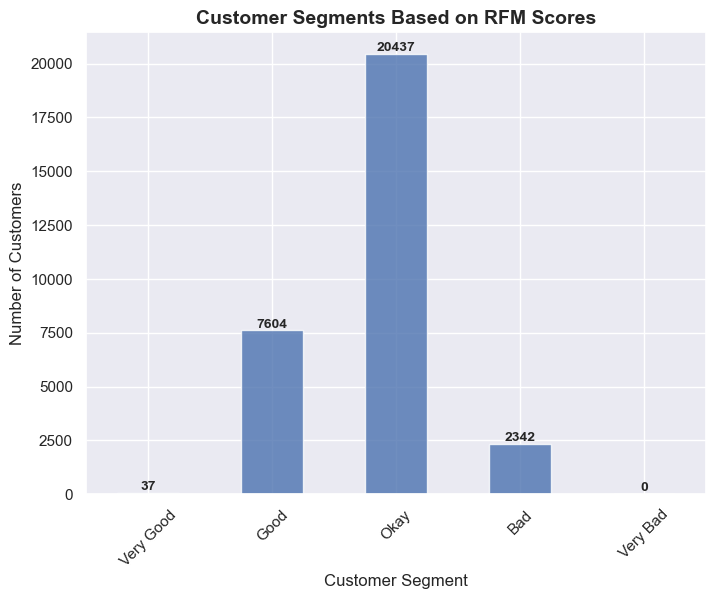

In [19]:
#Function to segment customers based on the aveRFM score
def segment_rfm(row):
    if (row['RFM_score_sum'])/3 > 4.5:
        return 'Very Good'
    elif (row['RFM_score_sum'])/3 > 3.5:
        return 'Good'
    elif (row['RFM_score_sum'])/3 > 2.5:
        return 'Okay'
    elif (row['RFM_score_sum'])/3 > 1.5:
        return 'Bad'
    else:
        return 'Very Bad'

# Apply the segmentation function to the dataframe
df_rfm['Segment'] = df_rfm.apply(segment_rfm, axis=1)

# Count the number of customers in each segment
segment_counts = df_rfm['Segment'].value_counts()

# Order the segments based on the custom order
custom_order = ['Very Good', 'Good', 'Okay', 'Bad', 'Very Bad']
segment_counts = segment_counts.reindex(custom_order).fillna(0)

# Plotting
plt.figure(figsize=(8, 6))
ax = segment_counts.plot(kind='bar', alpha=0.8)

# Add count labels above the bars
for p in ax.patches:
    ax.text(
        p.get_x() + p.get_width() / 2,  # X-coordinate of the label
        p.get_height() + 5,            # Y-coordinate (slightly above the bar)
        int(p.get_height()),           # Text (number of customers)
        ha='center',                   # Horizontal alignment
        va='bottom',                   # Vertical alignment
        fontsize=10,                   # Font size
        fontweight='bold'              # Bold font
    )

# Final plot details
plt.title('Customer Segments Based on RFM Scores', fontsize=14, fontweight='bold')
plt.xlabel('Customer Segment', fontsize=12)
plt.ylabel('Number of Customers', fontsize=12)
plt.xticks(rotation=45)
plt.show()


Following the RFM analysis, the more common costumers seem to fit in a "okay" category defined by the average of the score in Recency, Frequency and Monetary to be between 2.5 and 3.5. Consider the maximum sum is 15 (555).

Now, we want to know who are these 'Okay' customers: how are they characterized in terms of Recency, Frequency and Monetary, individually?

In [20]:
R_okay = pd.DataFrame(df_rfm[(df_rfm['RFM_score_sum']/3 >= 2.5) & (df_rfm['RFM_score_sum']/3 < 3.5)]['R_score'].value_counts())
F_okay = pd.DataFrame(df_rfm[(df_rfm['RFM_score_sum']/3 >= 2.5) & (df_rfm['RFM_score_sum']/3 < 3.5)]['F_score'].value_counts())
M_okay = pd.DataFrame(df_rfm[(df_rfm['RFM_score_sum']/3 >= 2.5) & (df_rfm['RFM_score_sum']/3 < 3.5)]['M_score'].value_counts())
RFM_okay = pd.concat([R_okay, F_okay, M_okay], axis=1)
RFM_okay.columns = ['R_okay', 'F_okay', 'M_okay']
RFM_okay

,R_okay,F_okay,M_okay
5,6899,8859,NaN
4,6668,8398,20.0
3,3711,2569,174.0
2,2582,578,2448.0
1,577,33,17795.0


For the customers in "okay" category, although the R score and F score seems to be, in general, very high (5 or 4), the M score take, mainly, very low scores, 1 and 2, being 2 less frequent than 1, which reinforces more the trend.

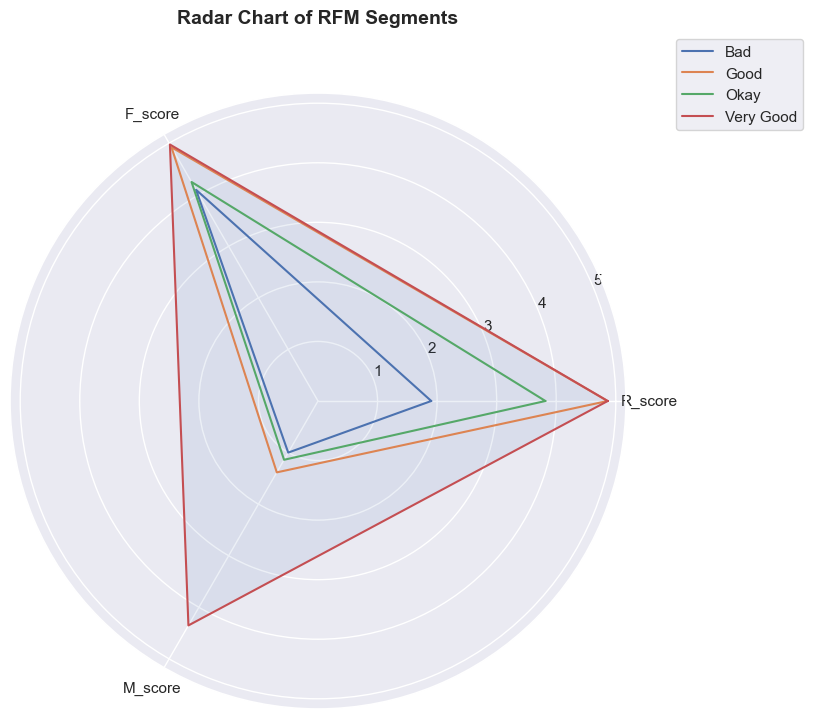

In [21]:
#Radar Chart (Spider Plot)
segment_means = df_rfm.groupby('Segment')[['R_score', 'F_score', 'M_score']].mean()

categories = list(segment_means.columns)
N = len(categories)

plt.figure(figsize=(8, 8))
for segment, row in segment_means.iterrows():
    values = row.values.flatten().tolist()
    values += values[:1]  # Close the loop
    angles = [n / float(N) * 2 * np.pi for n in range(N)] + [0]

    plt.polar(angles, values, label=segment)

plt.title('Radar Chart of RFM Segments', fontsize=14, fontweight='bold', y=1.1)
plt.xticks(angles[:-1], categories)
plt.fill(angles, values, alpha=0.1)
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
plt.show()

#This Code was generated with the help of ChatGPT

From this Radar Chart, we can see that what distinguishes the "Good" from the "Very Good" Customers is the Monetary Score. Relatively to the Frequency and the Recency average score these two categorys have a similar behaviour.

Regarding the other categories, the "Okay" customers seem to be our future best customers, because although they have a a lower Frequency score than the "Good" category, they are very close to the "Good" in Monetary score. Not only this, but this Monetary score of the "Good" is very close to all of the other categories below, which is not very good taking their frequency into consideration, it should be higher. The "Bad" category is the one with the markedly lower recency, we might infer that we may have lost these customers or they could be just sporadical customers.

All in all, our best customers seem to be characterized by the "Very Good" category and the "Okay" Category (Instead of what we initially though when defining the threshoulds). As a strategy we could invest in the "Okay" category customers, so the new customers will continue with a supposedly high-spending and loyalty(recency) pattern.

 <div class="alert alert-block alert-success">

# Clustering 

<div>

# 1. PERSPECTIVE 1 - Value and Loyalty

**FEATURES**: total_spending, order_span, avg_order_cost, total_orders

In [22]:
value_loyalty_feats = ['total_spending', 'avg_order_cost', 'order_span', 'total_orders']

## 1.1. Hierarchical

`Find optimal linkage and number of clusters`

In [ ]:
hc_methods = ["ward", "complete", "average", "single"]
max_nclus = 10

r2_hc = np.vstack([get_r2_hc(dfs[value_loyalty_feats], 
                              link, 
                              max_nclus=max_nclus, 
                              min_nclus=1, 
                              dist="euclidean") 
                              for link in hc_methods])

In [46]:
r2_hc_methods = pd.DataFrame(r2_hc.T, index=range(1, max_nclus + 1), columns=hc_methods)

In [ ]:
sns.set()

# Plot data
fig = plt.figure(figsize=(11,5))
sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

plt.legend(title="HC methods", title_fontsize=11)
plt.xticks(range(1, max_nclus + 1))
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)

fig.suptitle("$R^2$ plot for various hierarchical methods", fontsize=21)

plt.show()

Considering this graphic, we can state that "ward" linkage should be the best method to calculate the distances. <br> Also, we consider around 4 (3, 4 or 5) to be the optimal number of clusters, since it does not increase $R^2$ significantly post 5 clusters. 

**`Hierarchical Dendogram`**

In [23]:
linkage_ = 'ward'
distance = 'euclidean' 
hclust = AgglomerativeClustering(linkage= linkage_, metric=distance, distance_threshold=0, n_clusters=None)
hclust.fit_predict(dfs[value_loyalty_feats])

array([21570, 25180, 25115, ...,     5,     2,     0])

In [24]:
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

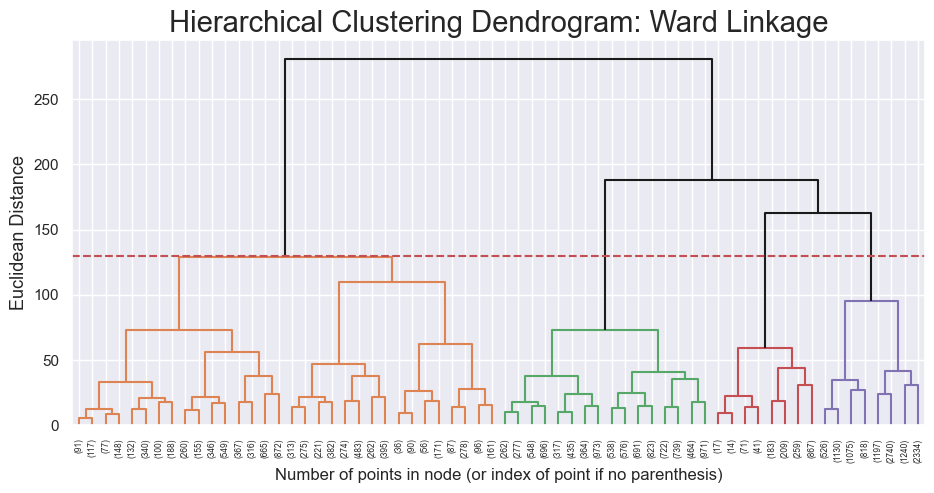

In [25]:
# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
y_threshold = 130
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering Dendrogram: {linkage_.title()} Linkage', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

From this dendogram, we do not have a clear direction on the best number of clusters experiment clustering for 3, 4, 5 and 6.

### Testing clusters solutions

In [26]:
linkage_ = 'ward'
distance = 'euclidean'

### 3 Cluster solution 

In [27]:
n_clusters = 3

hc3_clust = AgglomerativeClustering(linkage=linkage_, metric=distance, n_clusters=n_clusters)
hc3_labels = hc3_clust.fit_predict(dfs[value_loyalty_feats])

In [28]:
df_concat = pd.concat([dfs[value_loyalty_feats], 
                       pd.Series(hc3_labels, 
                                 name='labels', 
                                 index=df.index)], 
                    axis=1)

df_concat.groupby('labels').mean()

,total_spending,avg_order_cost,order_span,total_orders
labels,,,,
0,-0.439528,0.313848,-0.973135,-0.704293
1,1.129991,0.127035,0.952297,1.124522
2,-0.403479,-0.537168,0.475982,-0.040186


In [29]:
df_sst_ = get_ss(df_concat, value_loyalty_feats)
df_ssb_ = get_ssb(df_concat, value_loyalty_feats, 'labels')
df_ssw_ = get_ssw(df_concat, value_loyalty_feats, 'labels')
df_rsq_ = get_rsq(df_concat, value_loyalty_feats, 'labels')

print("SSb:  ", df_ssb_)
print("SSw:  ", df_ssw_)
print("SSt:  ", df_sst_)
print("R2: ", df_rsq_)

SSb:   57217.1793538773
SSw:   64462.82064612272
SSt:   121680.00000000923
R2:  0.47022665478206915


/var/folders/57/25kq17kn271f80zlcffjmj1c0000gn/T/ipykernel_68981/1072278995.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_concat, x='labels', ax=axes[1], palette=["darkblue"])
/var/folders/57/25kq17kn271f80zlcffjmj1c0000gn/T/ipykernel_68981/1072278995.py:18: UserWarning: 
The palette list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.countplot(data=df_concat, x='labels', ax=axes[1], palette=["darkblue"])


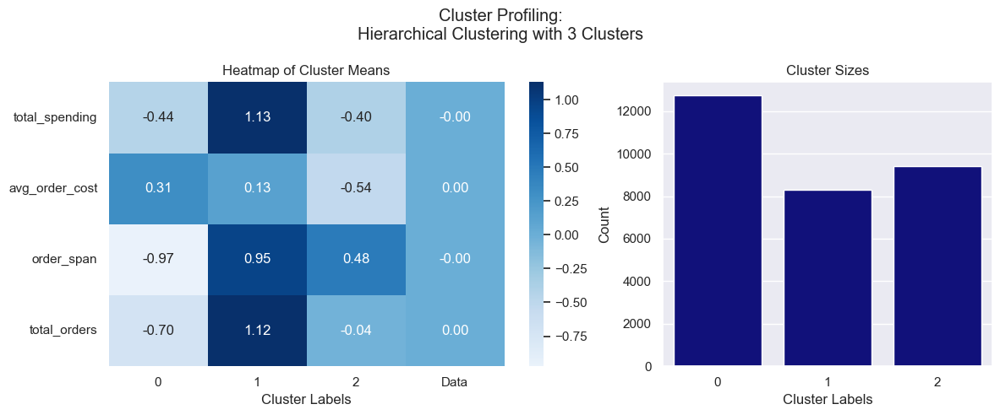

In [30]:
hc_profile = df_concat.groupby('labels').mean().T
df_means = df_concat[value_loyalty_feats].mean()
df_means.name = "Data"
hc_profile = pd.concat([hc_profile, df_means], axis=1)

# Set up the figure with subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 5), width_ratios=[0.6, 0.4], tight_layout=True)

# Heatmap for cluster means
sns.heatmap(hc_profile,
            center=0, annot=True, cmap="Blues", fmt=".2f",
            ax=axes[0])
axes[0].set_xlabel("Cluster Labels")
axes[0].set_title("Heatmap of Cluster Means")
axes[0].set_yticklabels(axes[0].get_yticklabels(), rotation=0)

# Bar plot for cluster sizes
sns.countplot(data=df_concat, x='labels', ax=axes[1], palette=["darkblue"])
axes[1].set_title("Cluster Sizes")
axes[1].set_xlabel("Cluster Labels")
axes[1].set_ylabel("Count")

fig.suptitle("Cluster Profiling:\nHierarchical Clustering with 3 Clusters")
plt.show()

### 4 Cluster solution

In [31]:
n_clusters = 4

hc4_clust = AgglomerativeClustering(linkage=linkage_, metric=distance, n_clusters=n_clusters)
hc4_labels = hc4_clust.fit_predict(dfs[value_loyalty_feats])

In [32]:
df_concat = pd.concat([dfs[value_loyalty_feats], 
                       pd.Series(hc4_labels, 
                                 name='labels', 
                                 index=df.index)], 
                    axis=1)

df_concat.groupby('labels').mean()

,total_spending,avg_order_cost,order_span,total_orders
labels,,,,
0,1.129991,0.127035,0.952297,1.124522
1,-0.561922,-0.061782,-0.976099,-0.694688
2,-0.403479,-0.537168,0.475982,-0.040186
3,0.375451,2.815035,-0.953399,-0.768253


In [33]:
df_sst_ = get_ss(df_concat, value_loyalty_feats)
df_ssb_ = get_ssb(df_concat, value_loyalty_feats, 'labels')
df_ssw_ = get_ssw(df_concat, value_loyalty_feats, 'labels')
df_rsq_ = get_rsq(df_concat, value_loyalty_feats, 'labels')

print("SSb:  ", df_ssb_)
print("SSw:  ", df_ssw_)
print("SSt:  ", df_sst_)
print("R2: ", df_rsq_)

SSb:   70446.29129409482
SSw:   51233.708705905476
SSt:   121680.00000000923
R2:  0.5789471671112624


/var/folders/57/25kq17kn271f80zlcffjmj1c0000gn/T/ipykernel_68981/723367319.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_concat, x='labels', ax=axes[1], palette=["darkblue"])
/var/folders/57/25kq17kn271f80zlcffjmj1c0000gn/T/ipykernel_68981/723367319.py:18: UserWarning: 
The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.
  sns.countplot(data=df_concat, x='labels', ax=axes[1], palette=["darkblue"])


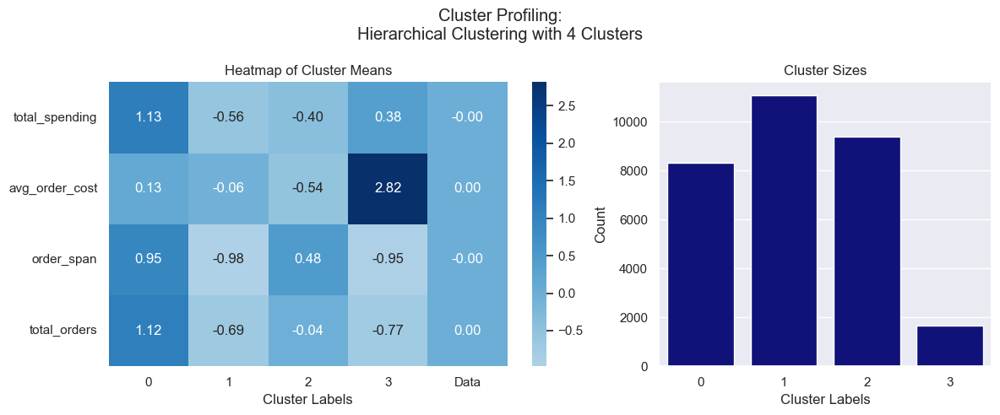

In [34]:
hc_profile = df_concat.groupby('labels').mean().T
df_means = df_concat[value_loyalty_feats].mean()
df_means.name = "Data"
hc_profile = pd.concat([hc_profile, df_means], axis=1)

# Set up the figure with subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 5), width_ratios=[0.6, 0.4], tight_layout=True)

# Heatmap for cluster means
sns.heatmap(hc_profile,
            center=0, annot=True, cmap="Blues", fmt=".2f",
            ax=axes[0])
axes[0].set_xlabel("Cluster Labels")
axes[0].set_title("Heatmap of Cluster Means")
axes[0].set_yticklabels(axes[0].get_yticklabels(), rotation=0)

# Bar plot for cluster sizes
sns.countplot(data=df_concat, x='labels', ax=axes[1], palette=["darkblue"])
axes[1].set_title("Cluster Sizes")
axes[1].set_xlabel("Cluster Labels")
axes[1].set_ylabel("Count")

fig.suptitle("Cluster Profiling:\nHierarchical Clustering with 4 Clusters")
plt.show()

### 5 Cluster Solution

In [35]:
n_clusters=5

hc5_clust = AgglomerativeClustering(linkage=linkage_, metric=distance, n_clusters=n_clusters)
hc5_labels = hc5_clust.fit_predict(dfs[value_loyalty_feats])

In [36]:
# Characterizing the 5 clusters
df_concat = pd.concat([dfs[value_loyalty_feats], 
                       pd.Series(hc5_labels, 
                                 name='labels', 
                                 index=df.index)], 
                    axis=1)

df_concat.groupby('labels').mean()

,total_spending,avg_order_cost,order_span,total_orders
labels,,,,
0,1.447603,-0.245883,1.224915,2.127986
1,-0.561922,-0.061782,-0.976099,-0.694688
2,-0.403479,-0.537168,0.475982,-0.040186
3,0.375451,2.815035,-0.953399,-0.768253
4,0.889244,0.409704,0.745655,0.363903


In [37]:
df_sst_ = get_ss(df_concat, value_loyalty_feats)
df_ssb_ = get_ssb(df_concat, value_loyalty_feats, 'labels')
df_ssw_ = get_ssw(df_concat, value_loyalty_feats, 'labels')
df_rsq_ = get_rsq(df_concat, value_loyalty_feats, 'labels')

print("SSb:  ", df_ssb_)
print("SSw:  ", df_ssw_)
print("SSt:  ", df_sst_)
print("R2: ", df_rsq_)

SSb:   78761.45056526776
SSw:   42918.54943473214
SSt:   121680.00000000923
R2:  0.6472834530347725


/var/folders/57/25kq17kn271f80zlcffjmj1c0000gn/T/ipykernel_68981/3562096273.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_concat, x='labels', ax=axes[1], palette=["darkblue"])
/var/folders/57/25kq17kn271f80zlcffjmj1c0000gn/T/ipykernel_68981/3562096273.py:17: UserWarning: 
The palette list has fewer values (1) than needed (5) and will cycle, which may produce an uninterpretable plot.
  sns.countplot(data=df_concat, x='labels', ax=axes[1], palette=["darkblue"])


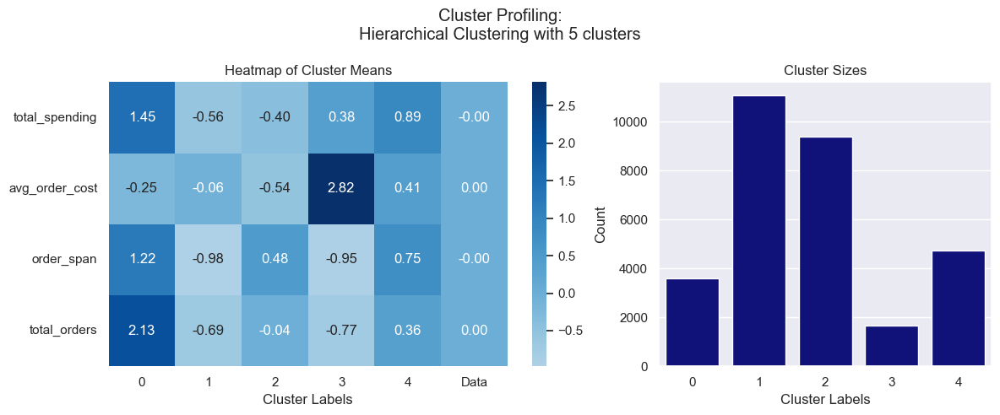

In [38]:
hc_profile = df_concat.groupby('labels').mean().T
df_means = df_concat[value_loyalty_feats].mean()
df_means.name = "Data"
hc_profile = pd.concat([hc_profile, df_means], axis=1)

fig, axes = plt.subplots(1, 2, figsize=(12, 5), width_ratios=[0.6, 0.4], tight_layout=True)

# Heatmap for cluster means
sns.heatmap(hc_profile,
            center=0, annot=True, cmap="Blues", fmt=".2f",
            ax=axes[0])
axes[0].set_xlabel("Cluster Labels")
axes[0].set_title("Heatmap of Cluster Means")
axes[0].set_yticklabels(axes[0].get_yticklabels(), rotation=0)

# Bar plot for cluster sizes
sns.countplot(data=df_concat, x='labels', ax=axes[1], palette=["darkblue"])
axes[1].set_title("Cluster Sizes")
axes[1].set_xlabel("Cluster Labels")
axes[1].set_ylabel("Count")

fig.suptitle("Cluster Profiling:\nHierarchical Clustering with 5 clusters")
plt.show()

### 6 Cluster solution

In [39]:
n_clusters=6

hc6_clust = AgglomerativeClustering(linkage=linkage_, metric=distance, n_clusters=n_clusters)
hc6_labels = hc6_clust.fit_predict(dfs[value_loyalty_feats])

In [40]:
# Characterizing the 6 clusters
df_concat = pd.concat([dfs[value_loyalty_feats], 
                       pd.Series(hc6_labels, 
                                 name='labels', 
                                 index=df.index)], 
                    axis=1)

df_concat.groupby('labels').mean()

,total_spending,avg_order_cost,order_span,total_orders
labels,,,,
0,-0.561922,-0.061782,-0.976099,-0.694688
1,0.889244,0.409704,0.745655,0.363903
2,-0.403479,-0.537168,0.475982,-0.040186
3,0.375451,2.815035,-0.953399,-0.768253
4,3.392158,0.520726,1.282946,2.526635
5,0.719794,-0.532809,1.203195,1.978780


In [41]:
df_sst_ = get_ss(df_concat, value_loyalty_feats)
df_ssb_ = get_ssb(df_concat, value_loyalty_feats, 'labels')
df_ssw_ = get_ssw(df_concat, value_loyalty_feats, 'labels')
df_rsq_ = get_rsq(df_concat, value_loyalty_feats, 'labels')

print("SSb:  ", df_ssb_)
print("SSw:  ", df_ssw_)
print("SSt:  ", df_sst_)
print("R2: ", df_rsq_)

SSb:   84833.01035321031
SSw:   36846.989646789545
SSt:   121680.00000000923
R2:  0.6971812159205559


/var/folders/57/25kq17kn271f80zlcffjmj1c0000gn/T/ipykernel_68981/3036059812.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_concat, x='labels', ax=axes[1], palette=["darkblue"])
/var/folders/57/25kq17kn271f80zlcffjmj1c0000gn/T/ipykernel_68981/3036059812.py:17: UserWarning: 
The palette list has fewer values (1) than needed (6) and will cycle, which may produce an uninterpretable plot.
  sns.countplot(data=df_concat, x='labels', ax=axes[1], palette=["darkblue"])


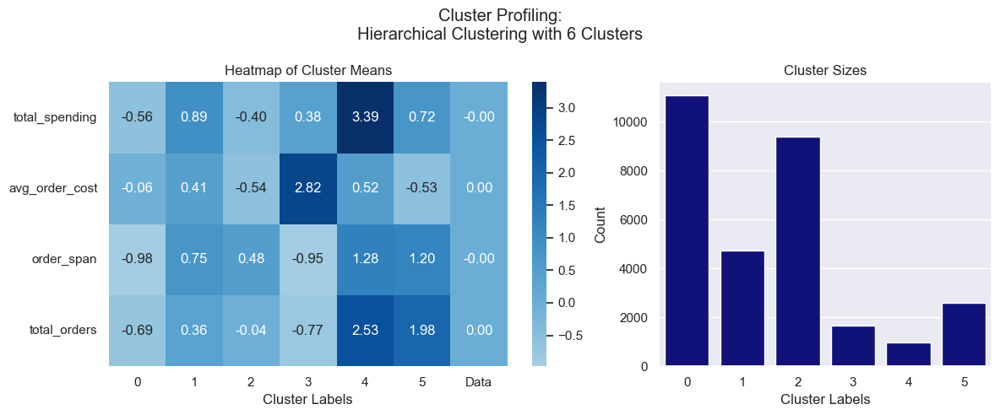

In [42]:
hc_profile = df_concat.groupby('labels').mean().T
df_means = df_concat[value_loyalty_feats].mean()
df_means.name = "Data"
hc_profile = pd.concat([hc_profile, df_means], axis=1)

fig, axes = plt.subplots(1, 2, figsize=(12, 5), width_ratios=[0.6, 0.4], tight_layout=True)

# Heatmap for cluster means
sns.heatmap(hc_profile,
            center=0, annot=True, cmap="Blues", fmt=".2f",
            ax=axes[0])
axes[0].set_xlabel("Cluster Labels")
axes[0].set_title("Heatmap of Cluster Means")
axes[0].set_yticklabels(axes[0].get_yticklabels(), rotation=0)

# Bar plot for cluster sizes
sns.countplot(data=df_concat, x='labels', ax=axes[1], palette=["darkblue"])
axes[1].set_title("Cluster Sizes")
axes[1].set_xlabel("Cluster Labels")
axes[1].set_ylabel("Count")

fig.suptitle("Cluster Profiling:\nHierarchical Clustering with 6 Clusters")
plt.show()

### Comparison

In [43]:
## See crosstab of 3 vs 4

pd.crosstab(
    pd.Series(hc4_labels, name='hc4_labels', index=df.index),
    pd.Series(hc3_labels, name='hc3_labels', index=df.index),
    )

hc3_labels,0,1,2
hc4_labels,,,
0,0,8303,0
1,11060,0,0
2,0,0,9396
3,1661,0,0


In [44]:
## See crosstab of 4 vs 5

pd.crosstab(
    pd.Series(hc5_labels, name='hc5_labels', index=df.index),
    pd.Series(hc4_labels, name='hc4_labels', index=df.index),
    )

hc4_labels,0,1,2,3
hc5_labels,,,,
0,3580,0,0,0
1,0,11060,0,0
2,0,0,9396,0
3,0,0,0,1661
4,4723,0,0,0


In [45]:
## See crosstab of 5 vs 6

pd.crosstab(
    pd.Series(hc6_labels, name='hc6_labels', index=df.index),
    pd.Series(hc5_labels, name='hc5_labels', index=df.index),
    )

hc5_labels,0,1,2,3,4
hc6_labels,,,,,
0,0,11060,0,0,0
1,0,0,0,0,4723
2,0,0,9396,0,0
3,0,0,0,1661,0
4,975,0,0,0,0
5,2605,0,0,0,0


In [46]:
sil_score = silhouette_score(dfs[value_loyalty_feats], hc3_labels)
print(sil_score) #silhouette score

0.2597315900769991


In [47]:
sil_score = silhouette_score(dfs[value_loyalty_feats], hc4_labels)
print(sil_score)

0.2874527811267239


In [48]:
sil_score = silhouette_score(dfs[value_loyalty_feats], hc5_labels)
print(sil_score)

0.29585090765898814


In [49]:
sil_score = silhouette_score(dfs[value_loyalty_feats], hc6_labels)
print(sil_score)

0.30645524231522253


The 3-cluster solution (silhouette score=0.260) is the most balanced in terms of cluster's size. Regarding the segmentation, it seems the clusters differ across each feature, which is a good indicator of a satisfactory segmentation.

In the 4-cluster solution (silhouette score=0.287), although the cluster sizes are not very balanced, features still have different meanings and representations across clusters and a high-spending segment emerges. 

In the 5-cluster solution (silhouette score=0.296) and the 6-cluster solution (silhouette score=0.306) we have much more cluster size imbalance and clusters start to become more similar.

The 4-cluster solution is more suitable for this analysis, since it achieves the best trade-off between score and interpretability.

### Insights for Hierarchical (Value and Loyalty Features)

**5 Clusters**

$R^2$=0.647; Silhouette Score=0.296

Each cluster can be distinctly characterized, with each feature prominently represented in at least one cluster.

Cluster 0: This cluster has a moderate size and represents customers with a high total spending and total orders, despite having only a moderate order span. These customers tend to make frequent purchases to accumulate their high total spending.

Cluster 1: The largest cluster, it represents the lowest spenders, characterized by the shortest user lifespan and the lowest number of total orders. These customers likely include new or occasional users who have not yet engaged deeply with the business.

Cluster 2: Represents low spenders who have been users for a relatively long period. They exhibit a lower average order cost and contribute less overall revenue despite their long-term usage.

Cluster 3: This cluster includes customers that have a short order span and consequently a low number of total orders, but still manage to reach a relatively high total spending, since they spend a lot per order.

Cluster 4: Represents the moderate spenders overall. These customers have the been our users for a long time and a moderate average order cost, suggesting frequent purchases that accumulate into significant total spending.

**Conclusion**: Hierarchical clustering with the *5 clusters solution* seems to be a good cluster approach to the value perspective.

## 1.2. K-Means

In [50]:
range_clusters = range(1, 11)

In [51]:
inertia = []
for n_clus in range_clusters:  
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(dfs[value_loyalty_feats])
    inertia.append(kmclust.inertia_)  

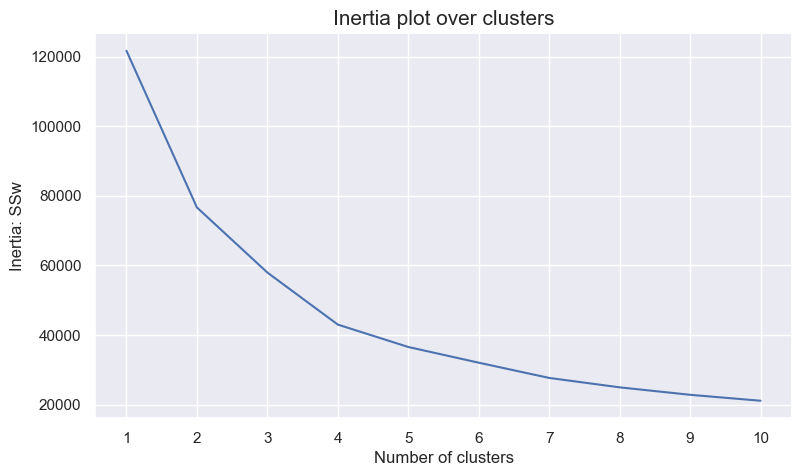

In [52]:
fig, ax = plt.subplots(figsize=(9,5))
ax.plot(range_clusters, inertia)
ax.set_xticks(range_clusters)
ax.set_ylabel("Inertia: SSw")
ax.set_xlabel("Number of clusters")
ax.set_title("Inertia plot over clusters", size=15)

plt.show()

For n_clusters = 2, the average silhouette_score is : 0.3942153688371862
For n_clusters = 3, the average silhouette_score is : 0.3335959312888399
For n_clusters = 4, the average silhouette_score is : 0.3598996614010088
For n_clusters = 5, the average silhouette_score is : 0.3571641688491427
For n_clusters = 6, the average silhouette_score is : 0.35707973383840574
For n_clusters = 7, the average silhouette_score is : 0.3400518374467008
For n_clusters = 8, the average silhouette_score is : 0.3180012480095606
For n_clusters = 9, the average silhouette_score is : 0.31270860572704184
For n_clusters = 10, the average silhouette_score is : 0.3131934911020882


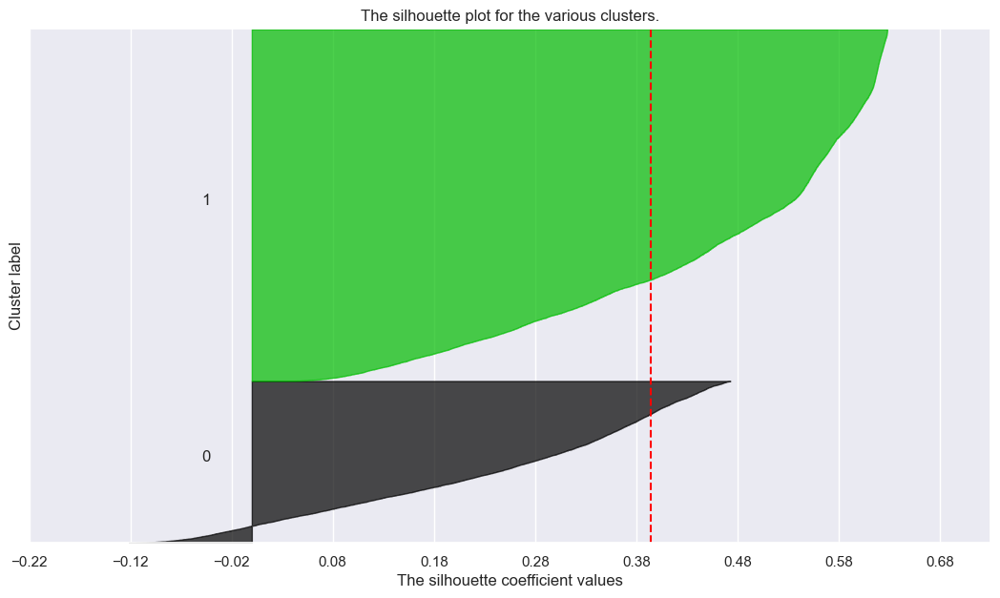

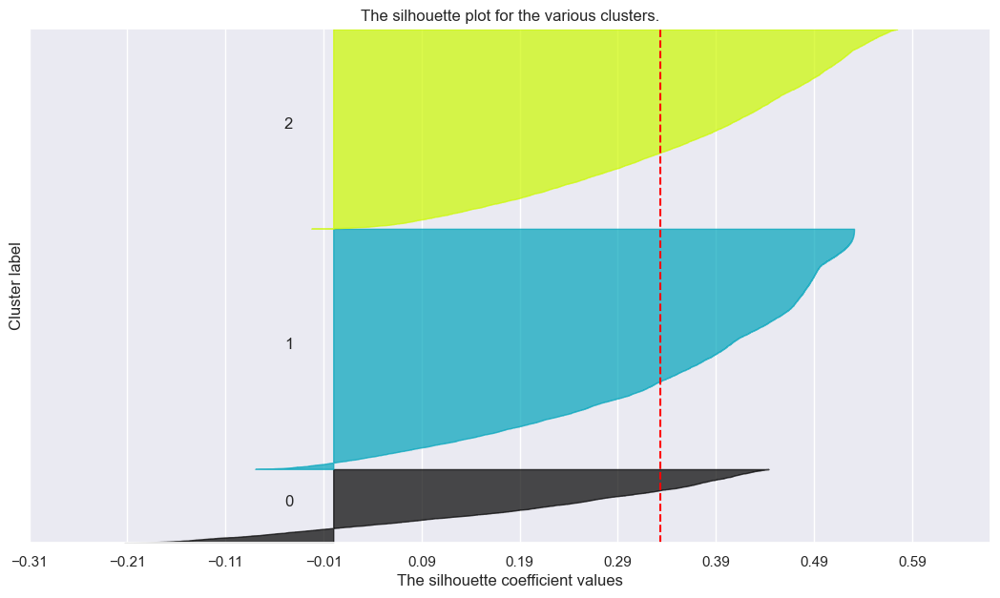

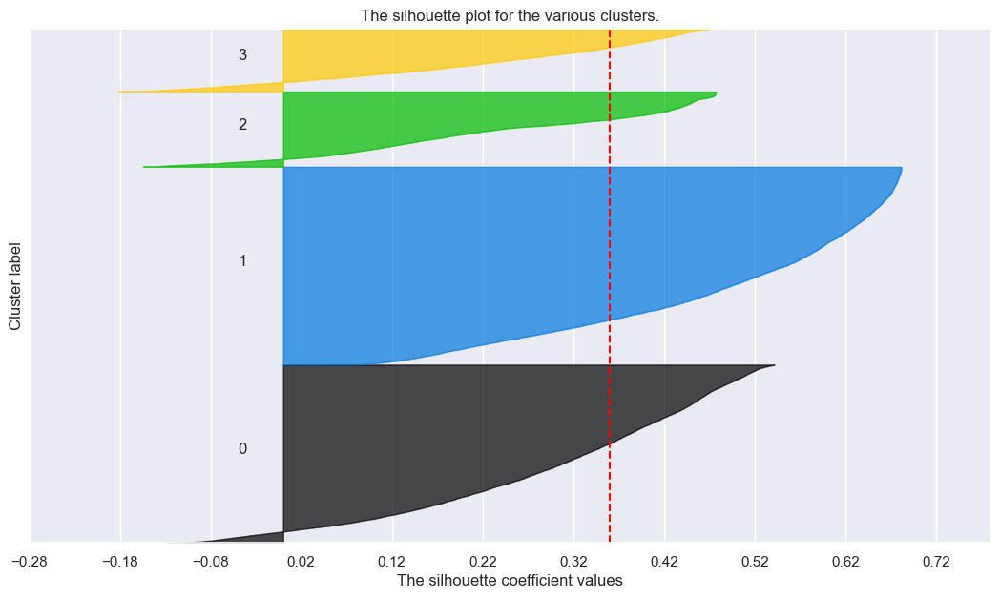

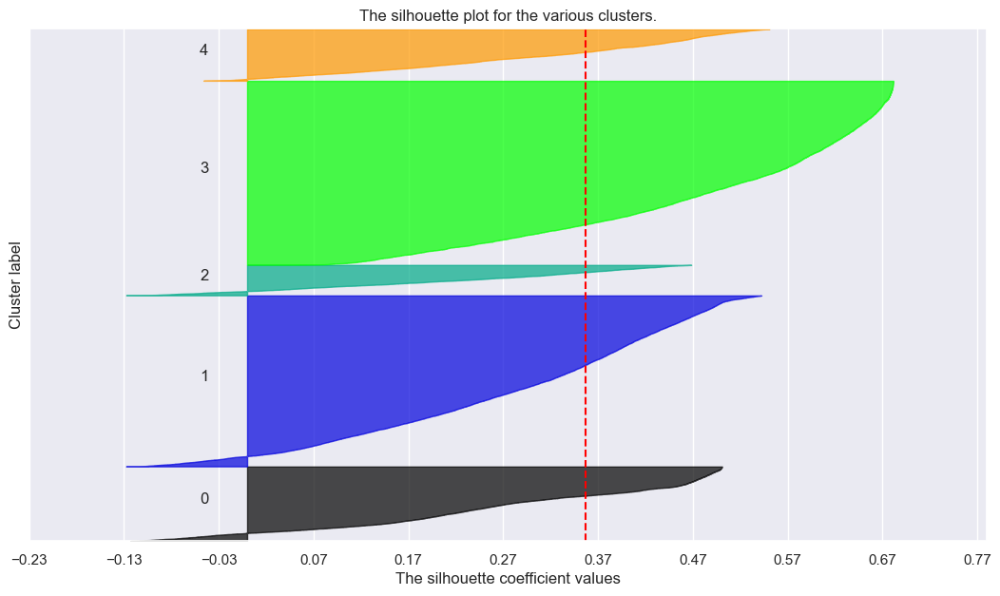

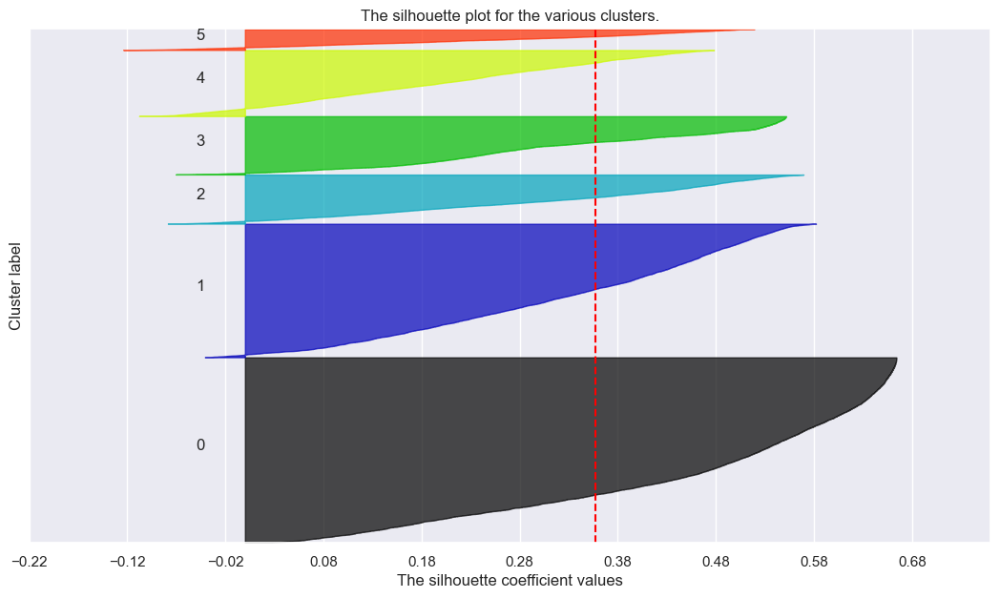

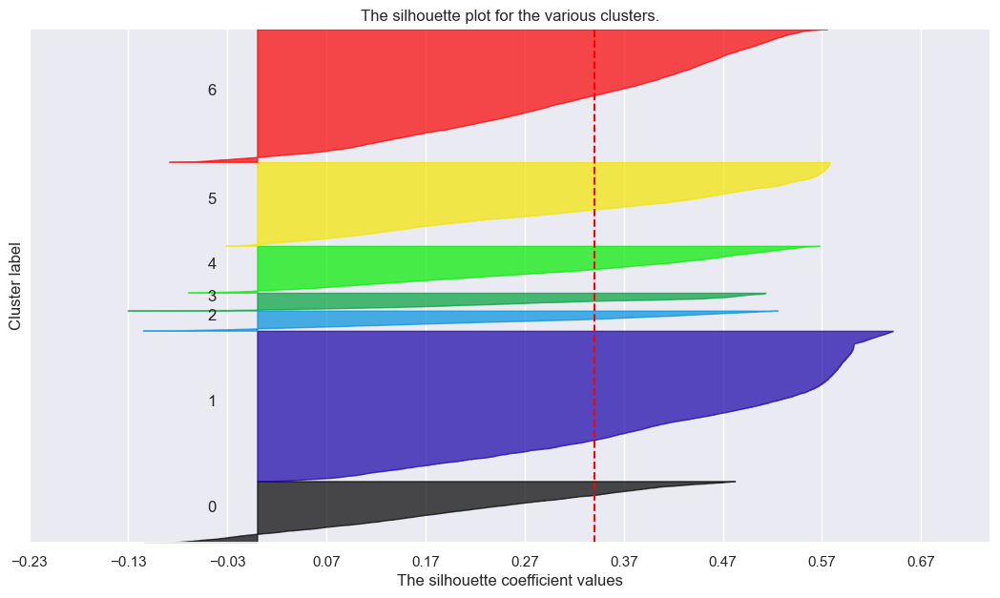

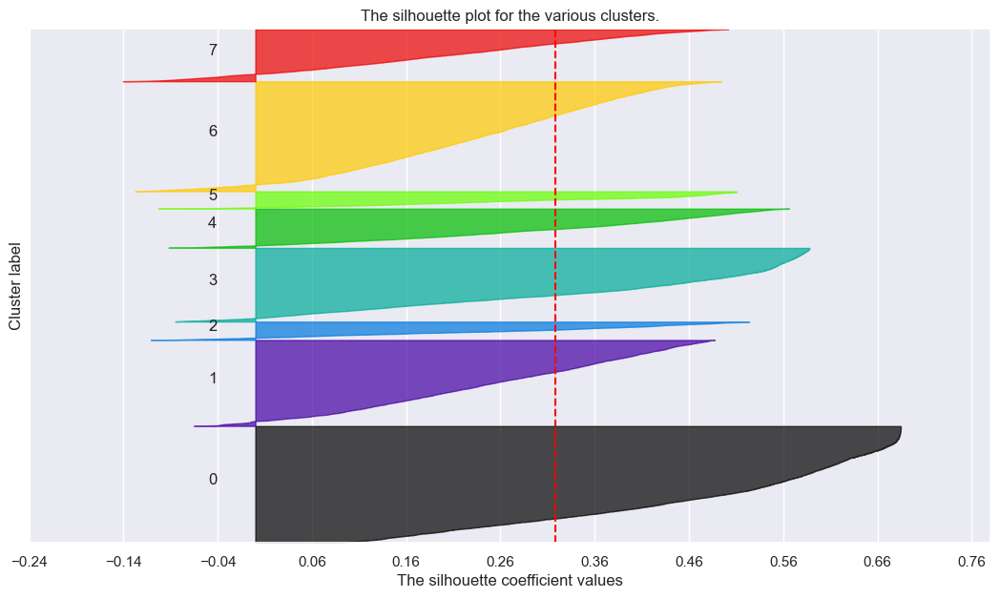

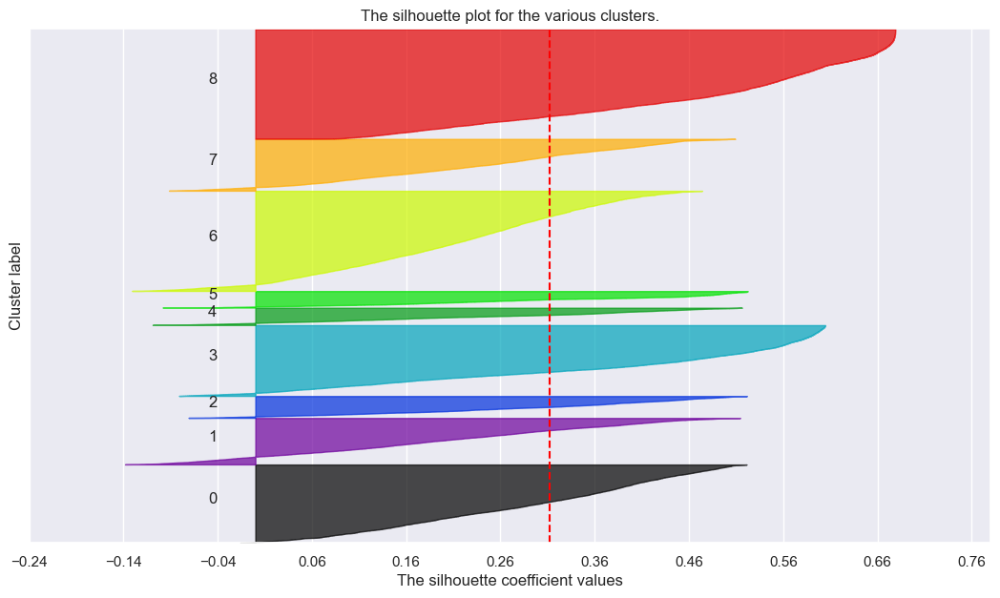

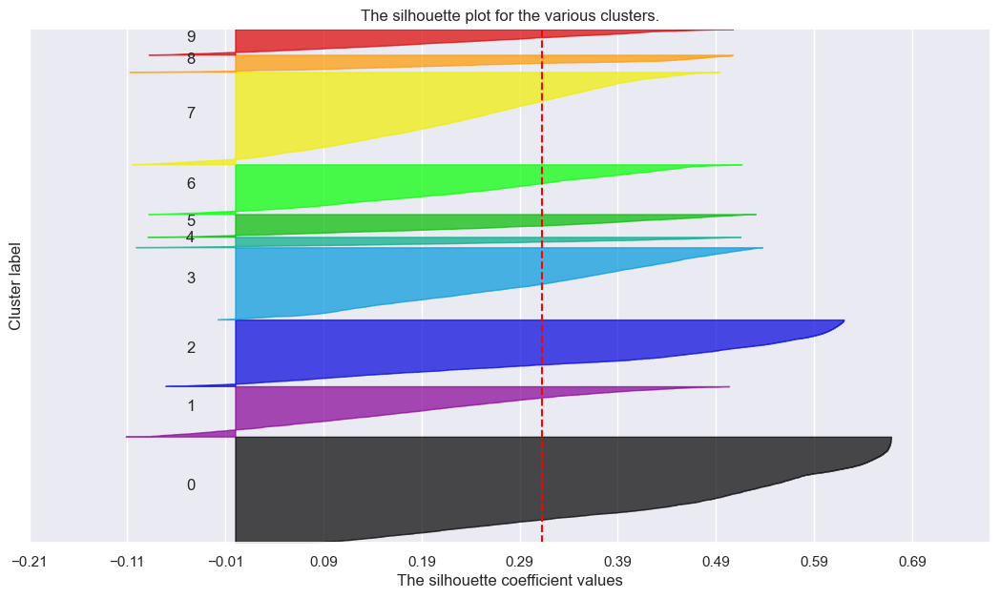

In [53]:
# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(dfs[value_loyalty_feats])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(dfs[value_loyalty_feats], cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(dfs[value_loyalty_feats], cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(dfs[value_loyalty_feats]) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

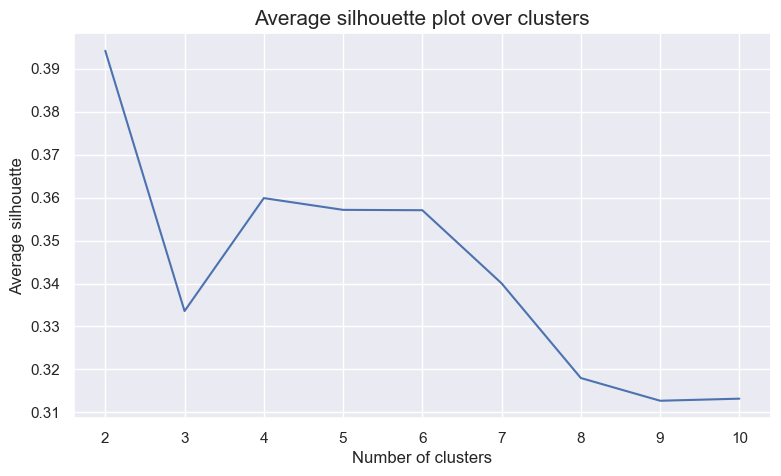

In [54]:
plt.figure(figsize=(9,5))

plt.plot(range_clusters[1:], 
         avg_silhouette)     

plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

### Final K-Means solution

**Inertia**<br>
Looking at the plot for inertia, we consider 4 (or maybe 5) to be at the "elbow".

**Silhouette Coefficient**<br>From the graphics above, we consider 4 clusters to be the optimal solution, since we want to get less number of clusters but also have a high silhouette score.

**Conclusion**<br>With this, we may try with 4 and 5 clusters.

#### 4 clusters

In [55]:
number_clusters = 4
kmclust = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels = kmclust.fit_predict(dfs[value_loyalty_feats])
km_labels

array([1, 1, 1, ..., 2, 1, 1], dtype=int32)

In [56]:
# Characterizing the final clusters
df_concat = pd.concat((dfs[value_loyalty_feats], pd.Series(km_labels, name='labels', index=df.index)), axis=1)
df_concat.groupby('labels').mean()

,total_spending,avg_order_cost,order_span,total_orders
labels,,,,
0,-0.092972,-0.377064,0.805262,0.241279
1,-0.605764,-0.363391,-0.806033,-0.586572
2,0.208894,1.755935,-0.788365,-0.658991
3,1.934301,0.114739,1.205571,1.964005


/var/folders/57/25kq17kn271f80zlcffjmj1c0000gn/T/ipykernel_68981/1527208988.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_concat, x='labels', ax=axes[1], palette=["darkblue"])
/var/folders/57/25kq17kn271f80zlcffjmj1c0000gn/T/ipykernel_68981/1527208988.py:17: UserWarning: 
The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.
  sns.countplot(data=df_concat, x='labels', ax=axes[1], palette=["darkblue"])


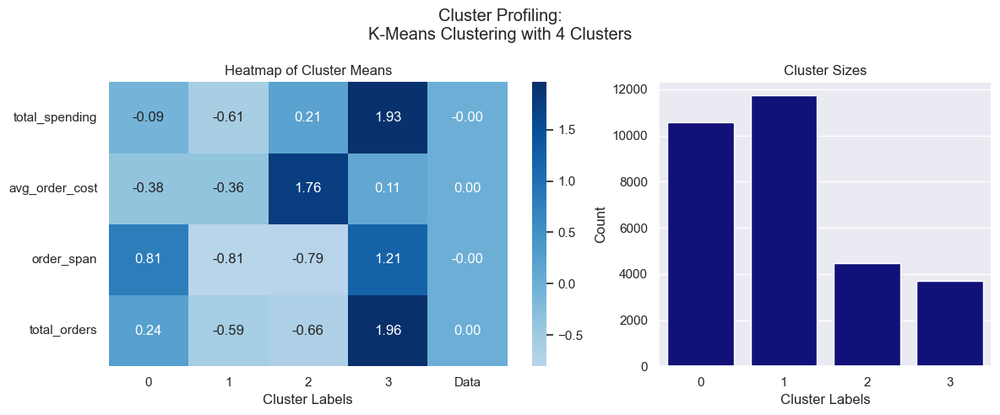

In [57]:
kmeans_profile = df_concat.groupby('labels').mean().T
df_means = df_concat[value_loyalty_feats].mean()
df_means.name = "Data"
kmeans_profile = pd.concat([kmeans_profile, df_means], axis=1)

fig, axes = plt.subplots(1, 2, figsize=(12, 5), width_ratios=[0.6, 0.4], tight_layout=True)

# Heatmap for cluster means
sns.heatmap(kmeans_profile,
            center=0, annot=True, cmap="Blues", fmt=".2f",
            ax=axes[0])
axes[0].set_xlabel("Cluster Labels")
axes[0].set_title("Heatmap of Cluster Means")
axes[0].set_yticklabels(axes[0].get_yticklabels(), rotation=0)

# Bar plot for cluster sizes
sns.countplot(data=df_concat, x='labels', ax=axes[1], palette=["darkblue"])
axes[1].set_title("Cluster Sizes")
axes[1].set_xlabel("Cluster Labels")
axes[1].set_ylabel("Count")

fig.suptitle("Cluster Profiling:\nK-Means Clustering with 4 Clusters")
plt.show()

In [58]:
df_sst_ = get_ss(df_concat, value_loyalty_feats)
df_ssb_ = get_ssb(df_concat, value_loyalty_feats, 'labels')
df_ssw_ = get_ssw(df_concat, value_loyalty_feats, 'labels')
df_rsq_ = get_rsq(df_concat, value_loyalty_feats, 'labels')

print("SSb:  ", df_ssb_)
print("SSw:  ", df_ssw_)
print("SSt:  ", df_sst_)
print("R2: ", df_rsq_)

SSb:   78672.11921994848
SSw:   43007.880780051666
SSt:   121680.00000000923
R2:  0.64654930325404


#### 5 clusters

In [59]:
number_clusters = 5
kmclust = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels = kmclust.fit_predict(dfs[value_loyalty_feats])
km_labels

array([3, 3, 3, ..., 0, 3, 3], dtype=int32)

In [60]:
# Characterizing the final clusters
df_concat = pd.concat((dfs[value_loyalty_feats], pd.Series(km_labels, name='labels', index=df.index)), axis=1)
df_concat.groupby('labels').mean()

,total_spending,avg_order_cost,order_span,total_orders
labels,,,,
0,0.100661,1.690005,-0.856345,-0.692327
1,-0.134747,-0.338616,0.723701,0.087277
2,2.861509,0.981331,1.022621,1.296811
3,-0.626729,-0.386679,-0.845318,-0.600542
4,0.851083,-0.512452,1.246726,2.081803


/var/folders/57/25kq17kn271f80zlcffjmj1c0000gn/T/ipykernel_68981/3514241059.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_concat, x='labels', ax=axes[1], palette=["darkblue"])
/var/folders/57/25kq17kn271f80zlcffjmj1c0000gn/T/ipykernel_68981/3514241059.py:17: UserWarning: 
The palette list has fewer values (1) than needed (5) and will cycle, which may produce an uninterpretable plot.
  sns.countplot(data=df_concat, x='labels', ax=axes[1], palette=["darkblue"])


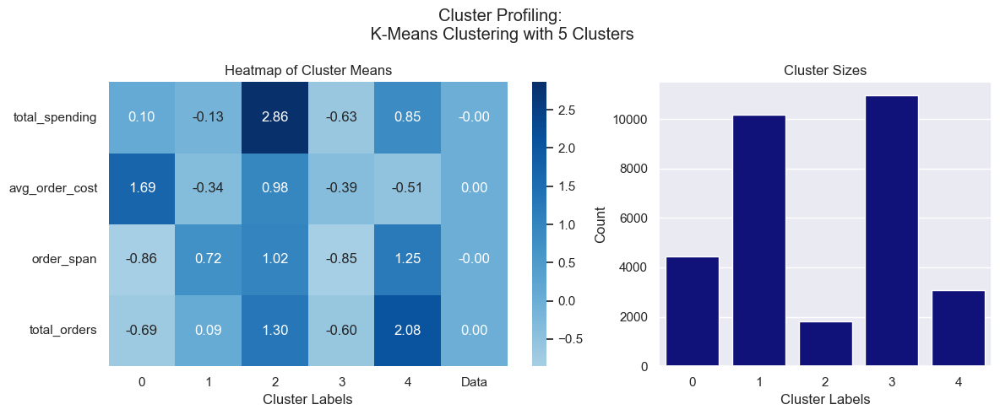

In [61]:
kmeans_profile = df_concat.groupby('labels').mean().T
df_means = df_concat[value_loyalty_feats].mean()
df_means.name = "Data"
kmeans_profile = pd.concat([kmeans_profile, df_means], axis=1)

fig, axes = plt.subplots(1, 2, figsize=(12, 5), width_ratios=[0.6, 0.4], tight_layout=True)

# Heatmap for cluster means
sns.heatmap(kmeans_profile,
            center=0, annot=True, cmap="Blues", fmt=".2f",
            ax=axes[0])
axes[0].set_xlabel("Cluster Labels")
axes[0].set_title("Heatmap of Cluster Means")
axes[0].set_yticklabels(axes[0].get_yticklabels(), rotation=0)

# Bar plot for cluster sizes
sns.countplot(data=df_concat, x='labels', ax=axes[1], palette=["darkblue"])
axes[1].set_title("Cluster Sizes")
axes[1].set_xlabel("Cluster Labels")
axes[1].set_ylabel("Count")

fig.suptitle("Cluster Profiling:\n K-Means Clustering with 5 Clusters")
plt.show()

In [62]:
df_sst_ = get_ss(df_concat, value_loyalty_feats)
df_ssb_ = get_ssb(df_concat, value_loyalty_feats, 'labels')
df_ssw_ = get_ssw(df_concat, value_loyalty_feats, 'labels')
df_rsq_ = get_rsq(df_concat, value_loyalty_feats, 'labels')

print("SSb:  ", df_ssb_)
print("SSw:  ", df_ssw_)
print("SSt:  ", df_sst_)
print("R2: ", df_rsq_)

SSb:   85108.39848233355
SSw:   36571.601517666204
SSt:   121680.00000000923
R2:  0.6994444319718653


### Insights for K-Means (Value and Loyalty Features)

**5 Cluster Solution**:

$R^2$ = 0.699; Silhouette Score = 0.357

Cluster 0: This cluster represents customers that have a short order span and consequently a low number of total orders, but still manage to reach a moderate total spending, since they spend a lot per order.

Cluster 1: A large cluster that includes customers that have been users for a moderate time period, with a low average order cost, total spending, and total orders. These customers exhibit low engagement with the business.

Cluster 2: This small cluster represents the highest-value customers, characterized by the high total spending, total orders, and their long-lasting loyalty. Their average order cost is also relatively high, indicating frequent interactions contributions to revenue.

Cluster 3: The largest cluster, represents customers with low total spending, short order spans, and low average order costs. These customers contribute the least to overall revenue, likely representing new or inactive users.

Cluster 4: This cluster includes customers with a moderate total spending and the longest time-period users. Although their average order cost is relatively low, their frequent interactions, as reflected in their higher total orders, make them valuable long-term customers.

**4 Cluster Solution**:

$R^2$ = 0.647; Silhouette Score = 0.360

Cluster 0 represents the customers with longer engagement periods than the ones in cluster 1 and a increase in total spend, but do not spend much or make frequent orders compare to the rest, being our second larger cluster.

Cluster 1 represents again disengaged users who spend very little, have a short ordering span, and make few orders, and is still our largest cluster.

Cluster 2 represents customers with a high-spend per purchases, although having the lowest total orders count.

Cluster 3 represents high-value, consistent users who order frequently and over a long period, our most valuable segment.

**Conclusion**: This method, with the *4 clusters solution*, seems to be a more consistent and insightful approach to the value perspective. Both these clusters-solution provide consistent information with the solutions obtained in Hierarchical method, being very similar in terms of interpretation. 

## 1.3. Gaussian Mixture Model

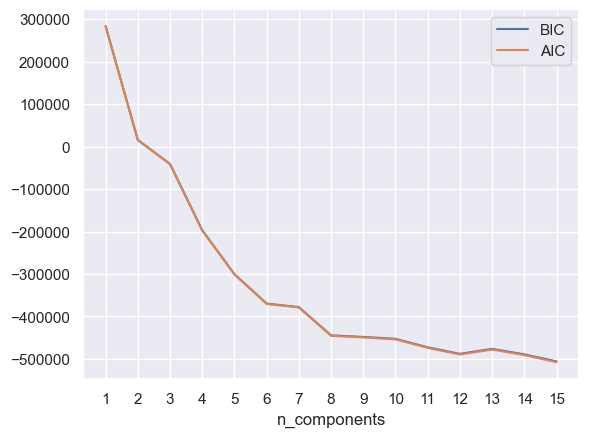

In [63]:
n_components = np.arange(1, 16)
models = [GaussianMixture(n, covariance_type='full', n_init=10, random_state=1).fit(dfs[value_loyalty_feats])
          for n in n_components]

bic_values = [m.bic(dfs[value_loyalty_feats]) for m in models]
aic_values = [m.aic(dfs[value_loyalty_feats]) for m in models]
plt.plot(n_components, bic_values, label='BIC')
plt.plot(n_components, aic_values, label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components')
plt.xticks(n_components)
plt.show()

We consider the optimal n_components = 6, not having a significant decrease in AIC after that.

In [64]:
gmm = GaussianMixture(n_components=6, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
gmm_labels = gmm.fit_predict(dfs[value_loyalty_feats])

In [65]:
df_concat = pd.concat([dfs[value_loyalty_feats], pd.Series(gmm_labels, index=df.index, name="gmm_labels")], axis=1)
df_concat.head()

,total_spending,avg_order_cost,order_span,total_orders,gmm_labels
customer_id,,,,,
1b8f824d5e,-0.131439,0.525391,-1.145656,-0.560796,5
5d272b9dcb,-0.439643,-0.095357,-1.145656,-0.560796,5
f6d1b2ba63,-0.758683,-0.737931,-1.145656,-0.560796,5
180c632ed8,-0.046021,0.697429,-1.110690,-0.560796,5
4eb37a6705,0.715087,2.230362,-1.110690,-0.560796,5


In [66]:
def get_ss(df):
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  

In [67]:
sst = get_ss(dfs[value_loyalty_feats]) 
ssw_labels = df_concat.groupby(by='gmm_labels').apply(get_ss)  
ssb = sst - np.sum(ssw_labels)  
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.5216


/var/folders/57/25kq17kn271f80zlcffjmj1c0000gn/T/ipykernel_68981/679215021.py:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ssw_labels = df_concat.groupby(by='gmm_labels').apply(get_ss)


/var/folders/57/25kq17kn271f80zlcffjmj1c0000gn/T/ipykernel_68981/3051091005.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_concat, x='gmm_labels', ax=axes[1], palette=["darkblue"])
/var/folders/57/25kq17kn271f80zlcffjmj1c0000gn/T/ipykernel_68981/3051091005.py:17: UserWarning: 
The palette list has fewer values (1) than needed (6) and will cycle, which may produce an uninterpretable plot.
  sns.countplot(data=df_concat, x='gmm_labels', ax=axes[1], palette=["darkblue"])


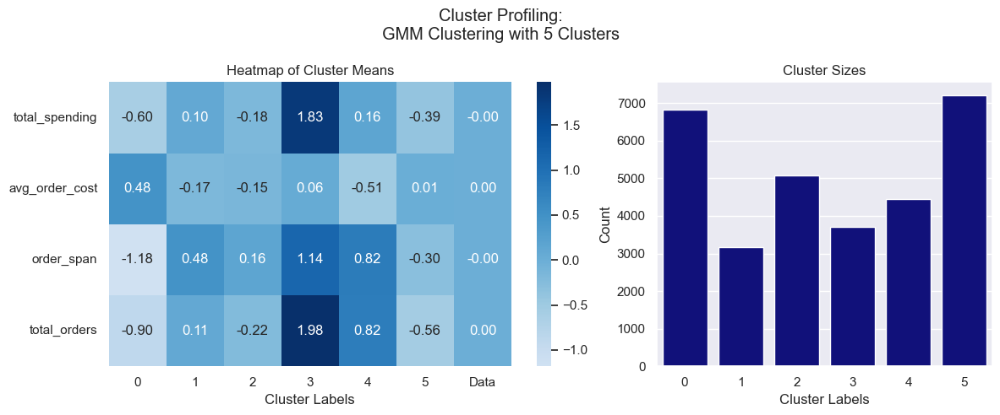

In [68]:
gmm_profile = df_concat.groupby('gmm_labels').mean().T
df_means = df_concat[value_loyalty_feats].mean()
df_means.name = "Data"
gmm_profile = pd.concat([gmm_profile, df_means], axis=1)

fig, axes = plt.subplots(1, 2, figsize=(12, 5), width_ratios=[0.6, 0.4], tight_layout=True)

# Heatmap for cluster means
sns.heatmap(gmm_profile,
            center=0, annot=True, cmap="Blues", fmt=".2f",
            ax=axes[0])
axes[0].set_xlabel("Cluster Labels")
axes[0].set_title("Heatmap of Cluster Means")
axes[0].set_yticklabels(axes[0].get_yticklabels(), rotation=0)

# Bar plot for cluster sizes
sns.countplot(data=df_concat, x='gmm_labels', ax=axes[1], palette=["darkblue"])
axes[1].set_title("Cluster Sizes")
axes[1].set_xlabel("Cluster Labels")
axes[1].set_ylabel("Count")

fig.suptitle("Cluster Profiling:\nGMM Clustering with 5 Clusters")
plt.show()

### Insights for Gaussian Mixture Model (Value and Loyalty Features)

**6 Clusters**

Silhouette score = 0.522

Cluster 0 represents short-period customers that have a high-spending purchasers per order.
 
Cluster 1 represents moderate customers, that are not very engaged.

Cluster 2 represents low-value customers with limited spending, who are not single users but have limited interactions with the platform.

Cluster 3 represents the majority, our highest-value customers, characterized by the high total spending, total orders, and their long-lasting loyalty. Their average order cost is not very high, indicating frequent interactions to reach their high-valule pattern.

Cluster 4 represents loyal customers that have been consistent and frequent, but they do not spend a lot each time resulting in a not very high total spending.

**Conclusion**: This 5-cluster solution does not segment into very insightful and specific type of customers.

## 1.4. Self-Organizing Maps

#### SOM

In [73]:
M = 30
N = 30
neighborhood_function = 'gaussian' 
topology = 'hexagonal' 
n_feats = len(value_loyalty_feats)
learning_rate = 0.5
sigma=2.5

som_data = dfs[value_loyalty_feats].values

sm = MiniSom(M, N,             
             n_feats,           
             learning_rate=learning_rate, 
             topology=topology, 
             neighborhood_function=neighborhood_function, 
             activation_distance='euclidean',
             random_seed=42,
             sigma=sigma
             )


som_data = dfs[value_loyalty_feats].values
sm.random_weights_init(som_data) 

print(np.round(sm.quantization_error(som_data),4), "Starting QE")
print(np.round(sm.topographic_error(som_data),4), "Starting TE")

sm.train_batch(som_data, 500000)
print(np.round(sm.quantization_error(som_data),4),"Ending QE")
print(np.round(sm.topographic_error(som_data),4),"Ending TE")


/opt/anaconda3/lib/python3.12/site-packages/minisom.py:631: RuntimeWarning: invalid value encountered in sqrt
  return sqrt(-2 * cross_term + input_data_sq + weights_flat_sq.T)


0.1531 Starting QE
0.9932 Starting TE
0.1765 Ending QE
0.0876 Ending TE


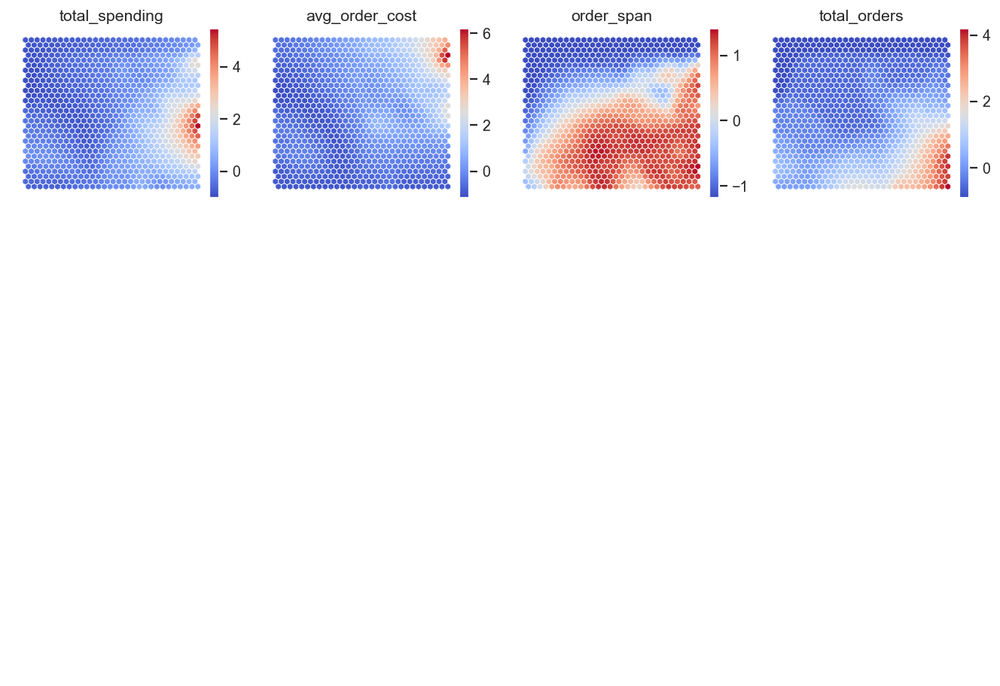

In [74]:
weights = sm.get_weights()

figsize=(10,7)
fig = plt.figure(figsize=figsize, constrained_layout=True, dpi=128, )

subfigs = fig.subfigures(3,4,wspace=.15)

colornorm = mpl_colors.Normalize(vmin=np.min(weights), vmax=np.max(weights))

for cpi, sf in zip(range(len(value_loyalty_feats)), subfigs.flatten()):
    
    matrix_vals = weights[:,:,cpi]
    vext = np.max(np.abs([np.min(matrix_vals), np.max(matrix_vals)]))
    colornorm = mpl_colors.Normalize(vmin=np.min(matrix_vals), vmax=np.max(matrix_vals))


    sf = plot_hexagons(sm, sf, 
                    colornorm,
                    matrix_vals,
                    label=value_loyalty_feats[cpi],
                    cmap=cm.coolwarm,
                    )

**total_spending**: The majority of our customers are in lower spending range (blue regions), but we still have a high-density areas (red spots) where customers have very high spending.

**avg_order_cost**: We see a small high-density cluster (red) indicating customers with significantly high average order costs, but the majority of customers fall into a lower average order cost range.

**order_span**: The red cluster highlights our customers that have a long order span (who have been engaging for a long period of time). The blue areas represent customers with shorter spans, possibly disengaged users or one-time buyers. We can see that our data set is mainly split in these two categories.

**total_orders**: We identify some customers with high order frequency, showing consistent behavior, represented by red. The blue regions represent infrequent users, being the majority of the customers.


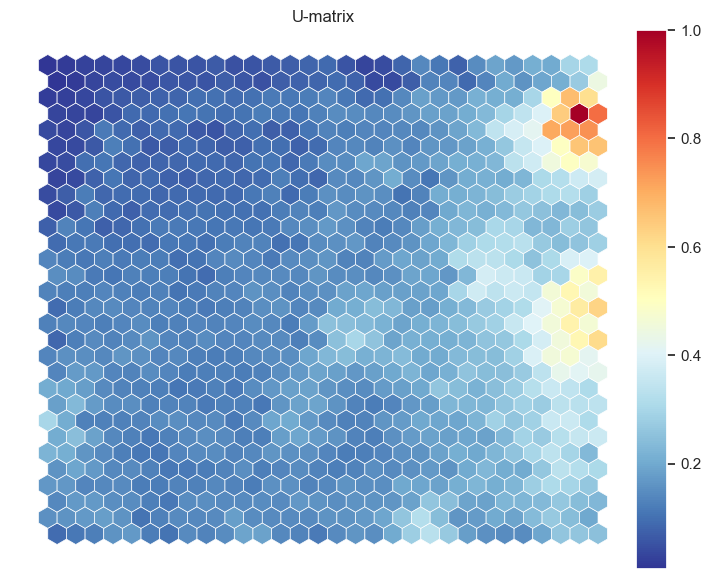

In [75]:
umatrix = sm.distance_map(scaling='mean')
fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=np.min(umatrix), vmax=np.max(umatrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    umatrix,
                    label="U-matrix",
                    cmap=cm.RdYlBu_r,
                    )

Although the U-matrix does not seem to clarify the number of clusters, it is clear a small outlier cluster, represented in warm colors.<br>
This should correspond to the customers do not ordered a lot of orderes yet, but have moderate total spending and order span with high average spend per order.

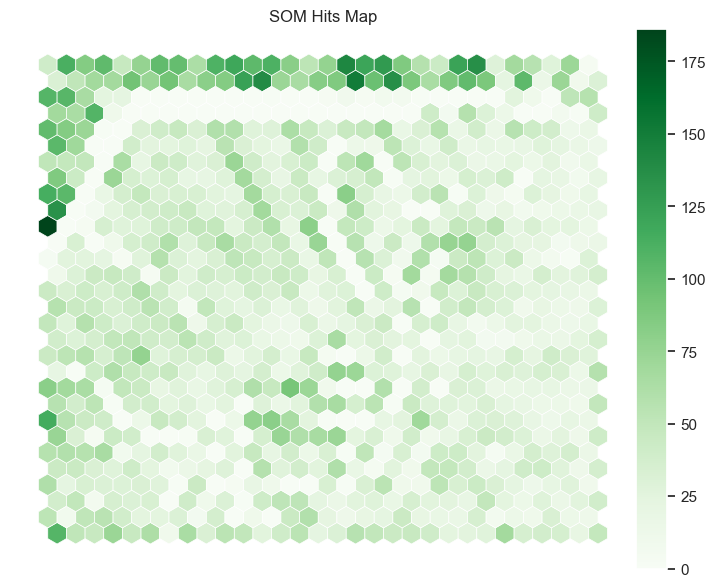

In [76]:
hitsmatrix = sm.activation_response(dfs[value_loyalty_feats].values)


fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(hitsmatrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    hitsmatrix,
                    label="SOM Hits Map",
                    cmap=cm.Greens,
                    )


 The darker green hexagons represent nodes with a higher concentration of data points, and the lighter areas have fewer hits. High-density nodes on the right and upper diagonal regions suggest clusters with a large number of similar data points, which aligns with the visualization of the U matrix, since these regions also have smaller distances within. 

In [77]:
weights_flat = sm.get_weights().reshape((M*N),len(value_loyalty_feats))
weights_flat.shape

(900, 4)

In [78]:
sm.quantization_error(som_data)

0.17650354499716236

In [79]:
sm.topographic_error(som_data)

0.08757396449704147

### Insights for SOM (Value and Loyalty Features)

The quantization and topographic erros show to be very minimal.

Per se, the SOM does not provide a specific cluster solution nor a great segmentation.

### 1.4.1 K-means on top of SOM

#### 5 clusters

In [80]:
def predict_som_clusters(som, data, hclust_matrix):
    predictions = []
    for x in data:
        bmu = som.winner(x)  
        cluster = hclust_matrix[bmu]  
        predictions.append(cluster)
    return predictions

In [81]:
kmeans = KMeans(n_clusters=5, init='k-means++', n_init=20, random_state=42)
nodeclus_labels = kmeans.fit_predict(weights_flat)

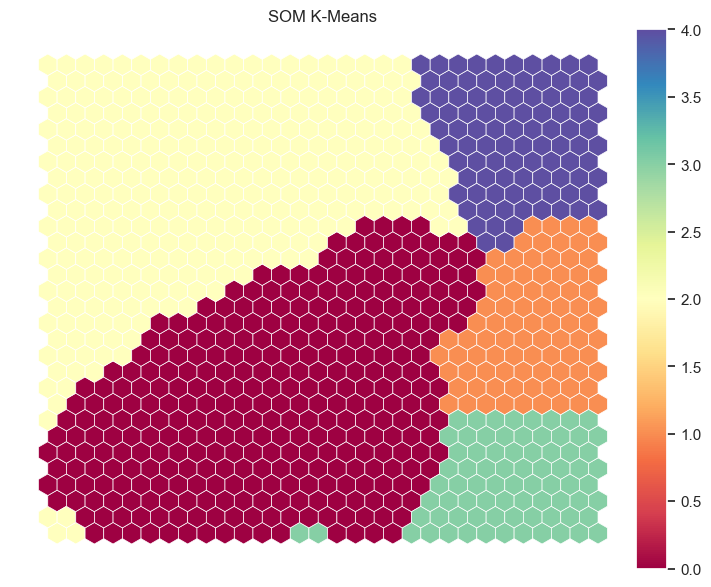

In [82]:
kmeans_matrix = nodeclus_labels.reshape((M,N))

fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(kmeans_matrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    kmeans_matrix,
                    label="SOM K-Means",
                    cmap=cm.Spectral,
                    )


In [83]:
value_loyalty_labels5 = predict_som_clusters(sm, som_data, kmeans_matrix)

In [84]:
df_final = pd.concat([
                dfs[value_loyalty_feats],
                pd.Series(value_loyalty_labels5, name='labels', index=df.index)
            ], axis=1
            )

df_final

,total_spending,avg_order_cost,order_span,total_orders,labels
customer_id,,,,,
1b8f824d5e,-0.131439,0.525391,-1.145656,-0.560796,2
5d272b9dcb,-0.439643,-0.095357,-1.145656,-0.560796,2
f6d1b2ba63,-0.758683,-0.737931,-1.145656,-0.560796,2
180c632ed8,-0.046021,0.697429,-1.110690,-0.560796,2
4eb37a6705,0.715087,2.230362,-1.110690,-0.560796,4
...,...,...,...,...,...
f4e366c281,-0.476933,0.987582,-1.180621,-0.897965,2
f6b6709018,-0.476933,0.987582,-1.180621,-0.897965,2
f74ad8ce3f,-0.484901,0.955486,-1.180621,-0.897965,2


In [85]:
sil_score = silhouette_score(dfs[value_loyalty_feats], value_loyalty_labels5)
print(sil_score) 

0.36196523589206175


In [86]:
def get_ss(df, feats):
    """
    Calculate the sum of squares (SS) for the given DataFrame.

    The sum of squares is computed as the sum of the variances of each column
    multiplied by the number of non-NA/null observations minus one.

    Parameters:
    df (pandas.DataFrame): The input DataFrame for which the sum of squares is to be calculated.
    feats (list of str): A list of feature column names to be used in the calculation.

    Returns:
    float: The sum of squares of the DataFrame.
    """
    df_ = df[feats]
    ss = np.sum(df_.var() * (df_.count() - 1))
    
    return ss 


In [87]:
df_sst_ = get_ss(df_final, value_loyalty_feats)
df_ssb_ = get_ssb(df_final, value_loyalty_feats, 'labels')
df_ssw_ = get_ssw(df_final, value_loyalty_feats, 'labels')
df_rsq_ = get_rsq(df_final, value_loyalty_feats, 'labels')

print("SSb:  ", df_ssb_)
print("SSw:  ", df_ssw_)
print("SSt:  ", df_sst_)
print("R2: ", df_rsq_)

SSb:   83997.09536475998
SSw:   37682.90463524016
SSt:   121680.00000000923
R2:  0.6903114346216528


/var/folders/57/25kq17kn271f80zlcffjmj1c0000gn/T/ipykernel_68981/4200988031.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_final, x='labels', ax=axes[1], palette=["darkblue"])
/var/folders/57/25kq17kn271f80zlcffjmj1c0000gn/T/ipykernel_68981/4200988031.py:17: UserWarning: 
The palette list has fewer values (1) than needed (5) and will cycle, which may produce an uninterpretable plot.
  sns.countplot(data=df_final, x='labels', ax=axes[1], palette=["darkblue"])


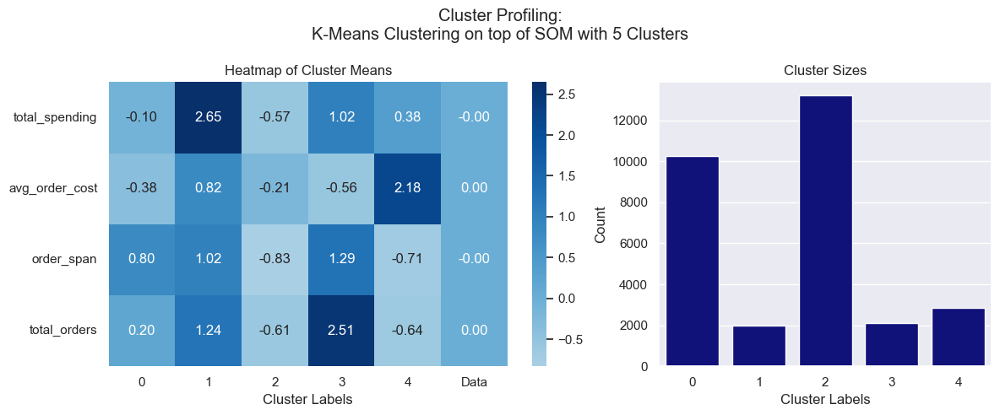

In [88]:
kmeans_profile = df_final.groupby('labels').mean().T
df_means = df_final[value_loyalty_feats].mean()
df_means.name = "Data"
kmeans_profile = pd.concat([kmeans_profile, df_means], axis=1)

fig, axes = plt.subplots(1, 2, figsize=(12, 5), width_ratios=[0.6, 0.4], tight_layout=True)

# Heatmap for cluster means
sns.heatmap(kmeans_profile,
            center=0, annot=True, cmap="Blues", fmt=".2f",
            ax=axes[0])
axes[0].set_xlabel("Cluster Labels")
axes[0].set_title("Heatmap of Cluster Means")
axes[0].set_yticklabels(axes[0].get_yticklabels(), rotation=0)

# Bar plot for cluster sizes
sns.countplot(data=df_final, x='labels', ax=axes[1], palette=["darkblue"])
axes[1].set_title("Cluster Sizes")
axes[1].set_xlabel("Cluster Labels")
axes[1].set_ylabel("Count")

fig.suptitle("Cluster Profiling:\nK-Means Clustering on top of SOM with 5 Clusters")
plt.show()

#### 4 clusters

In [89]:
kmeans = KMeans(n_clusters=4, init='k-means++', n_init=20, random_state=42)
nodeclus_labels = kmeans.fit_predict(weights_flat)

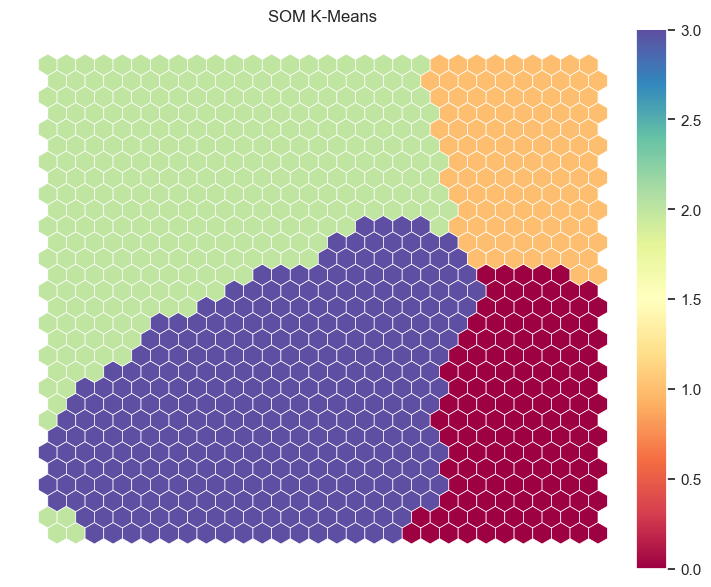

In [90]:
kmeans_matrix = nodeclus_labels.reshape((M,N))

fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(kmeans_matrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    kmeans_matrix,
                    label="SOM K-Means",
                    cmap=cm.Spectral,
                    )


In [91]:
value_loyalty_labels4 = predict_som_clusters(sm, som_data, kmeans_matrix)

In [92]:
df_final = pd.concat([
                dfs[value_loyalty_feats],
                pd.Series(value_loyalty_labels4, name='labels', index=df.index)
            ], axis=1
            )

df_final

,total_spending,avg_order_cost,order_span,total_orders,labels
customer_id,,,,,
1b8f824d5e,-0.131439,0.525391,-1.145656,-0.560796,2
5d272b9dcb,-0.439643,-0.095357,-1.145656,-0.560796,2
f6d1b2ba63,-0.758683,-0.737931,-1.145656,-0.560796,2
180c632ed8,-0.046021,0.697429,-1.110690,-0.560796,2
4eb37a6705,0.715087,2.230362,-1.110690,-0.560796,1
...,...,...,...,...,...
f4e366c281,-0.476933,0.987582,-1.180621,-0.897965,2
f6b6709018,-0.476933,0.987582,-1.180621,-0.897965,2
f74ad8ce3f,-0.484901,0.955486,-1.180621,-0.897965,2


In [93]:
sil_score = silhouette_score(dfs[value_loyalty_feats], value_loyalty_labels4)
print(sil_score) 

0.3628029542111488


In [94]:
df_sst_ = get_ss(df_final, value_loyalty_feats)
df_ssb_ = get_ssb(df_final, value_loyalty_feats, 'labels')
df_ssw_ = get_ssw(df_final, value_loyalty_feats, 'labels')
df_rsq_ = get_rsq(df_final, value_loyalty_feats, 'labels')

print("SSb:  ", df_ssb_)
print("SSw:  ", df_ssw_)
print("SSt:  ", df_sst_)
print("R2: ", df_rsq_)

SSb:   77843.5732747255
SSw:   43836.42672527561
SSt:   121680.00000000923
R2:  0.6397400827969075


/var/folders/57/25kq17kn271f80zlcffjmj1c0000gn/T/ipykernel_68981/3428021590.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_final, x='labels', ax=axes[1], palette=["darkblue"])
/var/folders/57/25kq17kn271f80zlcffjmj1c0000gn/T/ipykernel_68981/3428021590.py:15: UserWarning: 
The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.
  sns.countplot(data=df_final, x='labels', ax=axes[1], palette=["darkblue"])


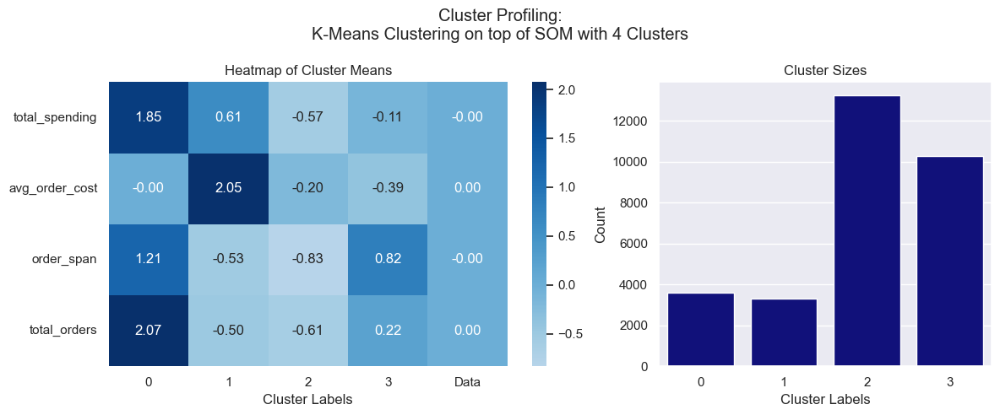

In [95]:
kmeans_profile = df_final.groupby('labels').mean().T
df_means = df_final[value_loyalty_feats].mean()
df_means.name = "Data"
kmeans_profile = pd.concat([kmeans_profile, df_means], axis=1)

fig, axes = plt.subplots(1, 2, figsize=(12, 5), width_ratios=[0.6, 0.4], tight_layout=True)

sns.heatmap(kmeans_profile,
            center=0, annot=True, cmap="Blues", fmt=".2f",
            ax=axes[0])
axes[0].set_xlabel("Cluster Labels")
axes[0].set_title("Heatmap of Cluster Means")
axes[0].set_yticklabels(axes[0].get_yticklabels(), rotation=0)

sns.countplot(data=df_final, x='labels', ax=axes[1], palette=["darkblue"])
axes[1].set_title("Cluster Sizes")
axes[1].set_xlabel("Cluster Labels")
axes[1].set_ylabel("Count")

fig.suptitle("Cluster Profiling:\nK-Means Clustering on top of SOM with 4 Clusters")
plt.show()

In [96]:
pd.crosstab(
    pd.Series(value_loyalty_labels5, name='labels3', index=df.index),
    pd.Series(value_loyalty_labels4, name='labels4', index=df.index),
    )

labels4,0,1,2,3
labels3,,,,
0,37,129,0,10106
1,1598,364,0,37
2,0,62,13135,0
3,1958,0,0,156
4,0,2738,100,0


#### Insights for K-Means on SOM (Value and Loyalty Features)

**5 Clusters**

The Self-Organizing map seems to have unfolded correctly, has a good silhouette score (0.362) and $R^2$ (0.690), and the cluster differences in sizes seems acceptable. 

**4 Clusters**

The Self-Organizing map seems to have unfolded correctly, has a good silhouette score (0.363) and $R^2$ (0.640), and the cluster differences in sizes seems acceptable. 

**Conclusion**: This approach with 5 clusters seems to be a promising method, that is the best in terms of the trade-off between both silhouette, $R^2$ and interpretability . 

### 1.4.2 Hierarchical on top of SOM

#### 5 clusters

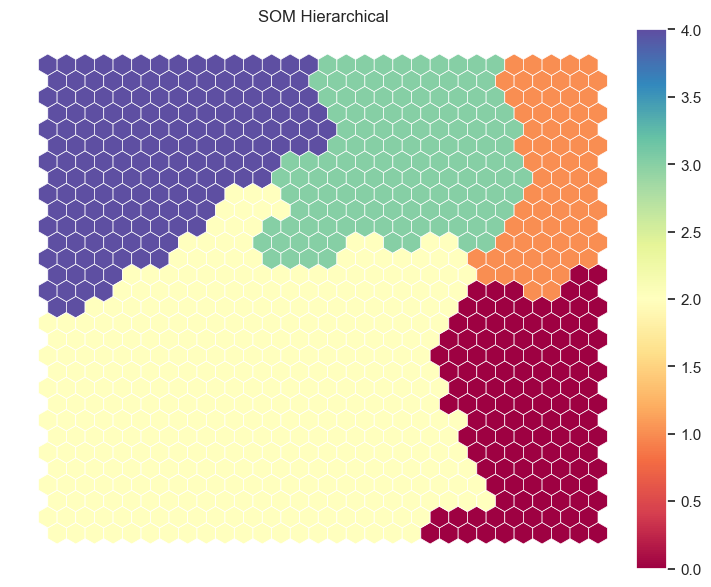

In [97]:
# Perform Hierarchical clustering on top of the MxN units 
hierclust = AgglomerativeClustering(n_clusters=5, linkage='ward')
nodeclus_labels = hierclust.fit_predict(weights_flat)
hclust_matrix = nodeclus_labels.reshape((M,N))

fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(hclust_matrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    hclust_matrix,
                    label="SOM Hierarchical",
                    cmap=cm.Spectral,
                    )

In [98]:
value_loyalty_labels5 = predict_som_clusters(sm, som_data, hclust_matrix)

In [99]:
df_final = pd.concat([
                dfs[value_loyalty_feats],
                pd.Series(value_loyalty_labels5, name='labels', index=df.index)
            ], axis=1
            )

df_final

,total_spending,avg_order_cost,order_span,total_orders,labels
customer_id,,,,,
1b8f824d5e,-0.131439,0.525391,-1.145656,-0.560796,3
5d272b9dcb,-0.439643,-0.095357,-1.145656,-0.560796,4
f6d1b2ba63,-0.758683,-0.737931,-1.145656,-0.560796,4
180c632ed8,-0.046021,0.697429,-1.110690,-0.560796,3
4eb37a6705,0.715087,2.230362,-1.110690,-0.560796,3
...,...,...,...,...,...
f4e366c281,-0.476933,0.987582,-1.180621,-0.897965,3
f6b6709018,-0.476933,0.987582,-1.180621,-0.897965,3
f74ad8ce3f,-0.484901,0.955486,-1.180621,-0.897965,3


In [100]:
sil_score = silhouette_score(dfs[value_loyalty_feats], value_loyalty_labels5)
print(sil_score) #silhouette score

0.29000259746153245


In [101]:
df_sst_ = get_ss(df_final, value_loyalty_feats)
df_ssb_ = get_ssb(df_final, value_loyalty_feats, 'labels')
df_ssw_ = get_ssw(df_final, value_loyalty_feats, 'labels')
df_rsq_ = get_rsq(df_final, value_loyalty_feats, 'labels')
print("SSb:  ", df_ssb_)
print("SSw:  ", df_ssw_)
print("SSt:  ", df_sst_)
print("R2: ", df_rsq_)

SSb:   78108.24434657366
SSw:   43571.75565342629
SSt:   121680.00000000923
R2:  0.6419152230981018


/var/folders/57/25kq17kn271f80zlcffjmj1c0000gn/T/ipykernel_68981/4253261373.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_final, x='labels', ax=axes[1], palette=["darkblue"])
/var/folders/57/25kq17kn271f80zlcffjmj1c0000gn/T/ipykernel_68981/4253261373.py:18: UserWarning: 
The palette list has fewer values (1) than needed (5) and will cycle, which may produce an uninterpretable plot.
  sns.countplot(data=df_final, x='labels', ax=axes[1], palette=["darkblue"])


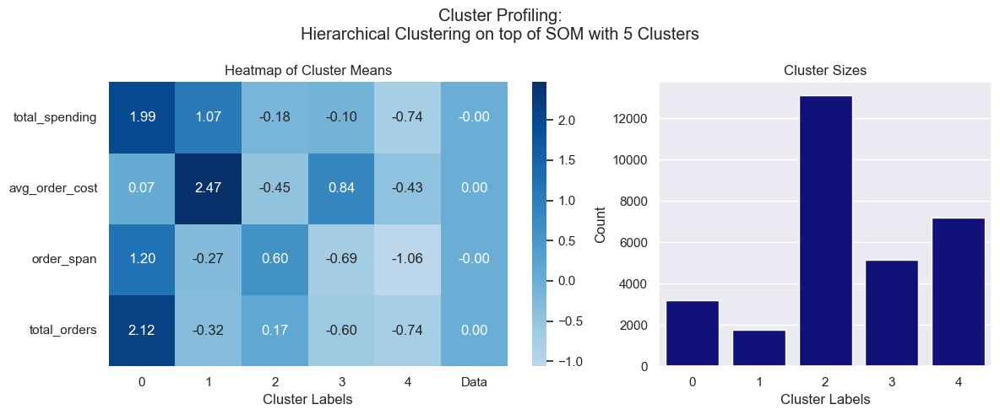

In [102]:
hc_profile = df_final.groupby('labels').mean().T
df_means = df_final[value_loyalty_feats].mean()
df_means.name = "Data"
hc_profile = pd.concat([hc_profile, df_means], axis=1)

# Set up the figure with subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 5), width_ratios=[0.6, 0.4], tight_layout=True)

# Heatmap for cluster means
sns.heatmap(hc_profile,
            center=0, annot=True, cmap="Blues", fmt=".2f",
            ax=axes[0])
axes[0].set_xlabel("Cluster Labels")
axes[0].set_title("Heatmap of Cluster Means")
axes[0].set_yticklabels(axes[0].get_yticklabels(), rotation=0)

# Bar plot for cluster sizes
sns.countplot(data=df_final, x='labels', ax=axes[1], palette=["darkblue"])
axes[1].set_title("Cluster Sizes")
axes[1].set_xlabel("Cluster Labels")
axes[1].set_ylabel("Count")

# Set an overall title for the figure
fig.suptitle("Cluster Profiling:\nHierarchical Clustering on top of SOM with 5 Clusters")
plt.show()

#### 4 clusters

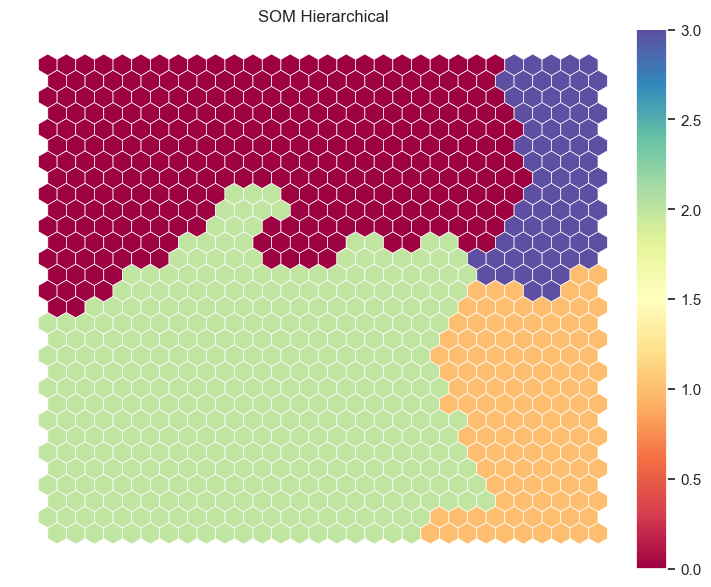

In [103]:
# Perform Hierarchical clustering on top of the MxN units 
hierclust = AgglomerativeClustering(n_clusters=4, linkage='ward')
nodeclus_labels = hierclust.fit_predict(weights_flat)
hclust_matrix = nodeclus_labels.reshape((M,N))

fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(hclust_matrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    hclust_matrix,
                    label="SOM Hierarchical",
                    cmap=cm.Spectral,
                    )

In [104]:
value_loyalty_labels4 = predict_som_clusters(sm, som_data, hclust_matrix)

In [105]:
df_final = pd.concat([
                dfs[value_loyalty_feats],
                pd.Series(value_loyalty_labels4, name='labels', index=df.index)
            ], axis=1
            )

df_final

,total_spending,avg_order_cost,order_span,total_orders,labels
customer_id,,,,,
1b8f824d5e,-0.131439,0.525391,-1.145656,-0.560796,0
5d272b9dcb,-0.439643,-0.095357,-1.145656,-0.560796,0
f6d1b2ba63,-0.758683,-0.737931,-1.145656,-0.560796,0
180c632ed8,-0.046021,0.697429,-1.110690,-0.560796,0
4eb37a6705,0.715087,2.230362,-1.110690,-0.560796,0
...,...,...,...,...,...
f4e366c281,-0.476933,0.987582,-1.180621,-0.897965,0
f6b6709018,-0.476933,0.987582,-1.180621,-0.897965,0
f74ad8ce3f,-0.484901,0.955486,-1.180621,-0.897965,0


In [106]:
sil_score = silhouette_score(dfs[value_loyalty_feats], value_loyalty_labels4)
print(sil_score) 

0.3129578990066953


In [107]:
df_sst_ = get_ss(df_final, value_loyalty_feats)
df_ssb_ = get_ssb(df_final, value_loyalty_feats, 'labels')
df_ssw_ = get_ssw(df_final, value_loyalty_feats, 'labels')
df_rsq_ = get_rsq(df_final, value_loyalty_feats, 'labels')
print("SSb:  ", df_ssb_)
print("SSw:  ", df_ssw_)
print("SSt:  ", df_sst_)
print("R2: ", df_rsq_)

SSb:   71572.60451751693
SSw:   50107.39548248295
SSt:   121680.00000000923
R2:  0.5882035216758782


/var/folders/57/25kq17kn271f80zlcffjmj1c0000gn/T/ipykernel_68981/1917517182.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_final, x='labels', ax=axes[1], palette=["darkblue"])
/var/folders/57/25kq17kn271f80zlcffjmj1c0000gn/T/ipykernel_68981/1917517182.py:17: UserWarning: 
The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.
  sns.countplot(data=df_final, x='labels', ax=axes[1], palette=["darkblue"])


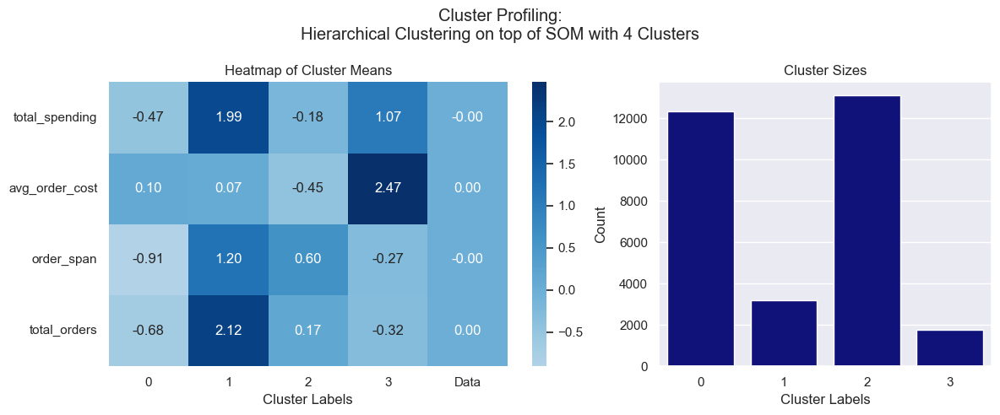

In [108]:
hc_profile = df_final.groupby('labels').mean().T
df_means = df_final[value_loyalty_feats].mean()
df_means.name = "Data"
hc_profile = pd.concat([hc_profile, df_means], axis=1)

fig, axes = plt.subplots(1, 2, figsize=(12, 5), width_ratios=[0.6, 0.4], tight_layout=True)

# Heatmap for cluster means
sns.heatmap(hc_profile,
            center=0, annot=True, cmap="Blues", fmt=".2f",
            ax=axes[0])
axes[0].set_xlabel("Cluster Labels")
axes[0].set_title("Heatmap of Cluster Means")
axes[0].set_yticklabels(axes[0].get_yticklabels(), rotation=0)

# Bar plot for cluster sizes
sns.countplot(data=df_final, x='labels', ax=axes[1], palette=["darkblue"])
axes[1].set_title("Cluster Sizes")
axes[1].set_xlabel("Cluster Labels")
axes[1].set_ylabel("Count")

fig.suptitle("Cluster Profiling:\nHierarchical Clustering on top of SOM with 4 Clusters")
plt.show()

The cluster solution provided by both the Hierarchical and K-Means appplied to the SOM are similar. They identify two larger clusters, two smaller groups and one moderate sized cluster, what is consistens with our previous findings.

#### Insights for Hierarchical on SOM (Value and Loyalty Features)

**4 Clusters**

The Self-Organizing map seems to have unfolded correctly, has a good silhouette score (0.313) and $R^2$ (0.588), and the cluster differences in sizes seems acceptable. 

**5 Clusters**

The Self-Organizing map seems to have unfolded correctly, has a good silhouette score (0.290) and $R^2$ (0.642), and the cluster differences in sizes seems acceptable. 

**Conclusion**: This approach with 4 clusters seems to be a promising method, that is the best in terms of the trade-off between both silhouette, $R^2$ and interpretability . 

# 2. PERSPECTIVE 2 - Preference

## Defining features

In [109]:
preference_feats = ['cui_diversity_score', 'is_chain', 'dow_diversity_score']

## 2.1. Hierarchical

**`Hierarchical Dendogram`**

In [110]:
linkage_ = 'ward'
distance = 'euclidean' 
hclust = AgglomerativeClustering(linkage= linkage_, metric=distance, distance_threshold=0, n_clusters=None)
hclust.fit_predict(dfs[preference_feats])

array([30419, 30418, 30417, ...,     2,     1,     0])

In [111]:
# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

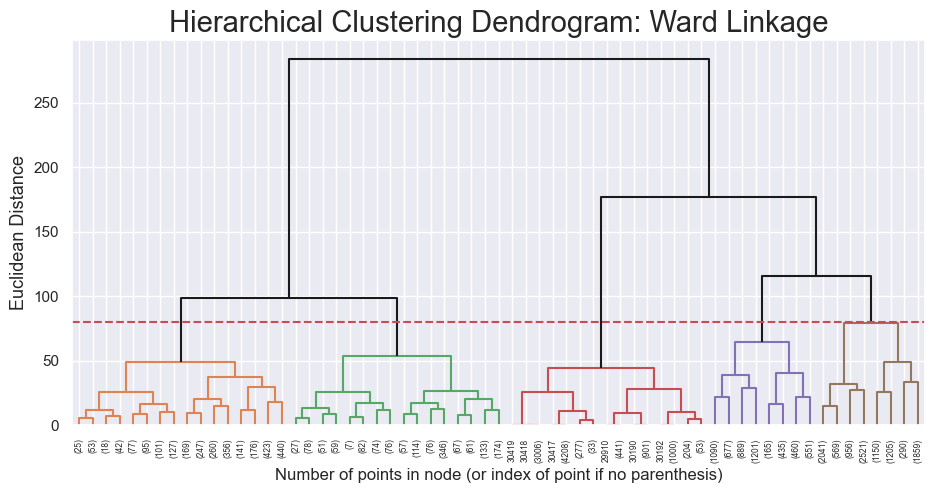

In [112]:
sns.set()
fig = plt.figure(figsize=(11,5))
y_threshold = 80
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering Dendrogram: {linkage_.title()} Linkage', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

### Final Hierarchical Clustering solution
Trying with 4 and 5 clusters

#### 5 clusters

In [113]:
linkage_ = "ward"
distance = "euclidean"

In [114]:
n_clusters = 5

hclust = AgglomerativeClustering(linkage=linkage_, metric=distance, n_clusters=n_clusters)
hc_labels = hclust.fit_predict(dfs[preference_feats])

df_concat = pd.concat([
    dfs[preference_feats], 
    pd.Series(hc_labels, name='labels', index=df.index)
    ], 
    axis=1)

In [115]:
df_sst_ = get_ss(df_concat, preference_feats)
df_ssb_ = get_ssb(df_concat, preference_feats, 'labels')
df_ssw_ = get_ssw(df_concat, preference_feats, 'labels')
df_rsq_ = get_rsq(df_concat, preference_feats, 'labels')

print("SSb:  ", df_ssb_)
print("SSw:  ", df_ssw_)
print("SSt:  ", df_sst_)
print("R2: ", df_rsq_)

SSb:   67566.04429755289
SSw:   23693.95570244651
SSt:   91259.99999999497
R2:  0.7403686642291494


In [116]:
sil_score = silhouette_score(dfs[preference_feats], hc_labels)
print(sil_score) 

0.34393070196612985


/var/folders/57/25kq17kn271f80zlcffjmj1c0000gn/T/ipykernel_68981/3073849847.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_concat, x='labels', ax=axes[1], palette=["darkblue"])
/var/folders/57/25kq17kn271f80zlcffjmj1c0000gn/T/ipykernel_68981/3073849847.py:17: UserWarning: 
The palette list has fewer values (1) than needed (5) and will cycle, which may produce an uninterpretable plot.
  sns.countplot(data=df_concat, x='labels', ax=axes[1], palette=["darkblue"])


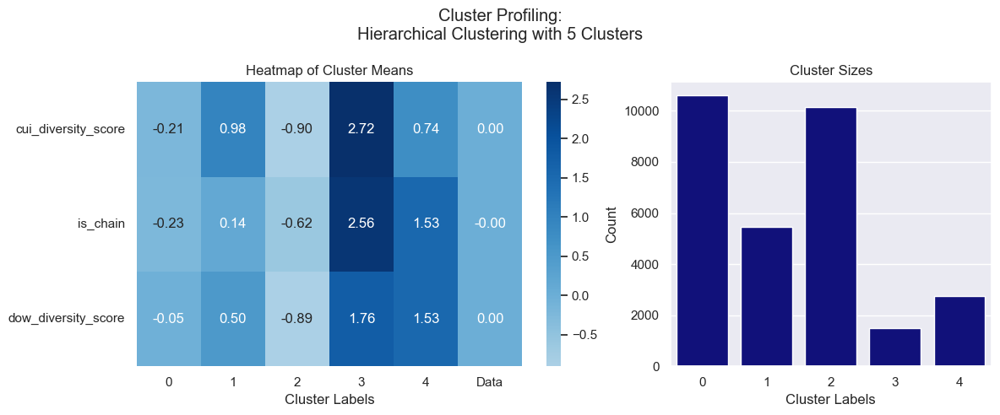

In [117]:
hc_profile = df_concat.groupby('labels').mean().T
df_means = df_concat[preference_feats].mean()
df_means.name = "Data"
hc_profile = pd.concat([hc_profile, df_means], axis=1)

fig, axes = plt.subplots(1, 2, figsize=(12, 5), width_ratios=[0.6, 0.4], tight_layout=True)

# Heatmap for cluster means
sns.heatmap(hc_profile,
            center=0, annot=True, cmap="Blues", fmt=".2f",
            ax=axes[0])
axes[0].set_xlabel("Cluster Labels")
axes[0].set_title("Heatmap of Cluster Means")
axes[0].set_yticklabels(axes[0].get_yticklabels(), rotation=0)

# Bar plot for cluster sizes
sns.countplot(data=df_concat, x='labels', ax=axes[1], palette=["darkblue"])
axes[1].set_title("Cluster Sizes")
axes[1].set_xlabel("Cluster Labels")
axes[1].set_ylabel("Count")

fig.suptitle("Cluster Profiling:\nHierarchical Clustering with 5 Clusters")
plt.show()

#### 4 clusters

In [118]:
n_clusters = 4

hclust = AgglomerativeClustering(linkage=linkage_, metric=distance, n_clusters=n_clusters)
hc_labels = hclust.fit_predict(dfs[preference_feats])

df_concat = pd.concat([
    dfs[preference_feats], 
    pd.Series(hc_labels, name='labels', index=df.index)
    ], 
    axis=1)

In [119]:
df_sst_ = get_ss(df_concat, preference_feats)
df_ssb_ = get_ssb(df_concat, preference_feats, 'labels')
df_ssw_ = get_ssw(df_concat, preference_feats, 'labels')
df_rsq_ = get_rsq(df_concat, preference_feats, 'labels')

print("SSb:  ", df_ssb_)
print("SSw:  ", df_ssw_)
print("SSt:  ", df_sst_)
print("R2: ", df_rsq_)

SSb:   62714.27175645708
SSw:   28545.728243542082
SSt:   91259.99999999497
R2:  0.6872043804126271


In [120]:
sil_score = silhouette_score(dfs[preference_feats], hc_labels)
print(sil_score)

0.3371632721895197


/var/folders/57/25kq17kn271f80zlcffjmj1c0000gn/T/ipykernel_68981/2019372134.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_concat, x='labels', ax=axes[1], palette=["darkblue"])
/var/folders/57/25kq17kn271f80zlcffjmj1c0000gn/T/ipykernel_68981/2019372134.py:17: UserWarning: 
The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.
  sns.countplot(data=df_concat, x='labels', ax=axes[1], palette=["darkblue"])


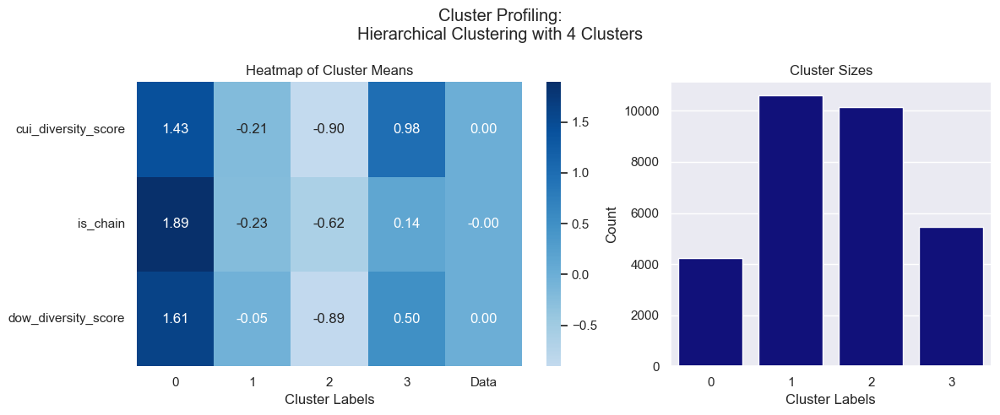

In [121]:
hc_profile = df_concat.groupby('labels').mean().T
df_means = df_concat[preference_feats].mean()
df_means.name = "Data"
hc_profile = pd.concat([hc_profile, df_means], axis=1)

fig, axes = plt.subplots(1, 2, figsize=(12, 5), width_ratios=[0.6, 0.4], tight_layout=True)

# Heatmap for cluster means
sns.heatmap(hc_profile,
            center=0, annot=True, cmap="Blues", fmt=".2f",
            ax=axes[0])
axes[0].set_xlabel("Cluster Labels")
axes[0].set_title("Heatmap of Cluster Means")
axes[0].set_yticklabels(axes[0].get_yticklabels(), rotation=0)

# Bar plot for cluster sizes
sns.countplot(data=df_concat, x='labels', ax=axes[1], palette=["darkblue"])
axes[1].set_title("Cluster Sizes")
axes[1].set_xlabel("Cluster Labels")
axes[1].set_ylabel("Count")

fig.suptitle("Cluster Profiling:\nHierarchical Clustering with 4 Clusters")
plt.show()

### Insights for Hierarchical (Preference Features)

**5 Clusters**

$R^2$=0.740; Silhouette Score=0.344


**4 Clusters**

$R^2$=0.687; Silhouette Score=0.337


**Conclusion**: Hierarchical clustering with the *5 clusters solution* seems to be a good cluster approach to the preference perspective, because it has a higher score together with more direct interpretability and less imbalance overall of cluster sizes.

## 2.2. K-Means

In [122]:
range_clusters = range(1, 11)
inertia = []
for n_clus in range_clusters:  
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(dfs[preference_feats])
    inertia.append(kmclust.inertia_)  

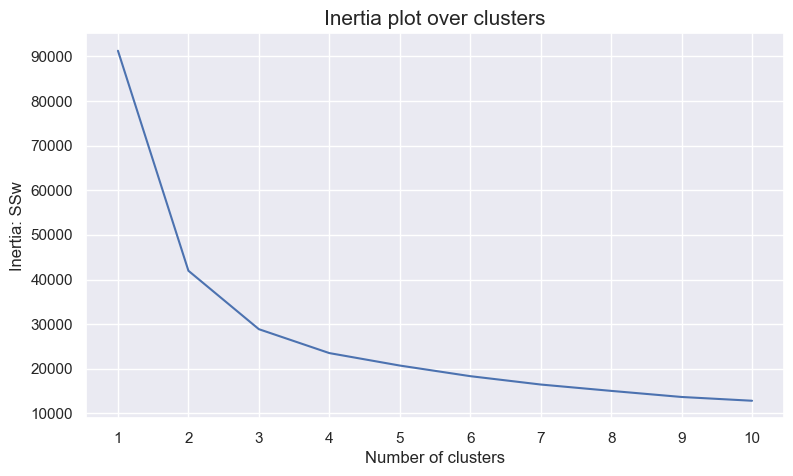

In [123]:
fig, ax = plt.subplots(figsize=(9,5))

ax.plot(range_clusters, inertia)
ax.set_xticks(range_clusters)
ax.set_ylabel("Inertia: SSw")
ax.set_xlabel("Number of clusters")
ax.set_title("Inertia plot over clusters", size=15)

plt.show()

For n_clusters = 2, the average silhouette_score is : 0.5419842116637014
For n_clusters = 3, the average silhouette_score is : 0.45317017612152505
For n_clusters = 4, the average silhouette_score is : 0.3814016851452844
For n_clusters = 5, the average silhouette_score is : 0.3616667838565323
For n_clusters = 6, the average silhouette_score is : 0.3768362083603364
For n_clusters = 7, the average silhouette_score is : 0.38970780962156043
For n_clusters = 8, the average silhouette_score is : 0.3955842130311849
For n_clusters = 9, the average silhouette_score is : 0.4166587910822397
For n_clusters = 10, the average silhouette_score is : 0.42662458572227335


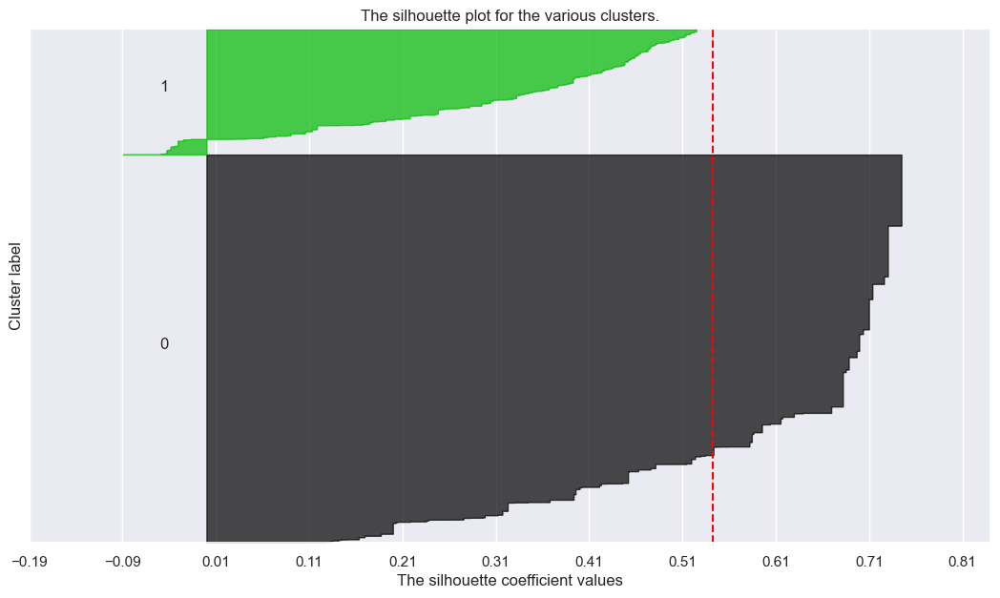

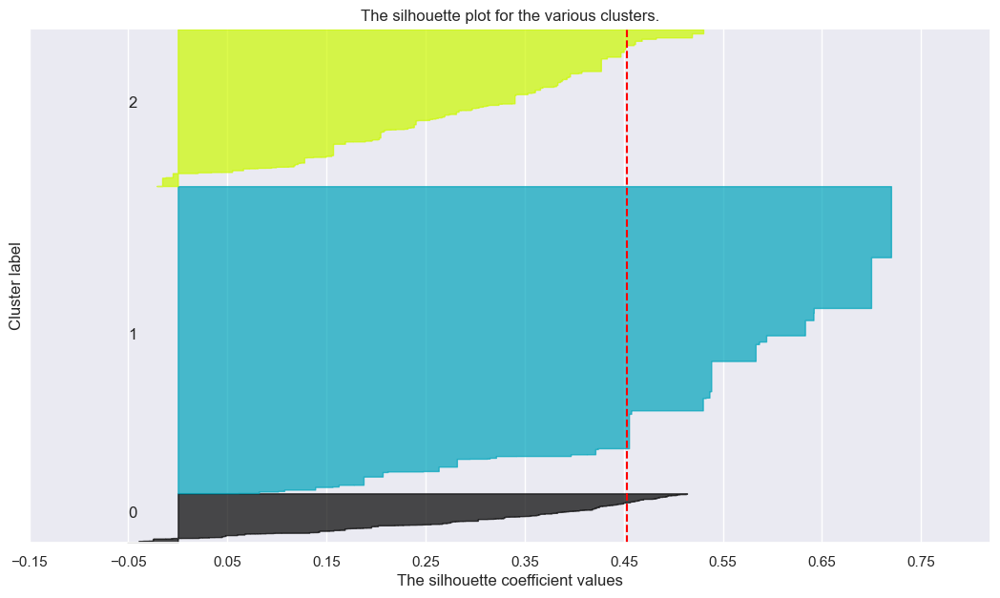

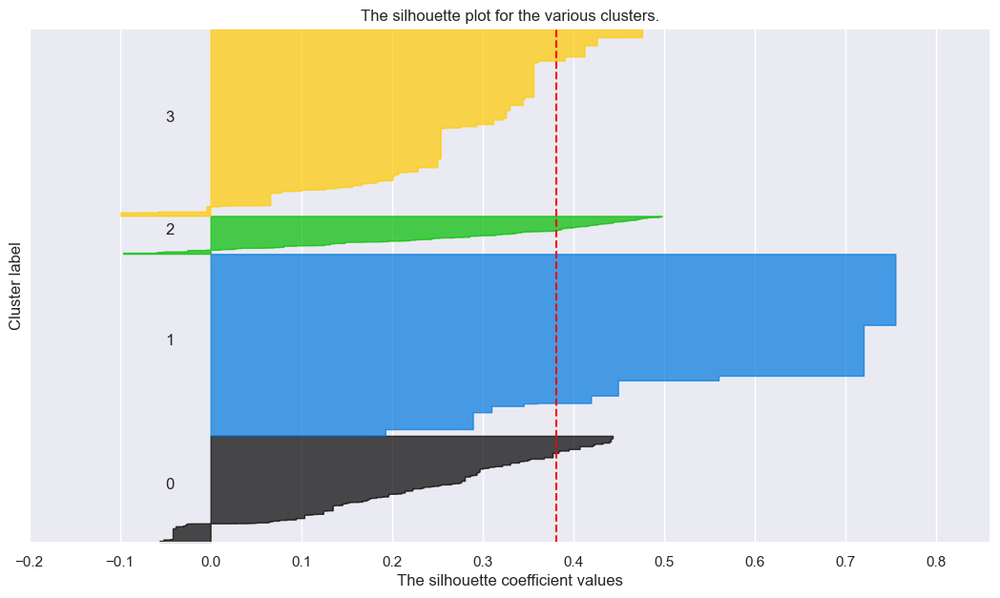

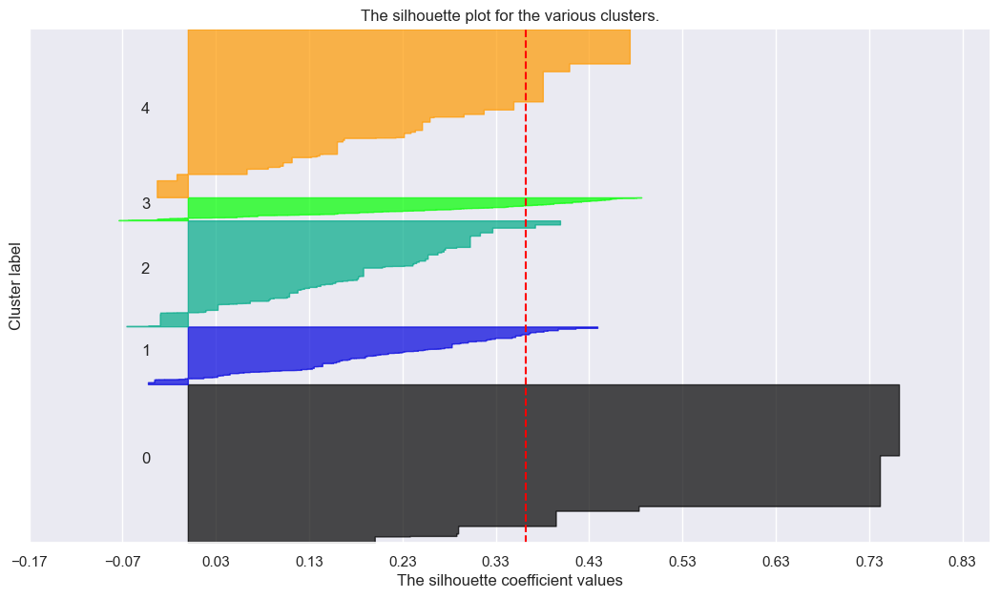

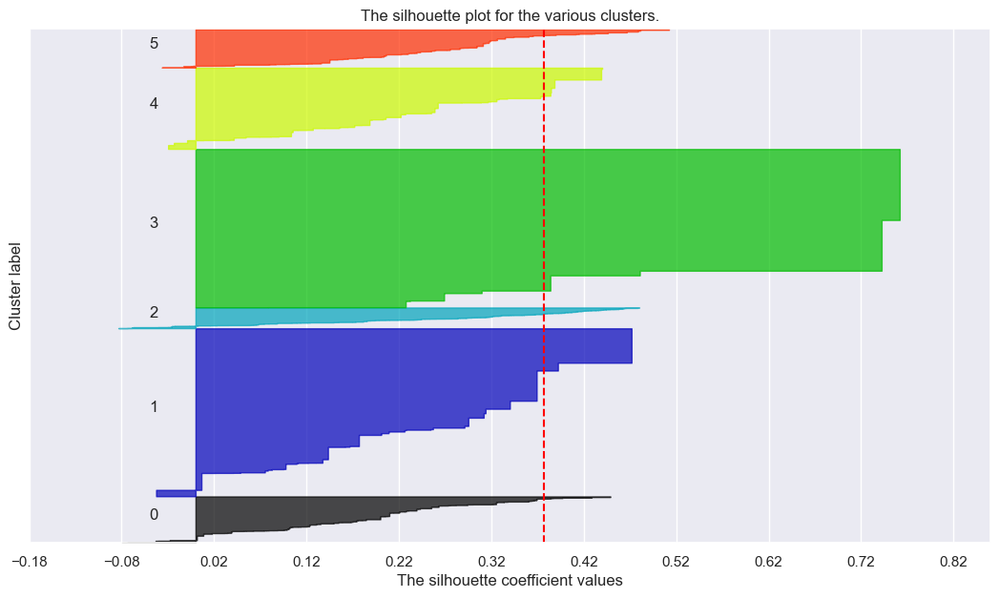

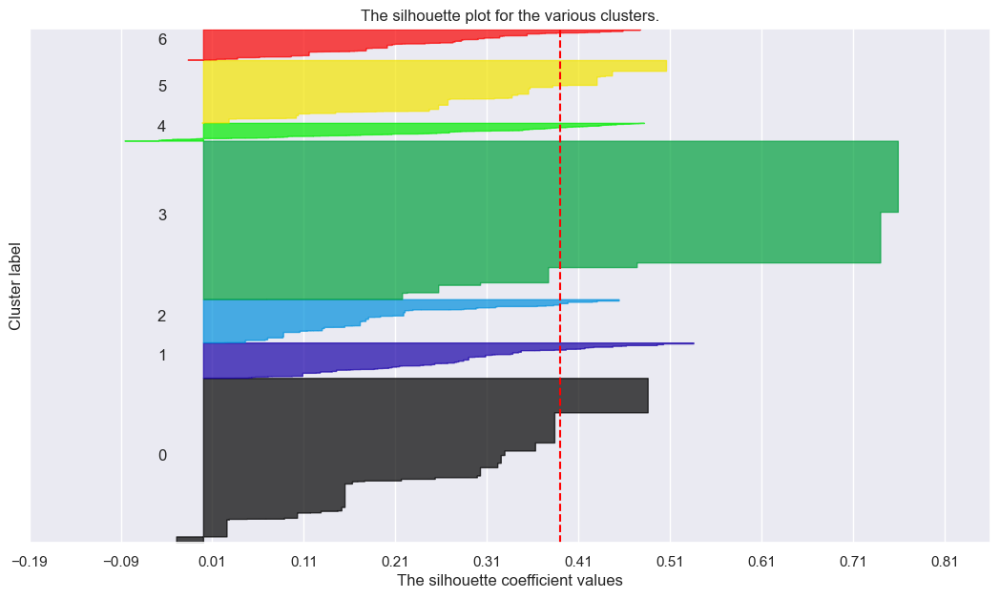

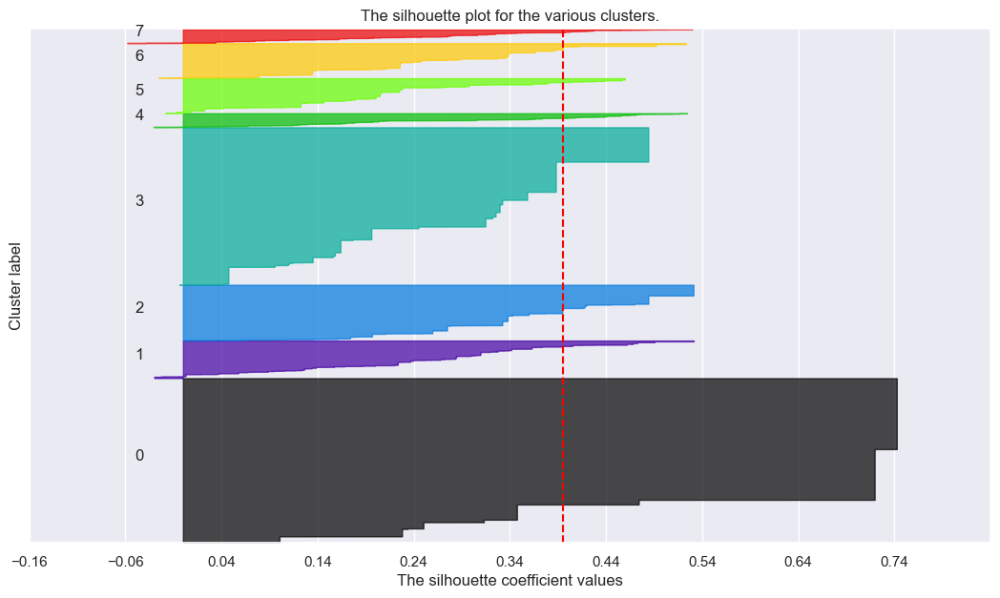

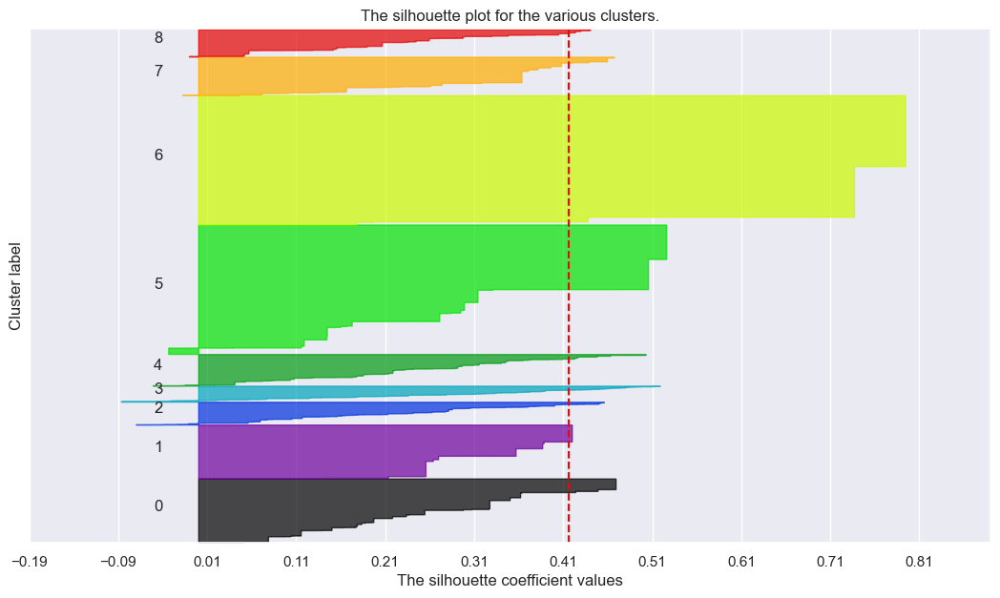

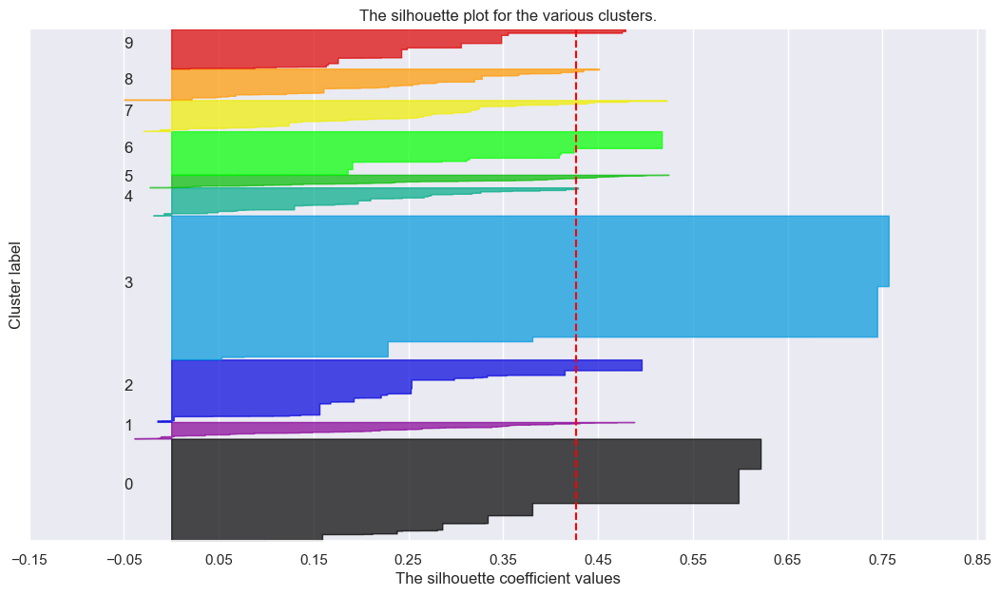

In [124]:
# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(dfs[preference_feats])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(dfs[preference_feats], cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(dfs[preference_feats], cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(dfs[preference_feats]) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

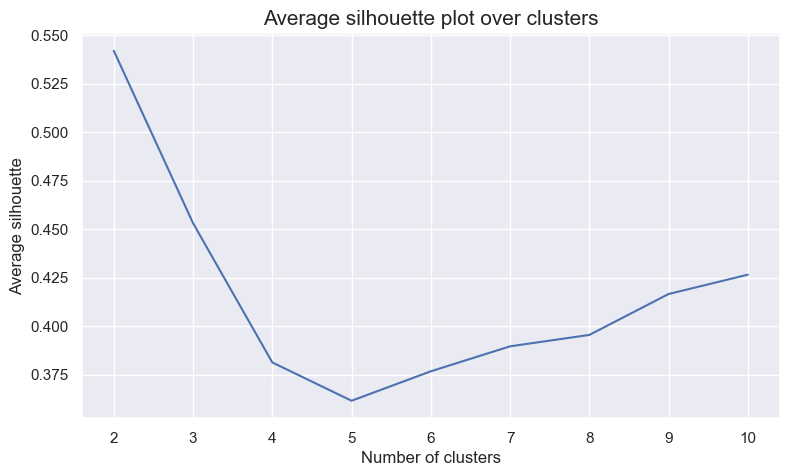

In [125]:
plt.figure(figsize=(9,5))

plt.plot(range_clusters[1:],
         avg_silhouette)     

plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

### Final K-Means Solution: 3 clusters

**Inertia**<br>
Looking at the plot for inertia, we consider 3 to have a enough low inertia.

**Silhouette Coefficient**<br>From the graphics above, we consider 3 clusters to be the optimal solution, since we want to get less number of clusters but also have a high silhouette score.

**Conclusion**<br>With this, we may settle at 3 clusters.

In [126]:
number_clusters = 3
kmclust3 = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels3 = kmclust3.fit_predict(dfs[preference_feats])

In [127]:
df_concat = pd.concat((dfs[preference_feats], pd.Series(km_labels3, name='labels', index=df.index)), axis=1)
df_concat.groupby('labels').mean()

,cui_diversity_score,is_chain,dow_diversity_score
labels,,,
0,1.966742,2.268029,1.828987
1,-0.589008,-0.517003,-0.637450
2,0.533552,0.297985,0.671613


/var/folders/57/25kq17kn271f80zlcffjmj1c0000gn/T/ipykernel_68981/3193052225.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_concat, x='labels', ax=axes[1], palette=["darkblue"])
/var/folders/57/25kq17kn271f80zlcffjmj1c0000gn/T/ipykernel_68981/3193052225.py:18: UserWarning: 
The palette list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.countplot(data=df_concat, x='labels', ax=axes[1], palette=["darkblue"])


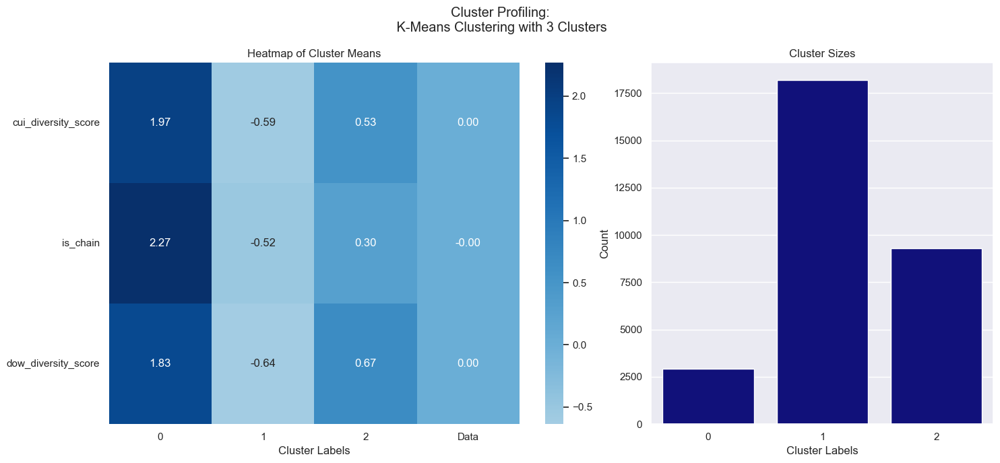

In [128]:
kmeans_profile = df_concat.groupby('labels').mean().T
df_means = df_concat[preference_feats].mean()
df_means.name = "Data"
kmeans_profile = pd.concat([kmeans_profile, df_means], axis=1)

fig, axes = plt.subplots(1, 2, figsize=(15, 7), width_ratios=[0.6, 0.4], tight_layout=True)

# Heatmap for cluster means
sns.heatmap(kmeans_profile,
            center=0, annot=True, cmap="Blues", fmt=".2f",
            ax=axes[0])
axes[0].set_xlabel("Cluster Labels")
axes[0].set_title("Heatmap of Cluster Means")
axes[0].set_yticklabels(axes[0].get_yticklabels(), rotation=0)


# Bar plot for cluster sizes
sns.countplot(data=df_concat, x='labels', ax=axes[1], palette=["darkblue"])
axes[1].set_title("Cluster Sizes")
axes[1].set_xlabel("Cluster Labels")
axes[1].set_ylabel("Count")

fig.suptitle("Cluster Profiling:\n K-Means Clustering with 3 Clusters")
plt.show()

In [129]:
df_sst_ = get_ss(df_concat, preference_feats)
df_ssb_ = get_ssb(df_concat, preference_feats, 'labels')
df_ssw_ = get_ssw(df_concat, preference_feats, 'labels')
df_rsq_ = get_rsq(df_concat, preference_feats, 'labels')

print("SSb:  ", df_ssb_)
print("SSw:  ", df_ssw_)
print("SSt:  ", df_sst_)
print("R2: ", df_rsq_)

SSb:   62381.85343674525
SSw:   28878.146563256105
SSt:   91259.99999999497
R2:  0.6835618391052192


In [130]:
sil_score = silhouette_score(dfs[preference_feats], km_labels3)
print(sil_score)

0.45317017612152505


### Insights for K-Means (Preference Features)

**3 Cluster Solution**:

$R^2$ = 0.684; Silhouette Score = 0.453

In terms of diversity in the cuisine type, the day of the week they order and how many chain vendors they order from, cluster 1 is the less diverse, and cluster 0 has high-diversity customers, with high-preference for chain vendors.
It also can be observed there is a marked difference of each feature representation across the clusters.

**Conclusion**: This method, with the *3 clusters solution* seems to be a good approach for the preference perspective, being very consistent with the Hierachical clustering solutions, which however has a close but slightly lower $R^2$ and higher Silhouette Score.


## 2.3. Gaussian Mixture Model

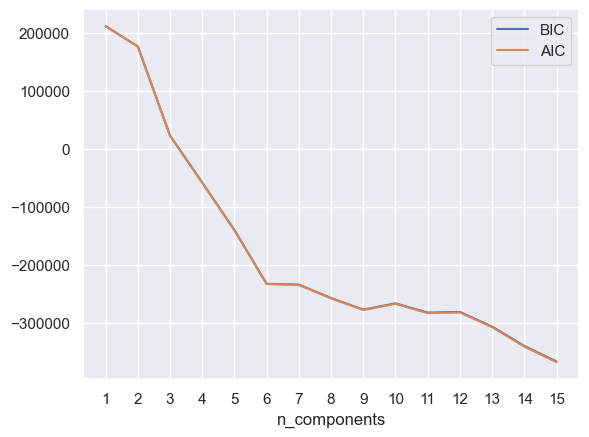

In [131]:
n_components = np.arange(1, 16)
models = [GaussianMixture(n, covariance_type='full', n_init=10, random_state=1).fit(dfs[preference_feats])
          for n in n_components]

bic_values = [m.bic(dfs[preference_feats]) for m in models]
aic_values = [m.aic(dfs[preference_feats]) for m in models]
plt.plot(n_components, bic_values, label='BIC')
plt.plot(n_components, aic_values, label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components')
plt.xticks(n_components)
plt.show()

In [132]:
gmm = GaussianMixture(n_components=6, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
gmm_labels = gmm.fit_predict(dfs[preference_feats])

In [133]:
df_concat = pd.concat([dfs[preference_feats], pd.Series(gmm_labels, index=df.index, name="gmm_labels")], axis=1)
df_concat.head()

,cui_diversity_score,is_chain,dow_diversity_score,gmm_labels
customer_id,,,,
1b8f824d5e,-0.903579,-0.542328,-0.390011,1
5d272b9dcb,-0.123455,-0.140633,-0.390011,5
f6d1b2ba63,-0.903579,-0.140633,-0.390011,1
180c632ed8,-0.123455,-0.542328,-0.390011,5
4eb37a6705,-0.123455,-0.944024,-0.390011,5


In [134]:
df_sst_ = get_ss(df_concat, preference_feats)
df_ssb_ = get_ssb(df_concat, preference_feats, 'gmm_labels')
df_ssw_ = get_ssw(df_concat, preference_feats, 'gmm_labels')
df_rsq_ = get_rsq(df_concat, preference_feats, 'gmm_labels')

print("SSb:  ", df_ssb_)
print("SSw:  ", df_ssw_)
print("SSt:  ", df_sst_)
print("R2: ", df_rsq_)

SSb:   63409.134127838
SSw:   27850.86587216103
SSt:   91259.99999999497
R2:  0.6948184760885101


In [135]:
sil_score = silhouette_score(dfs[preference_feats], gmm_labels)
print(sil_score) 

0.2979318622913416


/var/folders/57/25kq17kn271f80zlcffjmj1c0000gn/T/ipykernel_68981/3112854974.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_concat, x='gmm_labels', ax=axes[1], palette=["darkblue"])
/var/folders/57/25kq17kn271f80zlcffjmj1c0000gn/T/ipykernel_68981/3112854974.py:18: UserWarning: 
The palette list has fewer values (1) than needed (6) and will cycle, which may produce an uninterpretable plot.
  sns.countplot(data=df_concat, x='gmm_labels', ax=axes[1], palette=["darkblue"])


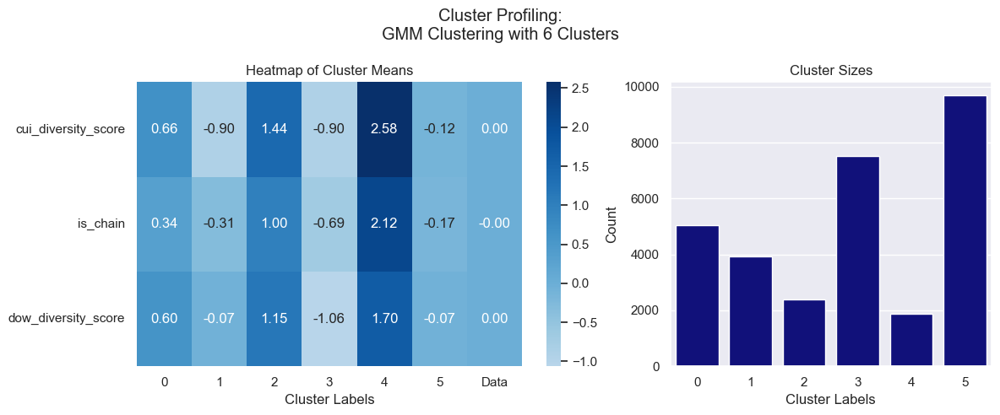

In [136]:
gmm_profile = df_concat.groupby('gmm_labels').mean().T
df_means = df_concat[preference_feats].mean()
df_means.name = "Data"
gmm_profile = pd.concat([gmm_profile, df_means], axis=1)

fig, axes = plt.subplots(1, 2, figsize=(12, 5), width_ratios=[0.6, 0.4], tight_layout=True)

# Heatmap for cluster means
sns.heatmap(gmm_profile,
            center=0, annot=True, cmap="Blues", fmt=".2f",
            ax=axes[0])
axes[0].set_xlabel("Cluster Labels")
axes[0].set_title("Heatmap of Cluster Means")
axes[0].set_yticklabels(axes[0].get_yticklabels(), rotation=0)


# Bar plot for cluster sizes
sns.countplot(data=df_concat, x='gmm_labels', ax=axes[1], palette=["darkblue"])
axes[1].set_title("Cluster Sizes")
axes[1].set_xlabel("Cluster Labels")
axes[1].set_ylabel("Count")

fig.suptitle("Cluster Profiling:\nGMM Clustering with 6 Clusters")
plt.show()

### Insights for Gaussian Mixture Model (Preference Features)

**6 Clusters**

$R^2$=0.695; Silhouette Score=0.298

Cluster 4 represents the customers that have no specific preference for the day of the week they order, prefering chain vendors, but being very diverse within chain vendors, while cluster 3 represents the least diverse customers, specially in the day of the week they order.

Cluster 5, as the largest, is very close to the mean of the overall data.

**Conclusion**: This 6-cluster solution doesn't seem to be a good approach, since it provides clusters that are ambiguous, hard to interpret and not very insightful.

## 2.4. Self-Organizing Maps

#### SOM

In [137]:
M = 30
N = 30
neighborhood_function = 'gaussian' 
topology = 'hexagonal' 
n_feats = len(preference_feats)
learning_rate = 0.7
sigma=2.2


som_data = dfs[preference_feats].values

sm = MiniSom(M, N,              # 10x10 map size
             n_feats,           # Number of the elements of the vectors in input.
             learning_rate=learning_rate, 
             topology=topology, 
             neighborhood_function=neighborhood_function, 
             activation_distance='euclidean',
             random_seed=42,
             sigma=sigma
             )


som_data = dfs[preference_feats].values
# Initializes the weights of the SOM picking random samples from data.
sm.random_weights_init(som_data) 

print(np.round(sm.quantization_error(som_data),4), "Starting QE")
print(np.round(sm.topographic_error(som_data),4), "Starting TE")


# Trains the SOM using all the vectors in data sequentially
# minisom does not distinguish between unfolding and fine tuning phase;

sm.train_batch(som_data, 500000)
print(np.round(sm.quantization_error(som_data),4),"Ending QE")
print(np.round(sm.topographic_error(som_data),4),"Ending TE")


/opt/anaconda3/lib/python3.12/site-packages/minisom.py:631: RuntimeWarning: invalid value encountered in sqrt
  return sqrt(-2 * cross_term + input_data_sq + weights_flat_sq.T)


0.0507 Starting QE
0.9974 Starting TE
0.0399 Ending QE
0.0071 Ending TE


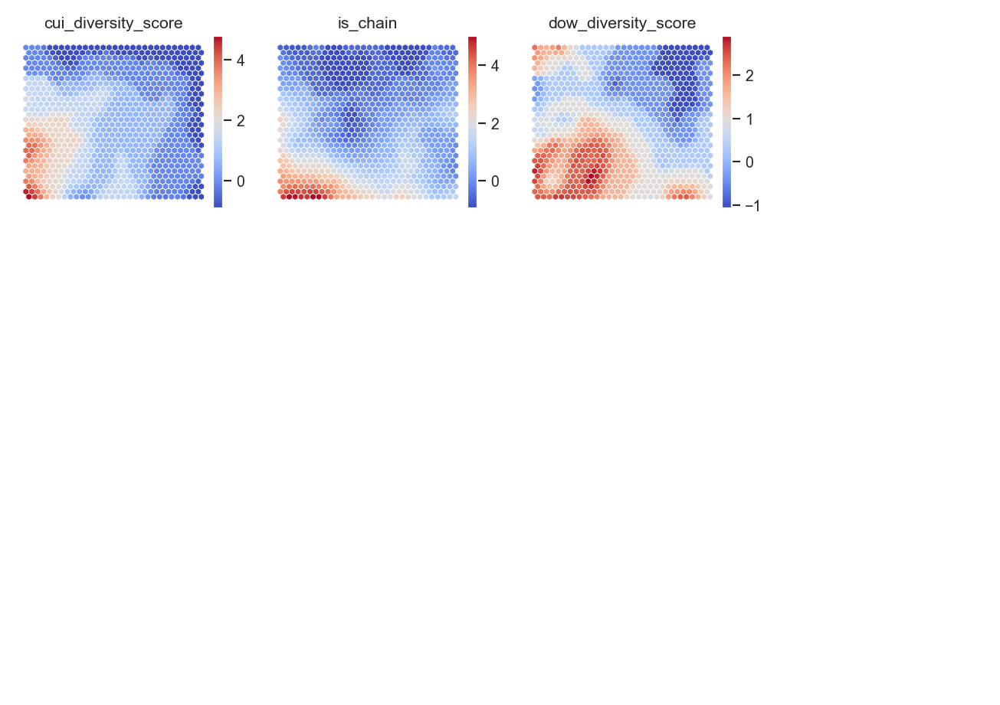

In [138]:
weights = sm.get_weights()

figsize=(10,7)
fig = plt.figure(figsize=figsize, constrained_layout=True, dpi=128, )

subfigs = fig.subfigures(3,4,wspace=.15)

colornorm = mpl_colors.Normalize(vmin=np.min(weights), vmax=np.max(weights))

for cpi, sf in zip(range(len(preference_feats)), subfigs.flatten()):
    
    matrix_vals = weights[:,:,cpi]
    vext = np.max(np.abs([np.min(matrix_vals), np.max(matrix_vals)]))
    colornorm = mpl_colors.Normalize(vmin=np.min(matrix_vals), vmax=np.max(matrix_vals))


    sf = plot_hexagons(sm, sf, 
                    colornorm,
                    matrix_vals,
                    label=preference_feats[cpi],
                    cmap=cm.coolwarm,
                    )

For each feature we can observe clear boundaries, allowing to indentify a pattern.

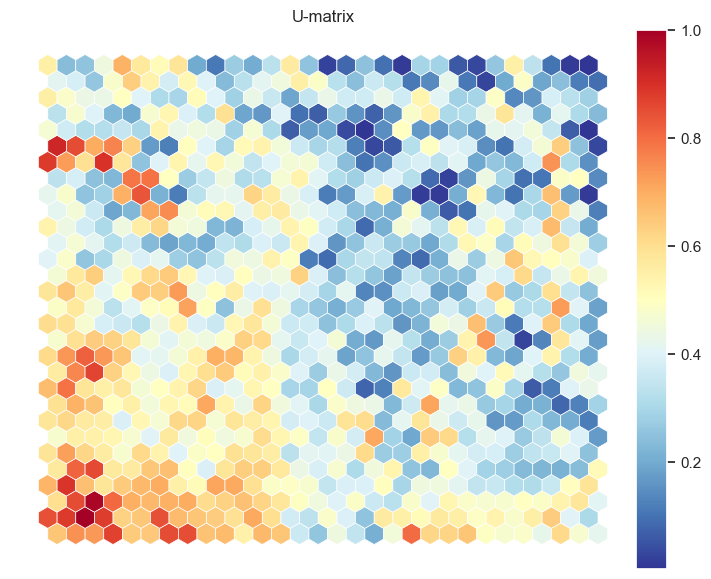

In [139]:
umatrix = sm.distance_map(scaling='mean')
fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=np.min(umatrix), vmax=np.max(umatrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    umatrix,
                    label="U-matrix",
                    cmap=cm.RdYlBu_r,
                    )

It can be identified various set of close nodes in blue and in red. However, it still seems dubious regarding the number of clusters.

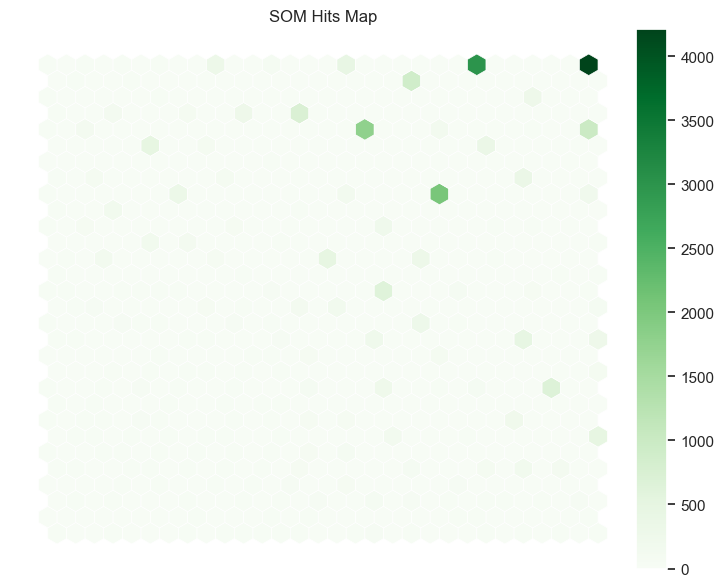

In [140]:
hitsmatrix = sm.activation_response(dfs[preference_feats].values)


fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(hitsmatrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    hitsmatrix,
                    label="SOM Hits Map",
                    cmap=cm.Greens,
                    )


In [141]:
weights_flat_preference = sm.get_weights().reshape((M*N),len(preference_feats))
weights_flat_preference.shape

(900, 3)

In [142]:
sm.quantization_error(som_data)

0.039864198914351494

In [143]:
sm.topographic_error(som_data)

0.007067718606180162

### Insights for SOM (Preference Features)

The quantization and topographic erros show to be widely minimal.

For each feature, it seems that there are various different patterns and it can be observed a more specific segmentation for each. However, in the U-matrix the number of clusters is not very clear yet.

### 2.4.1 K-means on top of SOM

#### 3 clusters

In [144]:
kmeans = KMeans(n_clusters=3, init='k-means++', n_init=20, random_state=42)
nodeclus_labels = kmeans.fit_predict(weights_flat_preference)

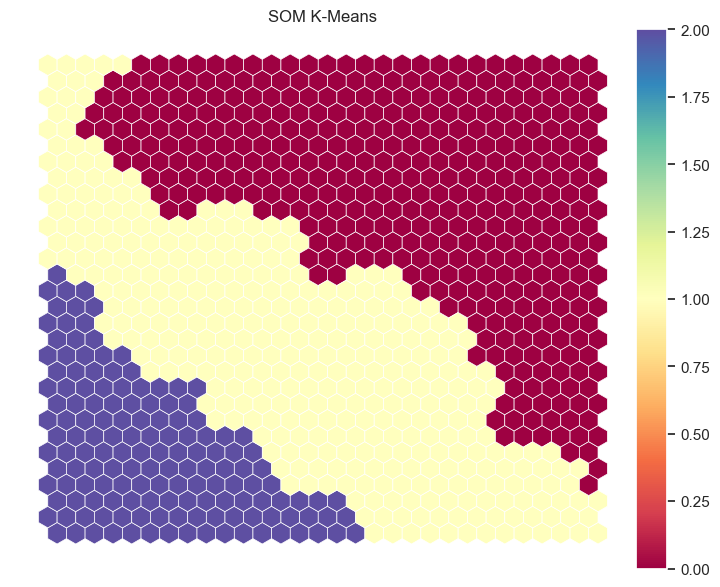

In [145]:
kmeans_matrix = nodeclus_labels.reshape((M,N))

fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(kmeans_matrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    kmeans_matrix,
                    label="SOM K-Means",
                    cmap=cm.Spectral,
                    )


In [146]:
preference_labels = predict_som_clusters(sm, som_data, kmeans_matrix)

In [147]:
df_final = pd.concat([
                dfs[preference_feats],
                pd.Series(preference_labels, name='label', index=df.index)
            ], axis=1
            )

df_final

,cui_diversity_score,is_chain,dow_diversity_score,label
customer_id,,,,
1b8f824d5e,-0.903579,-0.542328,-0.390011,0
5d272b9dcb,-0.123455,-0.140633,-0.390011,0
f6d1b2ba63,-0.903579,-0.140633,-0.390011,0
180c632ed8,-0.123455,-0.542328,-0.390011,0
4eb37a6705,-0.123455,-0.944024,-0.390011,0
...,...,...,...,...
f4e366c281,-0.903579,-0.542328,-1.063307,0
f6b6709018,-0.903579,-0.944024,-1.063307,0
f74ad8ce3f,-0.903579,-0.542328,-1.063307,0


In [148]:
df_sst_ = get_ss(df_final, preference_feats)
df_ssb_ = get_ssb(df_final, preference_feats, 'label')
df_ssw_ = get_ssw(df_final, preference_feats, 'label')
df_rsq_ = get_rsq(df_final, preference_feats, 'label')

print("SSb:  ", df_ssb_)
print("SSw:  ", df_ssw_)
print("SSt:  ", df_sst_)
print("R2: ", df_rsq_)

SSb:   60016.24258471104
SSw:   31243.75741529149
SSt:   91259.99999999497
R2:  0.6576401773472144


In [149]:
sil_score = silhouette_score(df_final[preference_feats], preference_labels)
print(sil_score)

0.47404177366122807


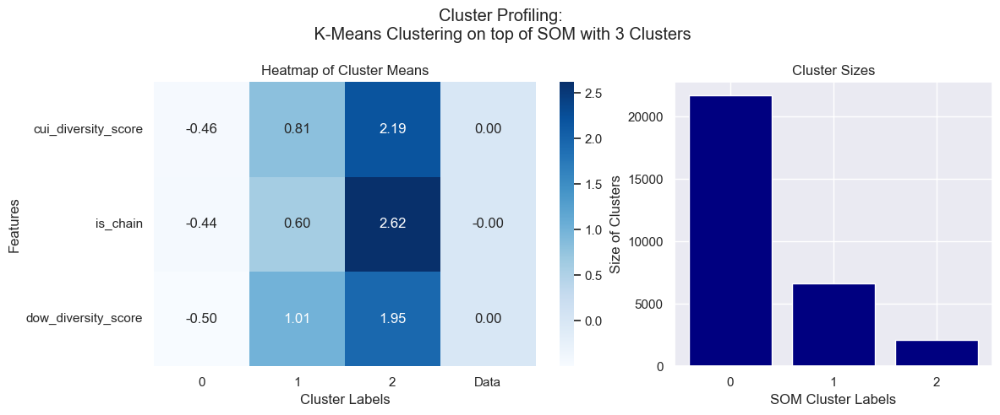

In [150]:
som_cluster_means = df_final[preference_feats + ['label']].groupby('label').mean().T
global_mean = df_final[preference_feats].mean()
global_mean.name = 'Data'
som_cluster_means = pd.concat([som_cluster_means, global_mean], axis=1)

cluster_sizes = df_final['label'].value_counts().sort_index()

fig, ax = plt.subplots(1, 2, figsize=(12, 5), width_ratios=[0.6, 0.4], tight_layout=True)

sns.heatmap(
    som_cluster_means,
    annot=True,
    cmap="Blues",
    fmt=".2f",
    ax=ax[0]
)
ax[0].set_title("Heatmap of Cluster Means")
ax[0].set_xlabel("Cluster Labels")
ax[0].set_ylabel("Features")
ax[0].set_yticklabels(ax[0].get_yticklabels(), rotation=0)


# Bar plot for cluster sizes
ax[1].bar(cluster_sizes.index, cluster_sizes.values, color='navy')
ax[1].set_title("Cluster Sizes")
ax[1].set_xlabel("SOM Cluster Labels")
ax[1].set_ylabel("Size of Clusters")
ax[1].set_xticks(cluster_sizes.index)
ax[1].set_xticklabels(cluster_sizes.index.astype(int))


fig.suptitle("Cluster Profiling:\n K-Means Clustering on top of SOM with 3 Clusters")
plt.tight_layout()
plt.show()


#### 4 clusters

In [151]:
kmeans = KMeans(n_clusters=4, init='k-means++', n_init=20, random_state=42)
nodeclus_labels = kmeans.fit_predict(weights_flat_preference)

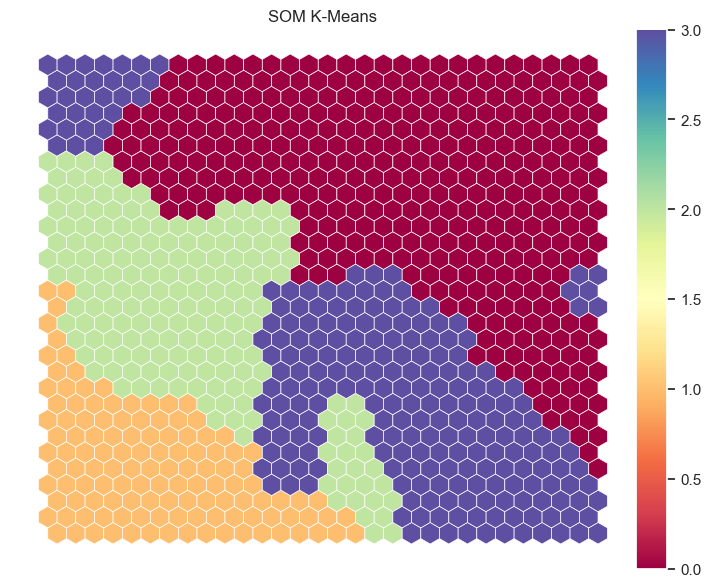

In [152]:
kmeans_matrix = nodeclus_labels.reshape((M,N))

fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(kmeans_matrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    kmeans_matrix,
                    label="SOM K-Means",
                    cmap=cm.Spectral,
                    )


In [153]:
preference_labels = predict_som_clusters(sm, som_data, kmeans_matrix)

In [154]:
df_final = pd.concat([
                dfs[preference_feats],
                pd.Series(preference_labels, name='label', index=df.index)
            ], axis=1
            )

df_final

,cui_diversity_score,is_chain,dow_diversity_score,label
customer_id,,,,
1b8f824d5e,-0.903579,-0.542328,-0.390011,0
5d272b9dcb,-0.123455,-0.140633,-0.390011,0
f6d1b2ba63,-0.903579,-0.140633,-0.390011,0
180c632ed8,-0.123455,-0.542328,-0.390011,0
4eb37a6705,-0.123455,-0.944024,-0.390011,0
...,...,...,...,...
f4e366c281,-0.903579,-0.542328,-1.063307,0
f6b6709018,-0.903579,-0.944024,-1.063307,0
f74ad8ce3f,-0.903579,-0.542328,-1.063307,0


In [155]:
df_sst_ = get_ss(df_final, preference_feats)
df_ssb_ = get_ssb(df_final, preference_feats, 'label')
df_ssw_ = get_ssw(df_final, preference_feats, 'label')
df_rsq_ = get_rsq(df_final, preference_feats, 'label')

print("SSb:  ", df_ssb_)
print("SSw:  ", df_ssw_)
print("SSt:  ", df_sst_)
print("R2: ", df_rsq_)

SSb:   63282.06391511856
SSw:   27977.936084881097
SSt:   91259.99999999497
R2:  0.6934260784036529


In [156]:
sil_score = silhouette_score(df_final[preference_feats], preference_labels)
print(sil_score)

0.4229781676793844


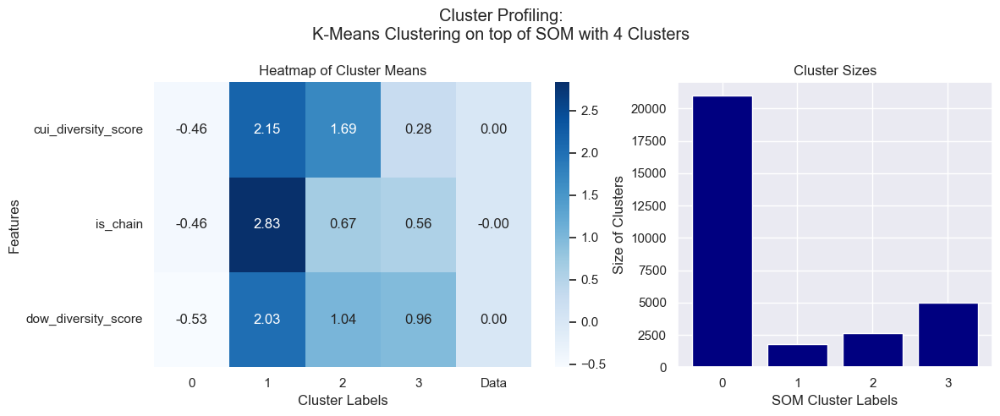

In [157]:
# Compute the mean of all data and add it as a column
som_cluster_means = df_final[preference_feats + ['label']].groupby('label').mean().T
global_mean = df_final[preference_feats].mean()
global_mean.name = 'Data'
som_cluster_means = pd.concat([som_cluster_means, global_mean], axis=1)

# Compute the size of each cluster
cluster_sizes = df_final['label'].value_counts().sort_index()

# Plotting
fig, ax = plt.subplots(1, 2, figsize=(12, 5), width_ratios=[0.6, 0.4], tight_layout=True)

# Heatmap
sns.heatmap(
    som_cluster_means,
    annot=True,
    cmap="Blues",
    fmt=".2f",
    ax=ax[0]
)
ax[0].set_title("Heatmap of Cluster Means")
ax[0].set_xlabel("Cluster Labels")
ax[0].set_ylabel("Features")
ax[0].set_yticklabels(ax[0].get_yticklabels(), rotation=0)


# Bar plot for cluster sizes
ax[1].bar(cluster_sizes.index, cluster_sizes.values, color='navy')
ax[1].set_title("Cluster Sizes")
ax[1].set_xlabel("SOM Cluster Labels")
ax[1].set_ylabel("Size of Clusters")


fig.suptitle("Cluster Profiling:\nK-Means Clustering on top of SOM with 4 Clusters")
plt.tight_layout()
plt.show()


#### Insights for K-Means on SOM (Preference Features)

**3 Clusters Solution**

The Self-Organizing map seems to have fully unfolded. Cluster sizes are imbalanced. However, it does have a good silhouette score (0.474) and a $R^2$ of 0.658.

The clusters are very distinctly characterized. In terms of diversity in the cuisine type, the day of the week they order and how many chain vendors they order from, cluster 0 is the less diverse (and it is the larger cluster), and cluster 2 (the smaller cluster) has high-diversity customers, with high-preference customers.
It also can be observed there is a marked difference of each feature representation across the clusters.

**4 Clusters Solution**

The Self-Organizing map does not seem to have fully unfolded. On top of this, cluster sizes are also imbalanced. However, it does have a good silhouette score (0.423) and a $R^2$ of 0.693.

The clusters are very distinctly characterized. In terms of diversity in the cuisine type, the day of the week they order and how many chain vendors they order from, cluster 0 is the less diverse, and cluster 1 has high-diversity customers.


### 2.4.2 Hierarchical on top of SOM

#### 3 clusters

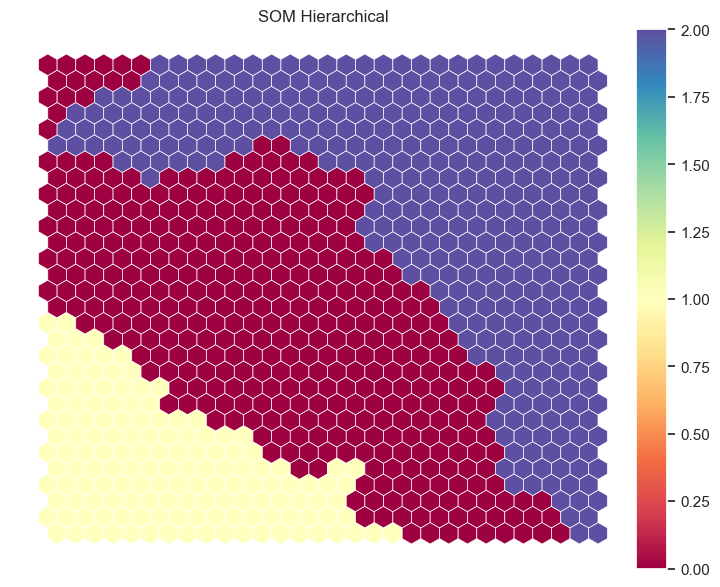

In [158]:
hierclust = AgglomerativeClustering(n_clusters=3, linkage='ward')
nodeclus_labels = hierclust.fit_predict(weights_flat_preference)
hclust_matrix = nodeclus_labels.reshape((M,N))

fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(hclust_matrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    hclust_matrix,
                    label="SOM Hierarchical",
                    cmap=cm.Spectral,
                    )

In [159]:
preference_labels = predict_som_clusters(sm, som_data, hclust_matrix)

In [160]:
df_final = pd.concat([
                dfs[preference_feats],
                pd.Series(preference_labels, name='label', index=df.index)
            ], axis=1
            )

df_final

,cui_diversity_score,is_chain,dow_diversity_score,label
customer_id,,,,
1b8f824d5e,-0.903579,-0.542328,-0.390011,2
5d272b9dcb,-0.123455,-0.140633,-0.390011,2
f6d1b2ba63,-0.903579,-0.140633,-0.390011,2
180c632ed8,-0.123455,-0.542328,-0.390011,2
4eb37a6705,-0.123455,-0.944024,-0.390011,2
...,...,...,...,...
f4e366c281,-0.903579,-0.542328,-1.063307,2
f6b6709018,-0.903579,-0.944024,-1.063307,2
f74ad8ce3f,-0.903579,-0.542328,-1.063307,2


In [161]:
df_sst_ = get_ss(df_final, preference_feats)
df_ssb_ = get_ssb(df_final, preference_feats, 'label')
df_ssw_ = get_ssw(df_final, preference_feats, 'label')
df_rsq_ = get_rsq(df_final, preference_feats, 'label')

print("SSb:  ", df_ssb_)
print("SSw:  ", df_ssw_)
print("SSt:  ", df_sst_)
print("R2: ", df_rsq_)

SSb:   58956.513992367574
SSw:   32303.486007633623
SSt:   91259.99999999497
R2:  0.6460279858904734


In [162]:
sil_score = silhouette_score(df_final[preference_feats], preference_labels)
print(sil_score)

0.4553271150919091


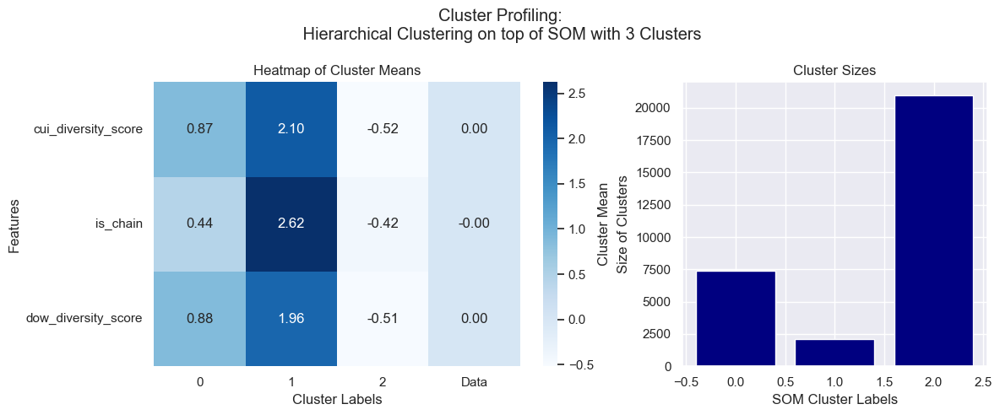

In [163]:
som_cluster_means = df_final[preference_feats + ['label']].groupby('label').mean().T
global_mean = df_final[preference_feats].mean()
global_mean.name = 'Data'
som_cluster_means = pd.concat([som_cluster_means, global_mean], axis=1)

cluster_sizes = df_final['label'].value_counts().sort_index()

fig, ax = plt.subplots(1, 2, figsize=(12, 5), width_ratios=[0.6, 0.4], tight_layout=True)

# Heatmap
sns.heatmap(
    som_cluster_means,
    annot=True,
    cmap="Blues",
    fmt=".2f",
    cbar_kws={'label': 'Cluster Mean'},
    ax=ax[0]
)
ax[0].set_title("Heatmap of Cluster Means")
ax[0].set_xlabel("Cluster Labels")
ax[0].set_ylabel("Features")
ax[0].set_yticklabels(ax[0].get_yticklabels(), rotation=0)


# Bar plot for cluster sizes
ax[1].bar(cluster_sizes.index, cluster_sizes.values, color='navy')
ax[1].set_title("Cluster Sizes")
ax[1].set_xlabel("SOM Cluster Labels")
ax[1].set_ylabel("Size of Clusters")

fig.suptitle("Cluster Profiling:\n Hierarchical Clustering on top of SOM with 3 Clusters")
plt.tight_layout()
plt.show()


#### 4 clusters

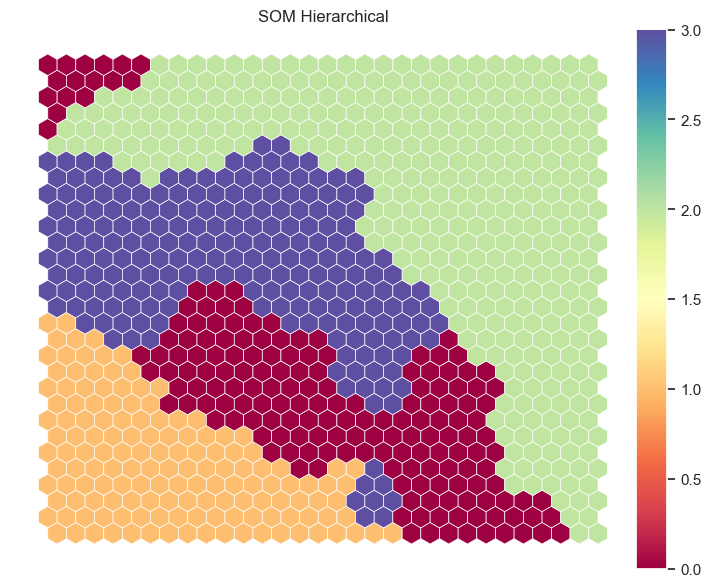

In [164]:
hierclust = AgglomerativeClustering(n_clusters=4, linkage='ward')
nodeclus_labels = hierclust.fit_predict(weights_flat_preference)
hclust_matrix = nodeclus_labels.reshape((M,N))

fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(hclust_matrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    hclust_matrix,
                    label="SOM Hierarchical",
                    cmap=cm.Spectral,
                    )

In [165]:
preference_labels = predict_som_clusters(sm, som_data, hclust_matrix)

In [166]:
df_final = pd.concat([
                dfs[preference_feats],
                pd.Series(preference_labels, name='label', index=df.index)
            ], axis=1
            )

df_final

,cui_diversity_score,is_chain,dow_diversity_score,label
customer_id,,,,
1b8f824d5e,-0.903579,-0.542328,-0.390011,2
5d272b9dcb,-0.123455,-0.140633,-0.390011,2
f6d1b2ba63,-0.903579,-0.140633,-0.390011,2
180c632ed8,-0.123455,-0.542328,-0.390011,2
4eb37a6705,-0.123455,-0.944024,-0.390011,2
...,...,...,...,...
f4e366c281,-0.903579,-0.542328,-1.063307,2
f6b6709018,-0.903579,-0.944024,-1.063307,2
f74ad8ce3f,-0.903579,-0.542328,-1.063307,2


In [167]:
df_sst_ = get_ss(df_final, preference_feats)
df_ssb_ = get_ssb(df_final, preference_feats, 'label')
df_ssw_ = get_ssw(df_final, preference_feats, 'label')
df_rsq_ = get_rsq(df_final, preference_feats, 'label')

print("SSb:  ", df_ssb_)
print("SSw:  ", df_ssw_)
print("SSt:  ", df_sst_)
print("R2: ", df_rsq_)

SSb:   61497.86459123739
SSw:   29762.13540876376
SSt:   91259.99999999497
R2:  0.6738753516462261


In [168]:
sil_score = silhouette_score(df_final[preference_feats], preference_labels)
print(sil_score)

0.3963488977780574


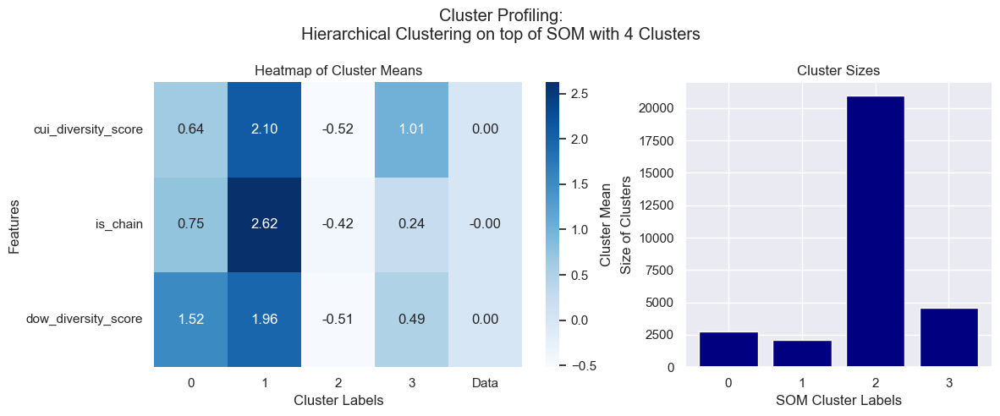

In [169]:
som_cluster_means = df_final[preference_feats + ['label']].groupby('label').mean().T
global_mean = df_final[preference_feats].mean()
global_mean.name = 'Data'
som_cluster_means = pd.concat([som_cluster_means, global_mean], axis=1)

cluster_sizes = df_final['label'].value_counts().sort_index()

fig, ax = plt.subplots(1, 2, figsize=(12, 5), width_ratios=[0.6, 0.4], tight_layout=True)

# Heatmap
sns.heatmap(
    som_cluster_means,
    annot=True,
    cmap="Blues",
    fmt=".2f",
    cbar_kws={'label': 'Cluster Mean'},
    ax=ax[0]
)
ax[0].set_title("Heatmap of Cluster Means")
ax[0].set_xlabel("Cluster Labels")
ax[0].set_ylabel("Features")
ax[0].set_yticklabels(ax[0].get_yticklabels(), rotation=0)


# Bar plot for cluster sizes
ax[1].bar(cluster_sizes.index, cluster_sizes.values, color='navy')
ax[1].set_title("Cluster Sizes")
ax[1].set_xlabel("SOM Cluster Labels")
ax[1].set_ylabel("Size of Clusters")

fig.suptitle("Cluster Profiling:\nHierarchical Clustering on top of SOM with 4 Clusters")
plt.tight_layout()
plt.show()


#### Insights for Hierarchical on SOM (Preference Features)

**3 Clusters Solution**

The Self-Organizing map seems to have fully unfolded. Cluster sizes are  highly imbalanced. However, it does have a good silhouette score (0.455) and a $R^2$ of 0.646.

The clusters are very distinctly characterized. In terms of diversity in the cuisine type, the day of the week they order and how many chain vendors they order from, cluster 2 is the less diverse, and cluster 1 has high-diversity customers.
It also can be observed there is a marked difference of each feature representation across the clusters.

**4 Clusters Solution**

The Self-Organizing map seems to have fully unfolded. On top of this, cluster sizes are also imbalanced. However, it does have a good silhouette score (0.396) and a $R^2$ of 0.674.

The clusters are very distinctly characterized. In terms of diversity in the cuisine type, the day of the week they order and how many chain vendors they order from, cluster 2 is the less diverse, and cluster 1 has high-diversity customers.


# 3. PERSPECTIVE 3 - Time

## 3.1. Initial time grouping features

In [171]:
dfs.columns

Index(['customer_age', 'vendor_count', 'product_count', 'is_chain',
       'first_order', 'last_order', 'CUI_American', 'CUI_Asian',
       'CUI_Beverages', 'CUI_Cafe', 'CUI_Chicken Dishes', 'CUI_Chinese',
       'CUI_Desserts', 'CUI_Healthy', 'CUI_Indian', 'CUI_Italian',
       'CUI_Japanese', 'CUI_Noodle Dishes', 'CUI_OTHER',
       'CUI_Street Food / Snacks', 'CUI_Thai', 'DOW_0', 'DOW_1', 'DOW_2',
       'DOW_3', 'DOW_4', 'DOW_5', 'DOW_6', 'HR_0', 'HR_1', 'HR_2', 'HR_3',
       'HR_4', 'HR_5', 'HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10', 'HR_11',
       'HR_12', 'HR_13', 'HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18', 'HR_19',
       'HR_20', 'HR_21', 'HR_22', 'HR_23', 'late_night', 'early_morning',
       'morning', 'midday', 'afternoon_evening', 'night', 'weekday', 'weekend',
       'total_spending', 'total_orders', 'order_frequency', 'order_span',
       'avg_product_cost', 'avg_order_cost', 'products_per_vendor',
       'cui_diversity_score', 'dow_diversity_score', 'hr_diversity_score'

In [172]:
time_feats = ['late_night', 'early_morning', 'morning', 'midday', 'afternoon_evening', 'night']

#### 3.1.1. Hierarchical

In [52]:
hc_methods = ["ward", "complete", "average", "single"]
max_nclus = 10

r2_hc = np.vstack([get_r2_hc(dfs[time_feats], 
                              link, 
                              max_nclus=max_nclus, 
                              min_nclus=1, 
                              dist="euclidean") 
                              for link in hc_methods])

In [53]:
r2_hc_methods = pd.DataFrame(r2_hc.T, index=range(1, max_nclus + 1), columns=hc_methods)

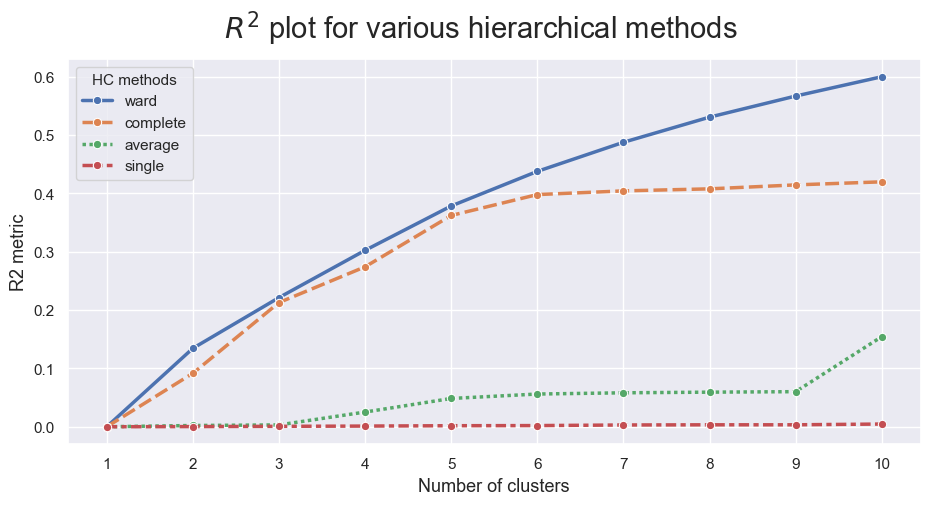

In [54]:
sns.set()

fig = plt.figure(figsize=(11,5))
sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

plt.legend(title="HC methods", title_fontsize=11)
plt.xticks(range(1, max_nclus + 1))
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)

fig.suptitle("$R^2$ plot for various hierarchical methods", fontsize=21)

plt.show()

Considering this graphic, we can state that 'ward' linkage should be the best method to calculate the distances. <br> Also, we consider 4, 5 or 5 to be potencial optimal number of clusters. 

**`Hierarchical Dendogram`**

Testing hierarchical for the conservative preprocessing approach and for the default preprocessing.

In [173]:
linkage_ = 'ward'
distance = 'euclidean' 
hclust = AgglomerativeClustering(linkage= linkage_, metric=distance, distance_threshold=0, n_clusters=None)
hclust.fit_predict(dfs[time_feats])

array([30419, 30418, 17707, ...,     2,     1,     0])

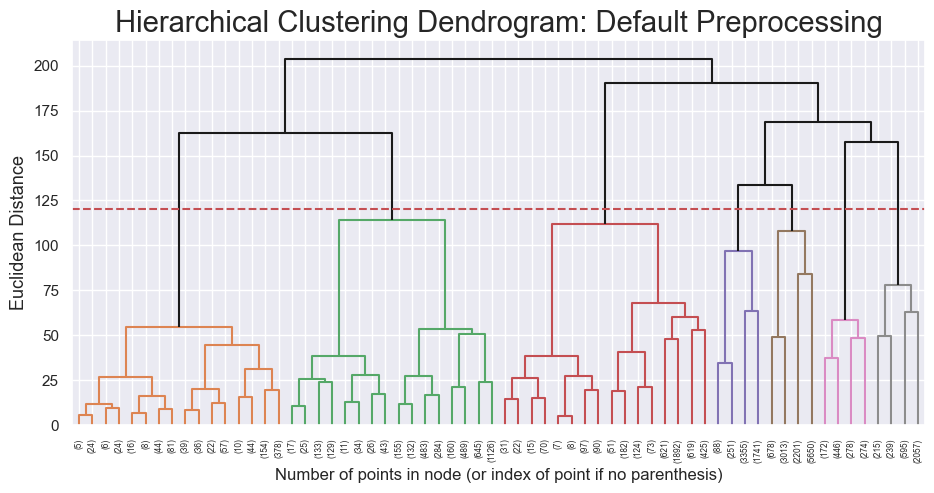

In [174]:
def plot_dendrogram(hclust, title, y_threshold=120):
    # Create the counts of samples under each node
    counts = np.zeros(hclust.children_.shape[0])
    n_samples = len(hclust.labels_)

    for i, merge in enumerate(hclust.children_):
        current_count = 0
        
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    # Create linkage matrix
    linkage_matrix = np.column_stack(
        [hclust.children_, hclust.distances_, counts]
    ).astype(float)

    # Plot the dendrogram
    sns.set()
    fig = plt.figure(figsize=(11, 5))
    dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
    plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
    plt.title(title, fontsize=21)
    plt.xlabel('Number of points in node (or index of point if no parenthesis)')
    plt.ylabel('Euclidean Distance', fontsize=13)
    plt.show()

linkage_ = 'ward'
distance = 'euclidean'
hclust = AgglomerativeClustering(linkage=linkage_, metric=distance, distance_threshold=0, n_clusters=None)
hclust.fit_predict(dfs[time_feats])

plot_dendrogram(
    hclust, 
    title='Hierarchical Clustering Dendrogram: Default Preprocessing'
)


It is clear that the conservative approach stiil have extreme values that are skewing the results and introducing bias into the dendrogram.

##### Test cluster solutions

In [175]:
# Find columns in df that are not in dfs
columns_not_in_dfs = set(df.columns) - set(dfs.columns)

# Add those columns to dfs
for col in columns_not_in_dfs:
    dfs[col] = df[col]

# Verify that the columns were added
print("Updated columns in dfs:")
print(dfs.columns)

Updated columns in dfs:
Index(['customer_age', 'vendor_count', 'product_count', 'is_chain',
       'first_order', 'last_order', 'CUI_American', 'CUI_Asian',
       'CUI_Beverages', 'CUI_Cafe', 'CUI_Chicken Dishes', 'CUI_Chinese',
       'CUI_Desserts', 'CUI_Healthy', 'CUI_Indian', 'CUI_Italian',
       'CUI_Japanese', 'CUI_Noodle Dishes', 'CUI_OTHER',
       'CUI_Street Food / Snacks', 'CUI_Thai', 'DOW_0', 'DOW_1', 'DOW_2',
       'DOW_3', 'DOW_4', 'DOW_5', 'DOW_6', 'HR_0', 'HR_1', 'HR_2', 'HR_3',
       'HR_4', 'HR_5', 'HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10', 'HR_11',
       'HR_12', 'HR_13', 'HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18', 'HR_19',
       'HR_20', 'HR_21', 'HR_22', 'HR_23', 'late_night', 'early_morning',
       'morning', 'midday', 'afternoon_evening', 'night', 'weekday', 'weekend',
       'total_spending', 'total_orders', 'order_frequency', 'order_span',
       'avg_product_cost', 'avg_order_cost', 'products_per_vendor',
       'cui_diversity_score', 'dow_diversity_scor

In [176]:
linkage_ = 'ward'
distance = 'euclidean'

In [177]:
n_clusters = 4

hc5_clust = AgglomerativeClustering(linkage=linkage_, metric=distance, n_clusters=n_clusters)
hc5_labels = hc5_clust.fit_predict(dfs[time_feats])

In [178]:
df_concat = pd.concat([dfs[time_feats], 
                       pd.Series(hc5_labels, 
                                 name='labels', 
                                 index=df.index)], 
                    axis=1)

df_concat.groupby('labels').mean()

,late_night,early_morning,morning,midday,afternoon_evening,night
labels,,,,,,
0,0.915864,1.492954,-0.163786,-0.319003,-0.562508,-0.317715
1,-0.181896,-0.038916,1.574300,0.235573,0.659762,-0.218501
2,-0.093365,-0.240332,-0.181361,0.035610,0.126675,1.912559
3,-0.191495,-0.354572,-0.303601,0.022535,-0.038094,-0.341850


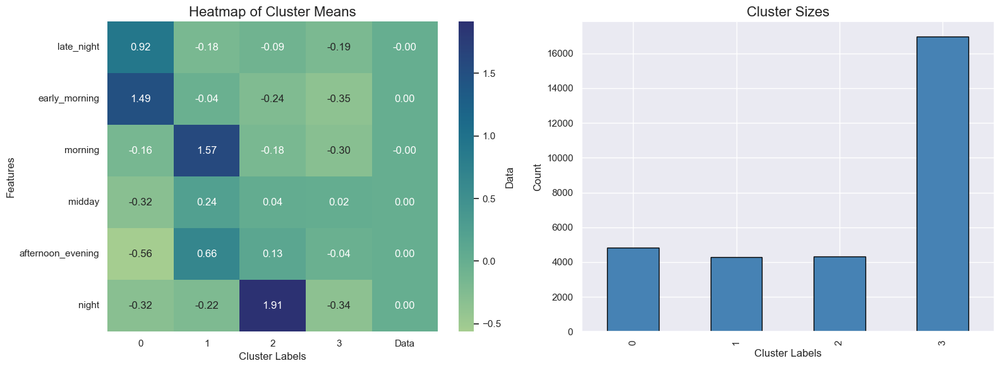

In [179]:
# Calculate cluster means
cluster_means = df_concat.groupby('labels').mean()

# Calculate the overall mean of each feature in the dataset
overall_mean = df_concat[time_feats].mean().rename('Data')

# Add the overall mean as a new column to the cluster means DataFrame
cluster_means_with_overall = cluster_means.T
cluster_means_with_overall['Data'] = overall_mean

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Heatmap of cluster means with the overall data column
sns.heatmap(cluster_means_with_overall, ax=axes[0], annot=True, cmap='crest', fmt=".2f", cbar_kws={'label': 'Data'})
axes[0].set_title('Heatmap of Cluster Means', fontsize=16)
axes[0].set_ylabel('Features', fontsize=12)
axes[0].set_xlabel('Cluster Labels', fontsize=12)

# Bar chart of cluster sizes
cluster_sizes = df_concat['labels'].value_counts().sort_index()
cluster_sizes.plot(kind='bar', ax=axes[1], color='steelblue', edgecolor='black')
axes[1].set_title('Cluster Sizes', fontsize=16)
axes[1].set_ylabel('Count', fontsize=12)
axes[1].set_xlabel('Cluster Labels', fontsize=12)

plt.tight_layout()
plt.show()


In [180]:
hr_features = [col for col in dfs.columns if col.startswith('HR')]

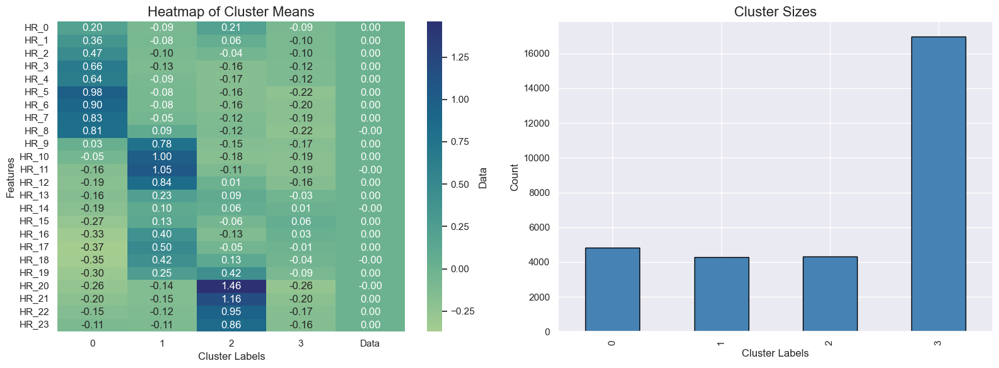

In [181]:
df_concat = pd.concat([dfs[time_feats+hr_features], 
                       pd.Series(hc5_labels, 
                                 name='labels', 
                                 index=df.index)], axis=1)

cluster_means = df_concat.groupby('labels').mean()[hr_features]

overall_mean = df_concat[hr_features].mean().rename('Data')

cluster_means_with_overall = cluster_means.T
cluster_means_with_overall['Data'] = overall_mean

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.heatmap(cluster_means_with_overall, ax=axes[0], annot=True, cmap='crest', fmt=".2f", cbar_kws={'label': 'Data'})
axes[0].set_title('Heatmap of Cluster Means', fontsize=16)
axes[0].set_ylabel('Features', fontsize=12)
axes[0].set_xlabel('Cluster Labels', fontsize=12)

cluster_sizes = df_concat['labels'].value_counts().sort_index()
cluster_sizes.plot(kind='bar', ax=axes[1], color='steelblue', edgecolor='black')
axes[1].set_title('Cluster Sizes', fontsize=16)
axes[1].set_ylabel('Count', fontsize=12)
axes[1].set_xlabel('Cluster Labels', fontsize=12)

plt.tight_layout()
plt.show()


In [182]:
n_clusters = 5

hc5_clust = AgglomerativeClustering(linkage=linkage_, metric=distance, n_clusters=n_clusters)
hc5_labels = hc5_clust.fit_predict(dfs[time_feats])

In [183]:
df_concat = pd.concat([dfs[time_feats], 
                       pd.Series(hc5_labels, 
                                 name='labels', 
                                 index=df.index)], 
                    axis=1)

df_concat.groupby('labels').mean()

,late_night,early_morning,morning,midday,afternoon_evening,night
labels,,,,,,
0,-0.181896,-0.038916,1.574300,0.235573,0.659762,-0.218501
1,-0.191495,-0.354572,-0.303601,0.022535,-0.038094,-0.341850
2,-0.093365,-0.240332,-0.181361,0.035610,0.126675,1.912559
3,0.141062,1.743278,-0.218926,-0.317076,-0.548489,-0.330172
4,4.096802,0.465252,0.062594,-0.326918,-0.620063,-0.266574


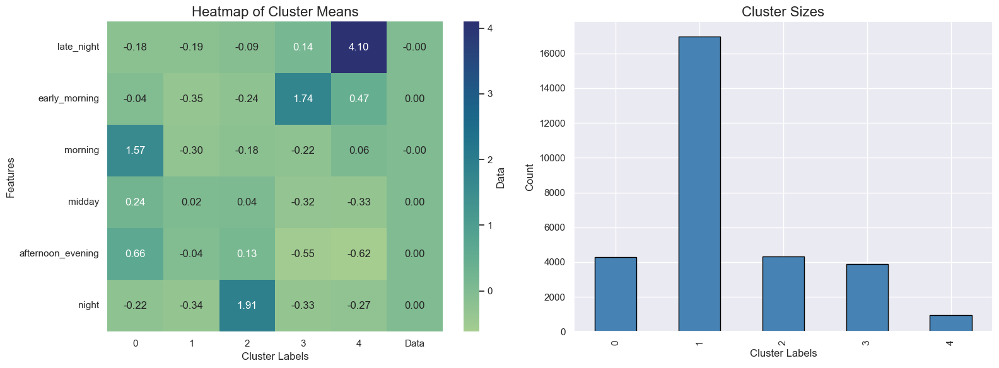

In [184]:
# Calculate cluster means
cluster_means = df_concat.groupby('labels').mean()

# Calculate the overall mean of each feature in the dataset
overall_mean = df_concat[time_feats].mean().rename('Data')

# Add the overall mean as a new column to the cluster means DataFrame
cluster_means_with_overall = cluster_means.T
cluster_means_with_overall['Data'] = overall_mean

# Plot the heatmap and bar chart side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Heatmap of cluster means with the overall data column
sns.heatmap(cluster_means_with_overall, ax=axes[0], annot=True, cmap='crest', fmt=".2f", cbar_kws={'label': 'Data'})
axes[0].set_title('Heatmap of Cluster Means', fontsize=16)
axes[0].set_ylabel('Features', fontsize=12)
axes[0].set_xlabel('Cluster Labels', fontsize=12)

# Bar chart of cluster sizes
cluster_sizes = df_concat['labels'].value_counts().sort_index()
cluster_sizes.plot(kind='bar', ax=axes[1], color='steelblue', edgecolor='black')
axes[1].set_title('Cluster Sizes', fontsize=16)
axes[1].set_ylabel('Count', fontsize=12)
axes[1].set_xlabel('Cluster Labels', fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()


In [185]:
# 6 cluster solution
n_clusters=6

hc6_clust = AgglomerativeClustering(linkage=linkage_, metric=distance, n_clusters=n_clusters)
hc6_labels = hc6_clust.fit_predict(dfs[time_feats])

In [186]:
# Characterizing the 6 clusters
df_concat = pd.concat([dfs[time_feats], 
                       pd.Series(hc6_labels, 
                                 name='labels', 
                                 index=df.index)], 
                    axis=1)

df_concat.groupby('labels').mean()

,late_night,early_morning,morning,midday,afternoon_evening,night
labels,,,,,,
0,-0.191495,-0.354572,-0.303601,0.022535,-0.038094,-0.341850
1,0.141062,1.743278,-0.218926,-0.317076,-0.548489,-0.330172
2,-0.093365,-0.240332,-0.181361,0.035610,0.126675,1.912559
3,-0.119025,0.019830,1.918004,0.033396,-0.303093,-0.243309
4,4.096802,0.465252,0.062594,-0.326918,-0.620063,-0.266574
5,-0.348800,-0.194870,0.661868,0.772295,3.215854,-0.152644


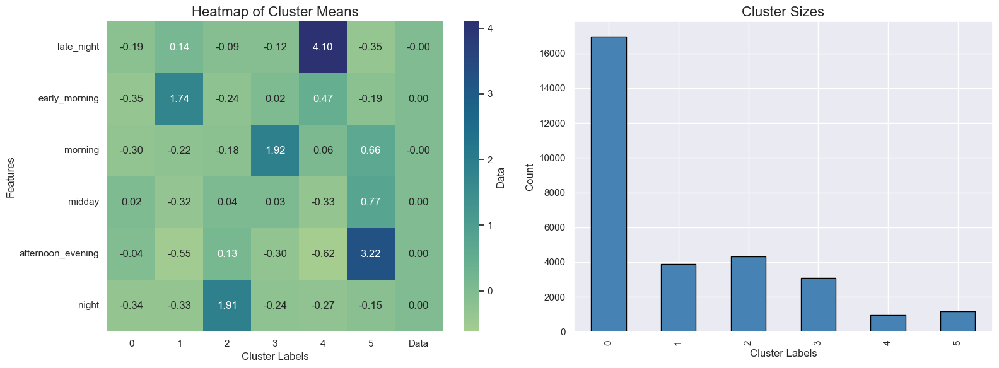

In [187]:
# Calculate cluster means
cluster_means = df_concat.groupby('labels').mean()

# Calculate the overall mean of each feature in the dataset
overall_mean = df_concat[time_feats].mean().rename('Data')

# Add the overall mean as a new column to the cluster means DataFrame
cluster_means_with_overall = cluster_means.T
cluster_means_with_overall['Data'] = overall_mean

# Plot the heatmap and bar chart side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Heatmap of cluster means with the overall data column
sns.heatmap(cluster_means_with_overall, ax=axes[0], annot=True, cmap='crest', fmt=".2f", cbar_kws={'label': 'Data'})
axes[0].set_title('Heatmap of Cluster Means', fontsize=16)
axes[0].set_ylabel('Features', fontsize=12)
axes[0].set_xlabel('Cluster Labels', fontsize=12)

# Bar chart of cluster sizes
cluster_sizes = df_concat['labels'].value_counts().sort_index()
cluster_sizes.plot(kind='bar', ax=axes[1], color='steelblue', edgecolor='black')
axes[1].set_title('Cluster Sizes', fontsize=16)
axes[1].set_ylabel('Count', fontsize=12)
axes[1].set_xlabel('Cluster Labels', fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()


In [188]:
pd.crosstab(
    pd.Series(hc5_labels, name='hc5_labels', index=df.index),
    pd.Series(hc6_labels, name='hc6_labels', index=df.index),
    )

hc6_labels,0,1,2,3,4,5
hc5_labels,,,,,,
0,0,0,0,3106,0,1170
1,16977,0,0,0,0,0
2,0,0,4327,0,0,0
3,0,3892,0,0,0,0
4,0,0,0,0,948,0


Conclusions

With this clustering approach, we consistently observe a minority cluster composed of customers who place orders late at night. When using a 4-cluster solution, the 'morning' time of day is not distinctly associated with any particular cluster. However, in the 5-cluster solution, we identify a specific cluster characterized by customers who predominantly order in the morning. Both approaches result in significantly imbalanced clusters, with the dominant cluster closely resembling the overall data averages.

##### **Final Hierarchical Clustering solution**

Number of clusters defined to 4, based on the dendogram and on the tests done previously.

In [189]:
#Final cluster solution
linkage_ = "ward"
distance = "euclidean"
n_clusters = 4

hclust = AgglomerativeClustering(linkage=linkage_, metric=distance, n_clusters=n_clusters)
hc_labels = hclust.fit_predict(dfs[time_feats])

df_concat = pd.concat([
    dfs[time_feats], 
    pd.Series(hc_labels, name='labels', index=df.index)
    ], 
    axis=1)

In [190]:
df_sst_ = get_ss(df_concat, time_feats)
df_ssb_ = get_ssb(df_concat, time_feats, 'labels')
df_ssw_ = get_ssw(df_concat, time_feats, 'labels')
df_rsq_ = get_rsq(df_concat, time_feats, 'labels')

print("SSb:  ", df_ssb_)
print("SSw:  ", df_ssw_)
print("SSt:  ", df_sst_)
print("R2: ", df_rsq_)

SSb:   53210.05639810972
SSw:   129309.94360189175
SSt:   182520.000000014
R2:  0.29153000437277105


In [191]:
sil_score = silhouette_score(dfs[time_feats], hc_labels)
print(sil_score) #silhouette score

0.24637959855795222


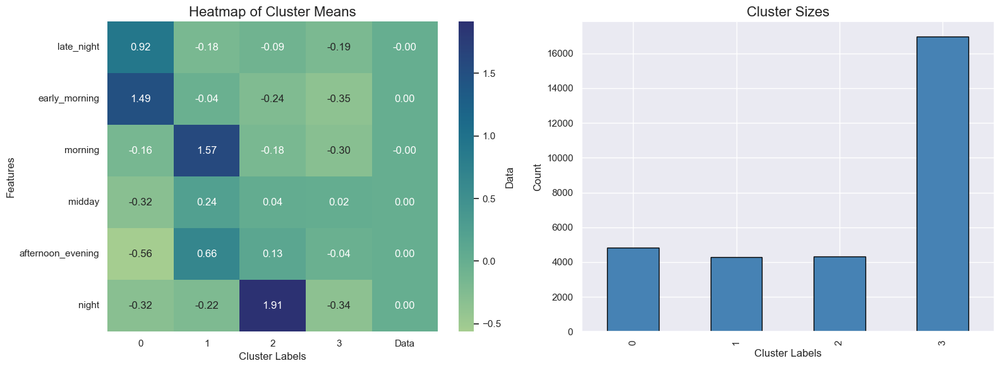

In [192]:
# Calculate cluster means
cluster_means = df_concat.groupby('labels').mean()

# Calculate the overall mean of each feature in the dataset
overall_mean = df_concat[time_feats].mean().rename('Data')

# Add the overall mean as a new column to the cluster means DataFrame
cluster_means_with_overall = cluster_means.T
cluster_means_with_overall['Data'] = overall_mean

# Plot the heatmap and bar chart side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Heatmap of cluster means with the overall data column
sns.heatmap(cluster_means_with_overall, ax=axes[0], annot=True, cmap='crest', fmt=".2f", cbar_kws={'label': 'Data'})
axes[0].set_title('Heatmap of Cluster Means', fontsize=16)
axes[0].set_ylabel('Features', fontsize=12)
axes[0].set_xlabel('Cluster Labels', fontsize=12)

# Bar chart of cluster sizes
cluster_sizes = df_concat['labels'].value_counts().sort_index()
cluster_sizes.plot(kind='bar', ax=axes[1], color='steelblue', edgecolor='black')
axes[1].set_title('Cluster Sizes', fontsize=16)
axes[1].set_ylabel('Count', fontsize=12)
axes[1].set_xlabel('Cluster Labels', fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()


In [193]:
df_concat = pd.concat([dfs[time_feats], 
                       pd.Series(hc5_labels, 
                                 name='labels', 
                                 index=df.index)], 
                    axis=1)

df_concat.groupby('labels').mean()

,late_night,early_morning,morning,midday,afternoon_evening,night
labels,,,,,,
0,-0.181896,-0.038916,1.574300,0.235573,0.659762,-0.218501
1,-0.191495,-0.354572,-0.303601,0.022535,-0.038094,-0.341850
2,-0.093365,-0.240332,-0.181361,0.035610,0.126675,1.912559
3,0.141062,1.743278,-0.218926,-0.317076,-0.548489,-0.330172
4,4.096802,0.465252,0.062594,-0.326918,-0.620063,-0.266574


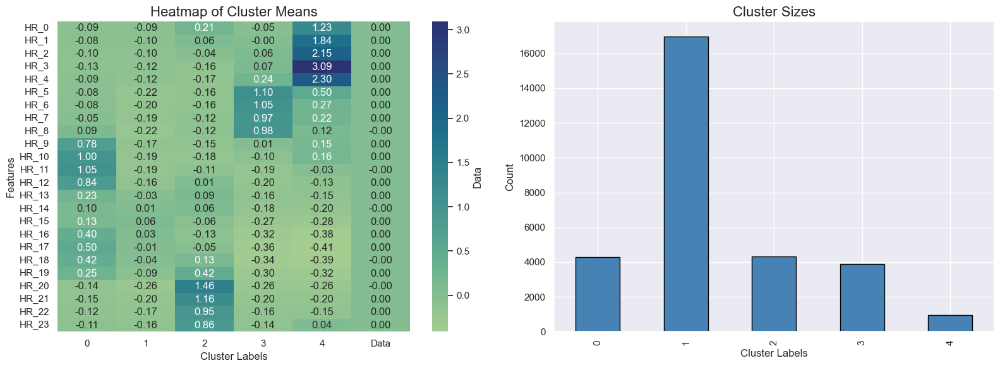

In [194]:
df_concat = pd.concat([dfs[time_feats+hr_features], 
                       pd.Series(hc5_labels, 
                                 name='labels', 
                                 index=df.index)], 
                    axis=1)

df_concat.groupby('labels').mean()

# Calculate cluster means
cluster_means = df_concat.groupby('labels').mean()[hr_features]
# Calculate the overall mean of each feature in the dataset
overall_mean = df_concat[hr_features].mean().rename('Data')
# Add the overall mean as a new column to the cluster means DataFrame
cluster_means_with_overall = cluster_means.T
cluster_means_with_overall['Data'] = overall_mean

# Plot the heatmap and bar chart side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Heatmap of cluster means with the overall data column
sns.heatmap(cluster_means_with_overall, ax=axes[0], annot=True, cmap='crest', fmt=".2f", cbar_kws={'label': 'Data'})
axes[0].set_title('Heatmap of Cluster Means', fontsize=16)
axes[0].set_ylabel('Features', fontsize=12)
axes[0].set_xlabel('Cluster Labels', fontsize=12)

# Bar chart of cluster sizes
cluster_sizes = df_concat['labels'].value_counts().sort_index()
cluster_sizes.plot(kind='bar', ax=axes[1], color='steelblue', edgecolor='black')
axes[1].set_title('Cluster Sizes', fontsize=16)
axes[1].set_ylabel('Count', fontsize=12)
axes[1].set_xlabel('Cluster Labels', fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()


**`Insights`**

This solution is very imbalanced, nevertheless, as stated in the EDA, we have a small but significant number of customers that only purchase late at night. The clustering reveals three distinct groups representing dawn, morning, and afternoon/evening order patterns, along with an additional cluster of customers who do not exhibit a specific ordering pattern tied to a particular time of day.

#### 3.1.2. K-Means

##### Test k-means solutions

In [195]:
range_clusters = range(1, 7)

In [196]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(dfs[time_feats])
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

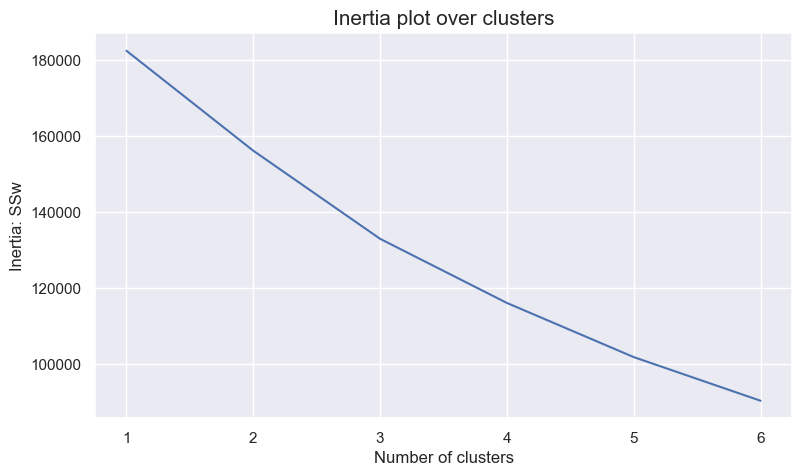

In [197]:
# The inertia plot

fig, ax = plt.subplots(figsize=(9,5))

ax.plot(range_clusters, inertia)
ax.set_xticks(range_clusters)
ax.set_ylabel("Inertia: SSw")
ax.set_xlabel("Number of clusters")
ax.set_title("Inertia plot over clusters", size=15)

plt.show()

For n_clusters = 2, the average silhouette_score is : 0.3415987639145076
For n_clusters = 3, the average silhouette_score is : 0.34767289530896256
For n_clusters = 4, the average silhouette_score is : 0.35176948400143904
For n_clusters = 5, the average silhouette_score is : 0.3793787975190963
For n_clusters = 6, the average silhouette_score is : 0.2874729544709569


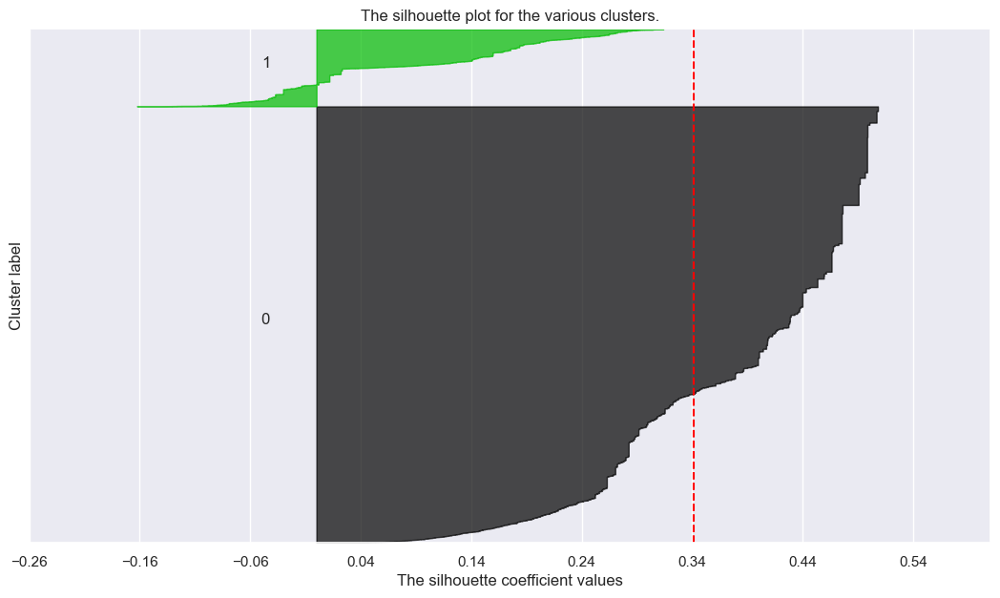

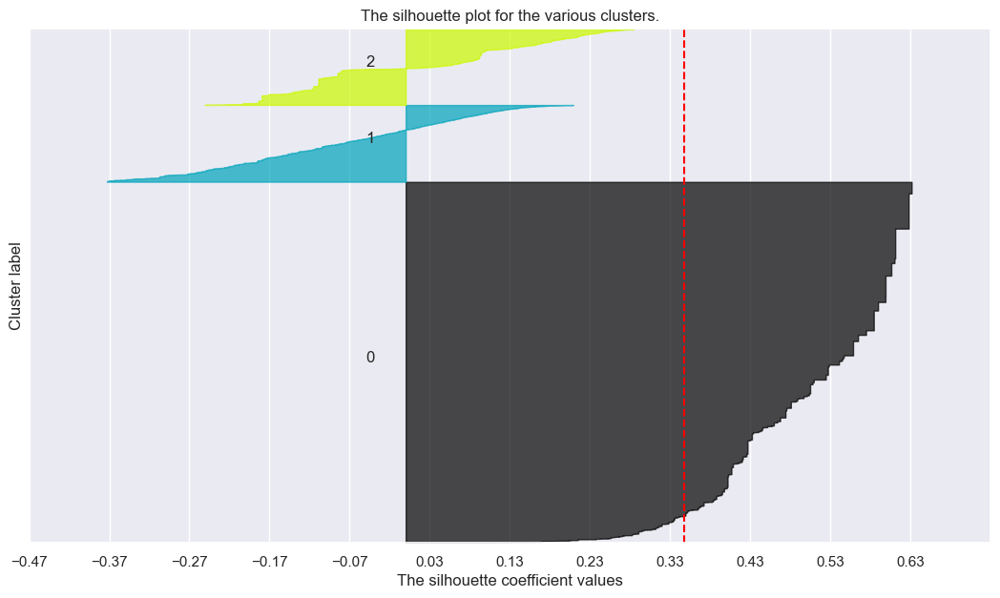

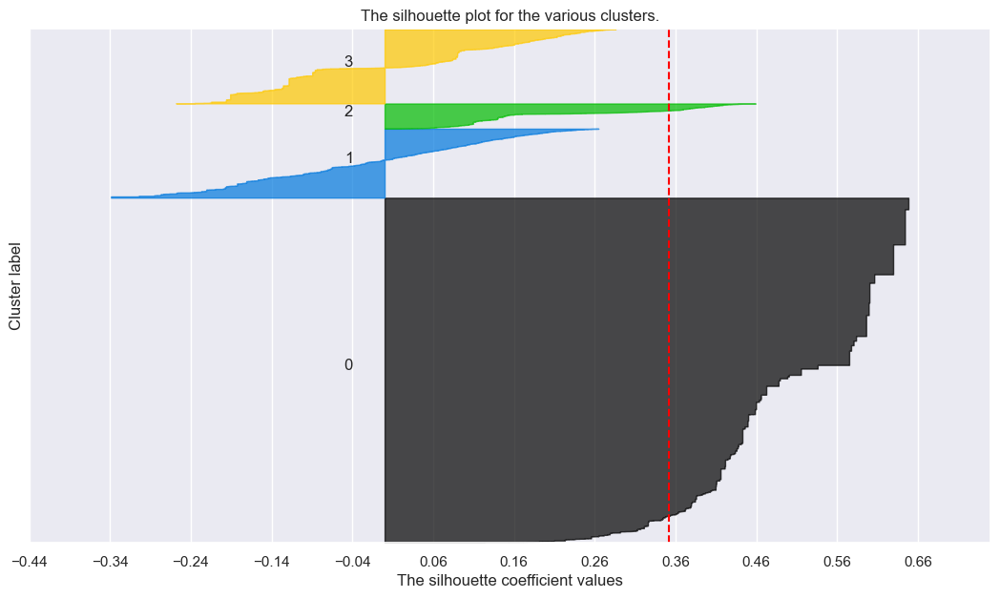

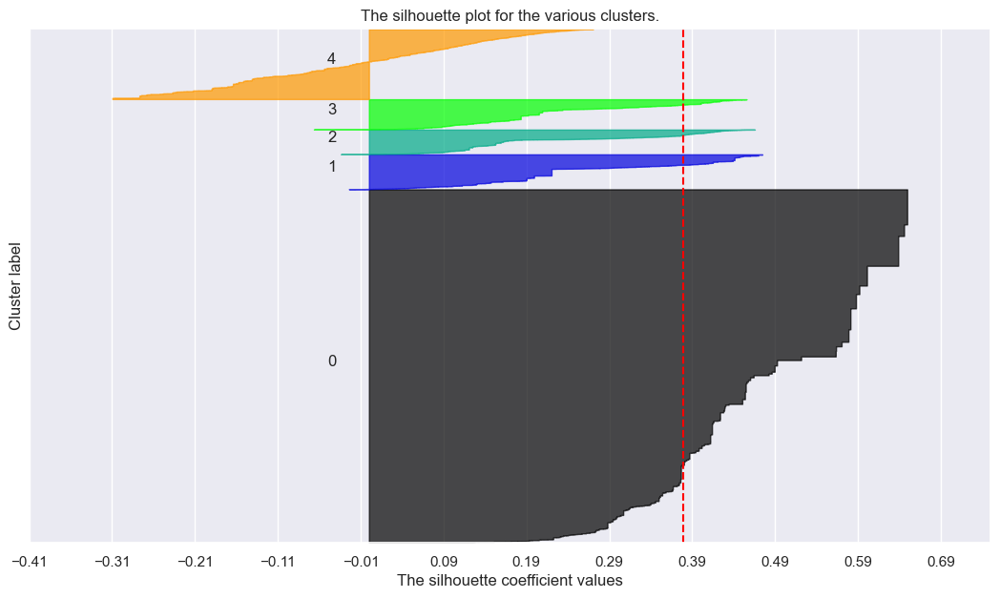

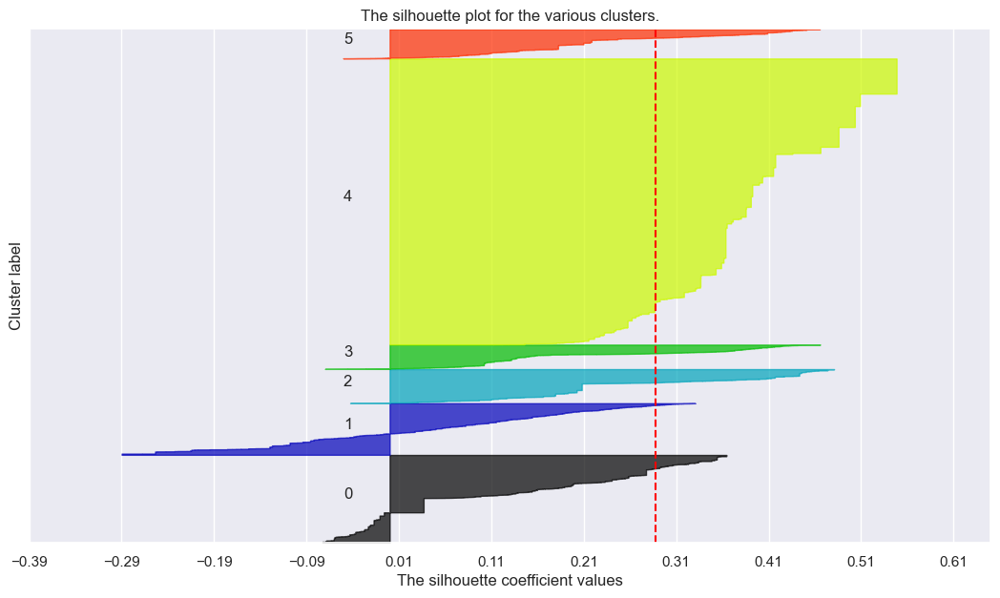

In [198]:
# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(dfs[time_feats])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(dfs[time_feats], cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(dfs[time_feats], cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(dfs[time_feats]) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

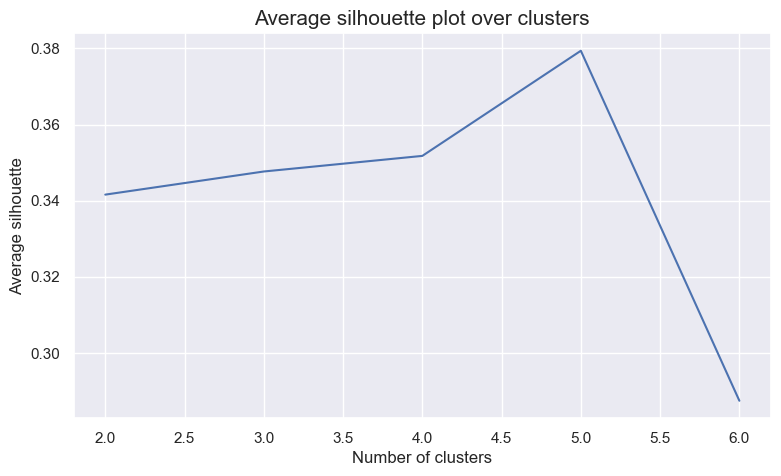

In [199]:
plt.figure(figsize=(9,5))

plt.plot(range_clusters[1:], ## Plot X-axis; 
         avg_silhouette)     ## Plot Y-axis

plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

`Conclusion`

Using inertia as a metric, the "elbow" point is not clearly visible. However, the average silhouette plot reveals a peak at 4 clusters, even though the highest silhouette score occurs with 2 clusters. For our data and objective, 2 clusters seem insufficient, as it represents too low a number for meaningful segmentation. Therefore, we have chosen 4 clusters as the optimal number to proceed with K-means clustering.


##### Final KMeans clustering solution

In [200]:
# final cluster solution
number_clusters = 4
kmclust = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels = kmclust.fit_predict(dfs[time_feats])
km_labels

array([0, 0, 0, ..., 0, 0, 0], dtype=int32)

In [201]:
# Characterizing the final clusters
df_concat = pd.concat((dfs[time_feats], pd.Series(km_labels, name='labels', index=df.index)), axis=1)
df_concat.groupby('labels').mean()

,late_night,early_morning,morning,midday,afternoon_evening,night
labels,,,,,,
0,-0.274223,-0.257210,-0.168370,-0.201708,-0.198136,-0.191134
1,-0.324072,-0.163333,0.860690,1.280872,1.492578,-0.087964
2,-0.031871,-0.235124,-0.043325,0.141775,0.317743,3.559473
3,1.584274,1.424505,-0.002454,-0.299786,-0.571952,-0.227911


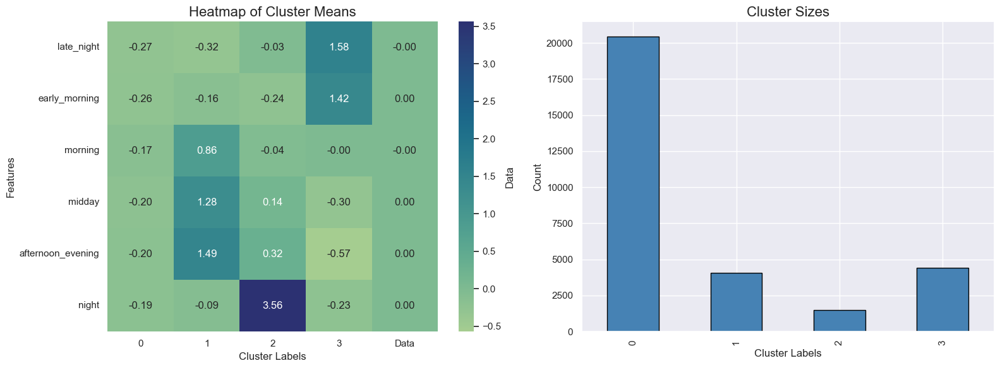

In [202]:
# Calculate cluster means
cluster_means = df_concat.groupby('labels').mean()

# Calculate the overall mean of each feature in the dataset
overall_mean = df_concat[time_feats].mean().rename('Data')

# Add the overall mean as a new column to the cluster means DataFrame
cluster_means_with_overall = cluster_means.T
cluster_means_with_overall['Data'] = overall_mean

# Plot the heatmap and bar chart side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Heatmap of cluster means with the overall data column
sns.heatmap(cluster_means_with_overall, ax=axes[0], annot=True, cmap='crest', fmt=".2f", cbar_kws={'label': 'Data'})
axes[0].set_title('Heatmap of Cluster Means', fontsize=16)
axes[0].set_ylabel('Features', fontsize=12)
axes[0].set_xlabel('Cluster Labels', fontsize=12)

# Bar chart of cluster sizes
cluster_sizes = df_concat['labels'].value_counts().sort_index()
cluster_sizes.plot(kind='bar', ax=axes[1], color='steelblue', edgecolor='black')
axes[1].set_title('Cluster Sizes', fontsize=16)
axes[1].set_ylabel('Count', fontsize=12)
axes[1].set_xlabel('Cluster Labels', fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()


In [203]:
# Characterizing the final clusters
df_concat = pd.concat((dfs[time_feats+hr_features], pd.Series(km_labels, name='labels', index=dfs.index)), axis=1)
df_concat.groupby('labels').mean()

,late_night,early_morning,morning,midday,afternoon_evening,night,HR_0,HR_1,HR_2,HR_3,...,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
labels,,,,,,,,,,,,,,,,,,,,,
0,-0.274223,-0.257210,-0.168370,-0.201708,-0.198136,-0.191134,-0.108830,-0.122821,-0.141710,-0.179512,...,-0.128443,-0.130706,-0.123362,-0.127567,-0.121024,-0.106703,-0.136190,-0.114396,-0.103651,-0.098208
1,-0.324072,-0.163333,0.860690,1.280872,1.492578,-0.087964,-0.107034,-0.129515,-0.158253,-0.222297,...,0.780107,0.950745,1.016963,1.045083,0.895403,0.611619,-0.014927,-0.057196,-0.081716,-0.094771
2,-0.031871,-0.235124,-0.043325,0.141775,0.317743,3.559473,0.357248,0.113433,-0.031723,-0.157802,...,0.136164,-0.026082,-0.081197,0.013200,0.240511,0.692915,2.627372,2.231488,1.930190,1.530183
3,1.584274,1.424505,-0.002454,-0.299786,-0.571952,-0.227911,0.484359,0.652134,0.815278,1.092556,...,-0.173367,-0.266634,-0.343629,-0.381938,-0.349859,-0.305138,-0.237336,-0.166179,-0.092006,0.029327


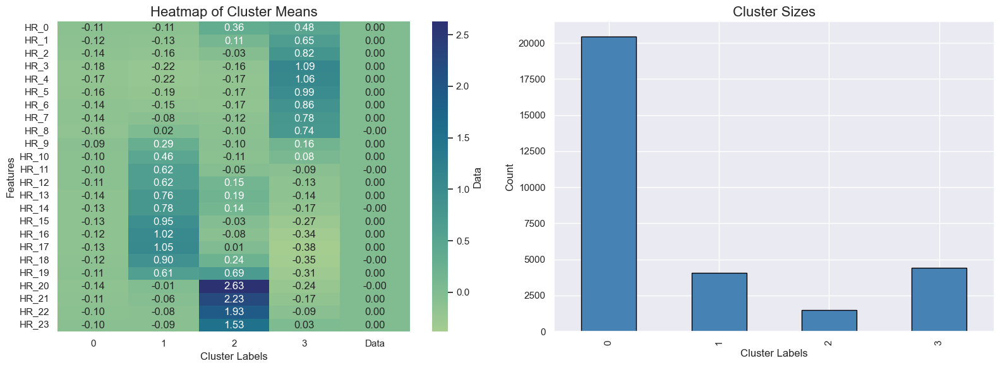

In [204]:
# Calculate cluster means
cluster_means = df_concat.groupby('labels').mean()[hr_features]
# Calculate the overall mean of each feature in the dataset
overall_mean = df_concat[hr_features].mean().rename('Data')
# Add the overall mean as a new column to the cluster means DataFrame
cluster_means_with_overall = cluster_means.T
cluster_means_with_overall['Data'] = overall_mean

# Plot the heatmap and bar chart side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Heatmap of cluster means with the overall data column
sns.heatmap(cluster_means_with_overall, ax=axes[0], annot=True, cmap='crest', fmt=".2f", cbar_kws={'label': 'Data'})
axes[0].set_title('Heatmap of Cluster Means', fontsize=16)
axes[0].set_ylabel('Features', fontsize=12)
axes[0].set_xlabel('Cluster Labels', fontsize=12)

# Bar chart of cluster sizes
cluster_sizes = df_concat['labels'].value_counts().sort_index()
cluster_sizes.plot(kind='bar', ax=axes[1], color='steelblue', edgecolor='black')
axes[1].set_title('Cluster Sizes', fontsize=16)
axes[1].set_ylabel('Count', fontsize=12)
axes[1].set_xlabel('Cluster Labels', fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()


**`Insights`**

K-means is a worst solution, we have a even more imbalanced number of customers per cluster. We have a cluster for people that order in the morning, a cluster for people that order at dawn ad a cluster for people that order mostly in the afternoon.

#### 3.1.3. Gaussian Mixture Model

In [205]:
gmm = GaussianMixture(n_components=4, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
gmm_labels = gmm.fit_predict(dfs[time_feats])
labels_proba = gmm.predict_proba(dfs[time_feats])

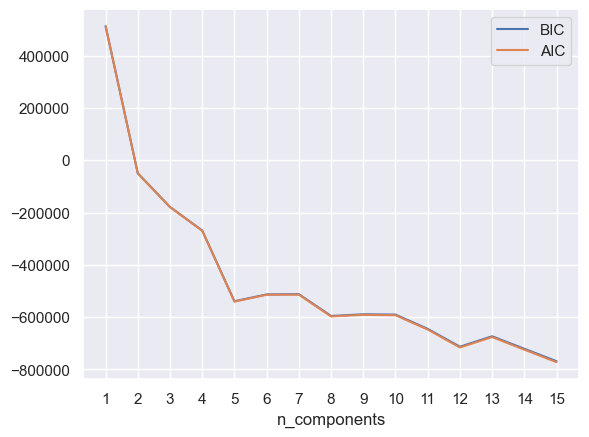

In [206]:
# Selecting number of components based on AIC and BIC
n_components = np.arange(1, 16)
models = [GaussianMixture(n, covariance_type='full', n_init=10, random_state=1).fit(dfs[time_feats])
          for n in n_components]

bic_values = [m.bic(dfs[time_feats]) for m in models]
aic_values = [m.aic(dfs[time_feats]) for m in models]
plt.plot(n_components, bic_values, label='BIC')
plt.plot(n_components, aic_values, label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components')
plt.xticks(n_components)
plt.show()

##### Final model

In [207]:
gmm = GaussianMixture(n_components=4, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
gmm_labels = gmm.fit_predict(dfs[time_feats])
labels_proba = gmm.predict_proba(dfs[time_feats])

In [208]:
# Characterizing the 4 clusters
df_concat = pd.concat([dfs[time_feats], 
                       pd.Series(gmm_labels, 
                                 name='labels', 
                                 index=df.index)], 
                    axis=1)

df_concat.groupby('labels').mean()

,late_night,early_morning,morning,midday,afternoon_evening,night
labels,,,,,,
0,-0.382509,-0.399089,-0.134548,0.027796,0.150637,-0.087954
1,-0.382509,0.734195,0.897238,0.792100,0.808034,1.136555
2,1.509517,0.318825,0.042857,0.197782,0.064634,1.206893
3,0.860077,0.758896,0.059386,-0.362120,-0.666907,-0.347847


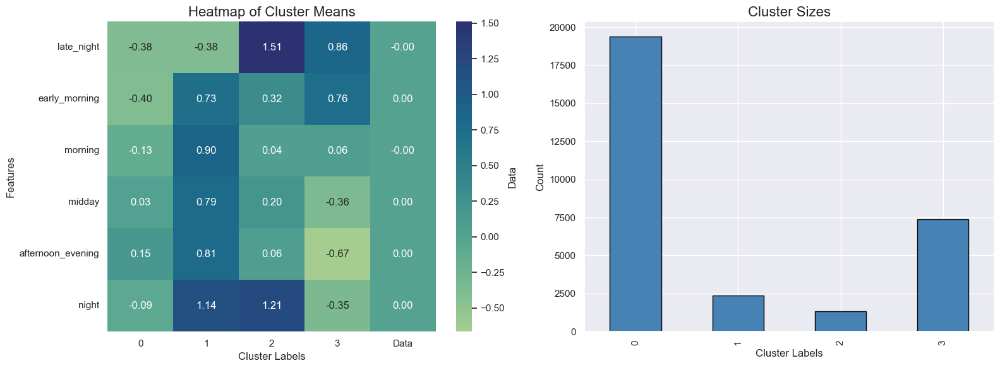

In [209]:
# Calculate cluster means
cluster_means = df_concat.groupby('labels').mean()

# Calculate the overall mean of each feature in the dataset
overall_mean = df_concat[time_feats].mean().rename('Data')

# Add the overall mean as a new column to the cluster means DataFrame
cluster_means_with_overall = cluster_means.T
cluster_means_with_overall['Data'] = overall_mean

# Plot the heatmap and bar chart side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Heatmap of cluster means with the overall data column
sns.heatmap(cluster_means_with_overall, ax=axes[0], annot=True, cmap='crest', fmt=".2f", cbar_kws={'label': 'Data'})
axes[0].set_title('Heatmap of Cluster Means', fontsize=16)
axes[0].set_ylabel('Features', fontsize=12)
axes[0].set_xlabel('Cluster Labels', fontsize=12)

# Bar chart of cluster sizes
cluster_sizes = df_concat['labels'].value_counts().sort_index()
cluster_sizes.plot(kind='bar', ax=axes[1], color='steelblue', edgecolor='black')
axes[1].set_title('Cluster Sizes', fontsize=16)
axes[1].set_ylabel('Count', fontsize=12)
axes[1].set_xlabel('Cluster Labels', fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()


This clustering solution does not effectively differentiate customers based on the time of day they place orders.

#### 3.1.4. Self-Organizing Maps


##### SOM

In [210]:
M = 30
N = 30
neighborhood_function = 'gaussian' 
topology = 'hexagonal' 
n_feats = len(dfs[time_feats].columns)
learning_rate = .7
sigma = 3.0     # Neighborhood radius

som_data = dfs[time_feats].values

sm = MiniSom(M, N,              # 10x10 map size
             n_feats,           # Number of the elements of the vectors in input.
             sigma=sigma,
             learning_rate=learning_rate, 
             topology=topology, 
             neighborhood_function=neighborhood_function, 
             activation_distance='euclidean',
             random_seed=42
             )

# Initializes the weights of the SOM picking random samples from data.
sm.random_weights_init(som_data) 


print("Before training:")
print("QE", np.round(sm.quantization_error(som_data),4))
print("TE", np.round(sm.topographic_error(som_data),4))


# Trains the SOM using all the vectors in data sequentially
# minisom does not distinguish between unfolding and fine tuning phase;

sm.train_batch(som_data, 50000)

print("After training:")
print("QE", np.round(sm.quantization_error(som_data),4))
print("TE", np.round(sm.topographic_error(som_data),4))


Before training:


/opt/anaconda3/lib/python3.12/site-packages/minisom.py:631: RuntimeWarning: invalid value encountered in sqrt
  return sqrt(-2 * cross_term + input_data_sq + weights_flat_sq.T)


QE 0.2877
TE 0.9979
After training:
QE 0.3626
TE 0.0288


In [211]:
weights = sm.get_weights()
weights.shape


(30, 30, 6)

In [212]:
def plot_hexagons(som,              # Trained SOM model 
                  sf,               # matplotlib figure object
                  colornorm,        # colornorm
                  matrix_vals,      # SOM weights or
                  label="",         # title for figure
                  cmap=cm.Grays,    # colormap to use
                  annot=False       
                  ):

    
    axs = sf.subplots(1,1)
    
    for i in range(matrix_vals.shape[0]):
        for j in range(matrix_vals.shape[1]):

            wx, wy = som.convert_map_to_euclidean((i,j)) 

            hex = RegularPolygon((wx, wy), 
                                numVertices=6, 
                                radius= np.sqrt(1/3),
                                facecolor=cmap(colornorm(matrix_vals[i, j])), 
                                alpha=1, 
                                edgecolor='white',
                                linewidth=.5)
            axs.add_patch(hex)
            if annot==True:
                annot_val = np.round(matrix_vals[i,j],2)
                if int(annot_val) == annot_val:
                    annot_val = int(annot_val)
                axs.text(wx,wy, annot_val, 
                        ha='center', va='center', 
                        fontsize='x-small')


    ## Remove axes for hex plot
    axs.margins(.05)
    axs.set_aspect('equal')
    axs.axis("off")
    axs.set_title(label)

    # ## Add colorbar
    divider = make_axes_locatable(axs)
    ax_cb = divider.append_axes("right", size="5%", pad="0%")

    ## Create a Mappable object
    cmap_sm = plt.cm.ScalarMappable(cmap=cmap, norm=colornorm)
    cmap_sm.set_array([])

    ## Create custom colorbar 
    cb1 = colorbar.Colorbar(ax_cb,
                            orientation='vertical', 
                            alpha=1,
                            mappable=cmap_sm
                            )
    cb1.ax.get_yaxis().labelpad = 6

    # Add colorbar to plot
    sf.add_axes(ax_cb)

    return sf 

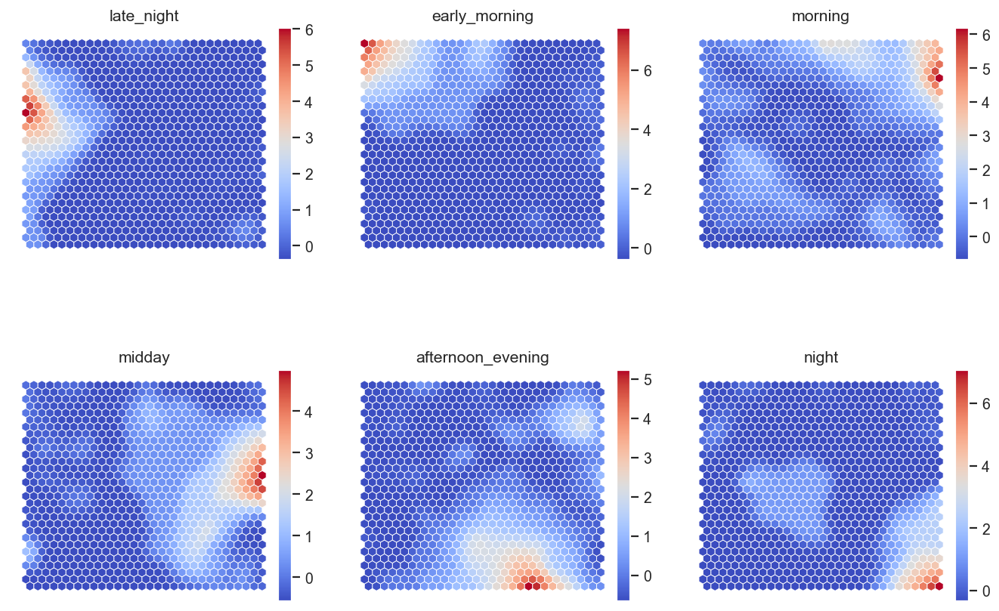

In [213]:
figsize = (10, 7)
fig = plt.figure(figsize=figsize, constrained_layout=True, dpi=128)

# Adjust subfigure layout to match 6 features
subfigs = fig.subfigures(2, 3, wspace=.15)

colornorm = mpl_colors.Normalize(vmin=np.min(weights), vmax=np.max(weights))

# Loop over all 6 features
for cpi, sf in zip(range(weights.shape[2]), subfigs.flatten()):
    matrix_vals = weights[:, :, cpi]
    vext = np.max(np.abs([np.min(matrix_vals), np.max(matrix_vals)]))
    colornorm = mpl_colors.Normalize(vmin=np.min(matrix_vals), vmax=np.max(matrix_vals))

    sf = plot_hexagons(sm, sf, 
                       colornorm,
                       matrix_vals,
                       label=dfs[time_feats].columns[cpi],
                       cmap=cm.coolwarm)


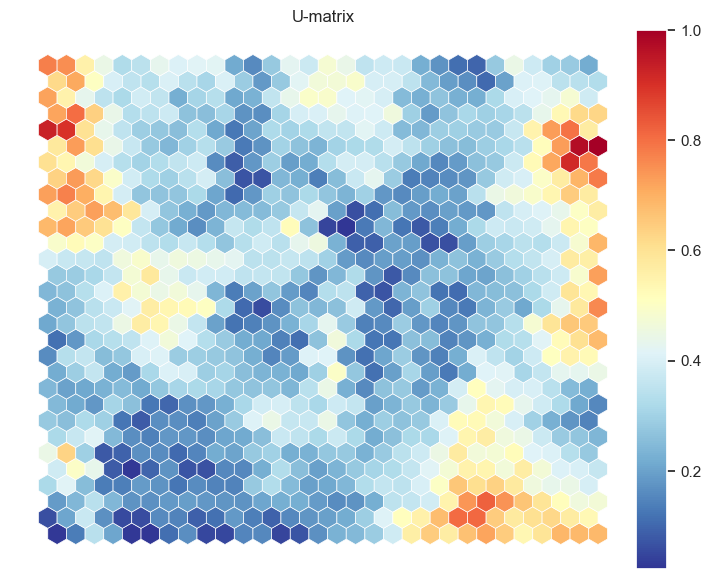

In [214]:
umatrix = sm.distance_map(scaling='mean')
fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=np.min(umatrix), vmax=np.max(umatrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    umatrix,
                    label="U-matrix",
                    cmap=cm.RdYlBu_r,
                    )

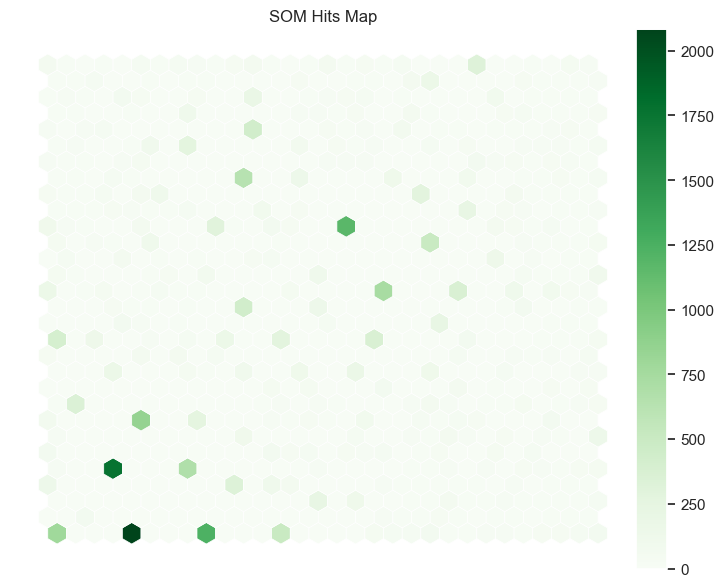

In [215]:
hitsmatrix = sm.activation_response(dfs[time_feats].values)


fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(hitsmatrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    hitsmatrix,
                    label="SOM Hits Map",
                    cmap=cm.Greens,
                    )

In [216]:
np.flip(np.round(hitsmatrix,2), axis=1).T

array([[6.000e+01, 1.800e+01, 2.000e+00, 2.400e+01, 8.000e+00, 4.200e+01,
        1.800e+01, 4.500e+01, 3.200e+01, 1.500e+01, 3.800e+01, 6.200e+01,
        1.900e+01, 0.000e+00, 2.100e+01, 6.400e+01, 1.500e+01, 4.000e+01,
        2.000e+01, 4.500e+01, 0.000e+00, 0.000e+00, 0.000e+00, 3.220e+02,
        0.000e+00, 0.000e+00, 1.800e+01, 5.000e+00, 4.900e+01, 3.100e+01],
       [2.000e+01, 1.000e+01, 4.200e+01, 0.000e+00, 6.000e+00, 1.800e+01,
        1.000e+00, 1.000e+01, 9.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 4.000e+01, 4.000e+00, 8.000e+00, 1.100e+01, 9.000e+00,
        0.000e+00, 5.700e+01, 1.620e+02, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 3.500e+01, 1.900e+01, 1.200e+01, 9.000e+00, 2.900e+01],
       [1.700e+01, 2.500e+01, 1.100e+01, 0.000e+00, 7.200e+01, 3.600e+01,
        0.000e+00, 3.000e+00, 3.900e+01, 0.000e+00, 0.000e+00, 1.890e+02,
        0.000e+00, 0.000e+00, 1.900e+01, 2.900e+01, 3.400e+01, 4.700e+01,
        0.000e+00, 2.100e+01, 0.000e

In [217]:
sm.quantization_error(dfs[time_feats].values)

0.362628240716001

In [218]:
# Extract SOM weights
weights = sm.get_weights()  # Shape: (rows, cols, features)

# Reshape weights into a 2D array for clustering
weights_reshaped = weights.reshape(-1, weights.shape[-1])  # Shape: (rows*cols, features)


##### KMEANS WITH 4 CLUSTERS ON TOP OF SOM

In [219]:
n_clusters = 4
# Fit K-means
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans_labels = kmeans.fit_predict(weights_reshaped)  

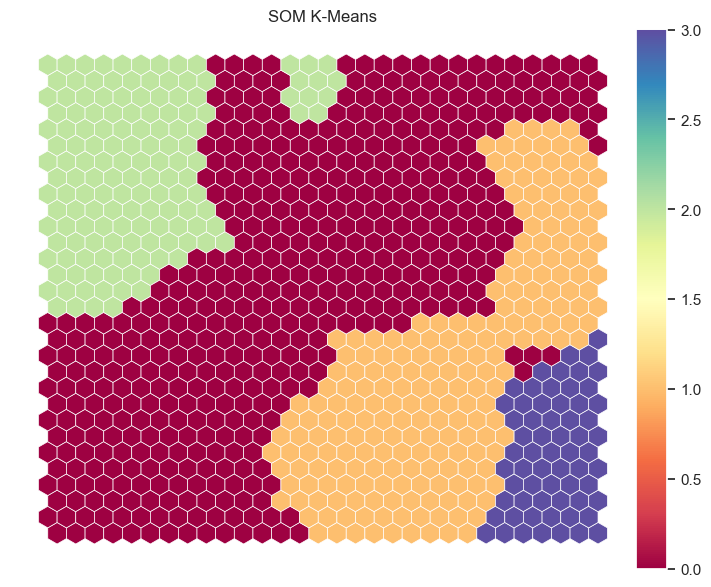

In [220]:
kmeans_matrix = kmeans_labels.reshape((M,N))

fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(kmeans_matrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    kmeans_matrix,
                    label="SOM K-Means",
                    cmap=cm.Spectral,
                    )


In [221]:
cluster_assignments = [sm.winner(data_point) for data_point in dfs[time_feats].values]

In [222]:
bmu_clusters = {tuple(bmu): cluster for bmu, cluster in zip([(i // sm._weights.shape[1], i % sm._weights.shape[1]) for i in range(len(kmeans_labels))], kmeans_labels)}

# Assign each data point to its cluster
data_clusters = [bmu_clusters[tuple(bmu)] for bmu in cluster_assignments]

In [223]:
# Create a DataFrame for profiling
cluster_profiles_kmeans = (
    dfs[time_feats]
    .assign(cluster=data_clusters)
    .groupby('cluster')
    .agg(['mean', 'median', 'count'])
)

from IPython.display import display
display(cluster_profiles_kmeans)


late_night                  early_morning                    morning  \
              mean    median  count          mean    median  count      mean   
cluster                                                                        
0        -0.169515 -0.382509  20451     -0.230062 -0.399089  20451 -0.042448   
1        -0.331856 -0.382509   5126     -0.278251 -0.399089   5126  0.171433   
2         1.544393  0.713050   3454      1.879981  2.198043   3454  0.027320   
3        -0.119859 -0.382509   1389     -0.260725 -0.399089   1389 -0.075608   

                            midday                  afternoon_evening  \
           median  count      mean    median  count              mean   
cluster                                                                 
0       -0.020673  20451 -0.256341 -0.583877  20451         -0.274522   
1       -0.020673   5126  1.191014  1.326684   5126          1.355976   
2       -0.020673   3454 -0.299007 -0.583877   3454         -0.530692   
3       -0.678476   1389  0.122439 -0.583877   1389          0.357470   

                             night                   
           median  count      mean    median  count  
cluster                                              
0       -0.666907  20451 -0.178450 -0.347847  20451  
1        1.133422   5126 -0.110311 -0.347847   5126  
2       -0.666907   3454 -0.229942 -0.347847   3454  
3       -0.066797   1389  3.606303  2.403813   1389

In [224]:
# Create a new DataFrame for profiling
df_concat = dfs.copy()  # Keep original `dfs` unchanged
df_concat['labels'] = data_clusters

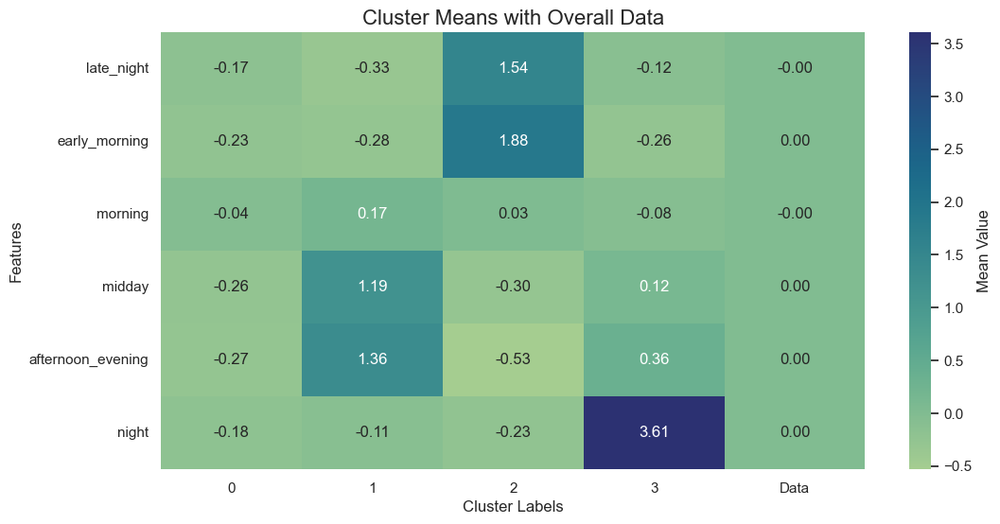

In [225]:
# Calculate overall means
overall_mean = df_concat[time_feats].mean().rename('Data')

# Calculate cluster means
cluster_means = df_concat.groupby('labels')[time_feats].mean()

# Combine overall means with cluster means
cluster_means_with_overall = cluster_means.T
cluster_means_with_overall['Data'] = overall_mean

# Heatmap of cluster means with overall data
plt.figure(figsize=(12, 6))
sns.heatmap(cluster_means_with_overall, annot=True, cmap='crest', fmt=".2f", cbar_kws={'label': 'Mean Value'})
plt.title('Cluster Means with Overall Data', fontsize=16)
plt.xlabel('Cluster Labels', fontsize=12)
plt.ylabel('Features', fontsize=12)
plt.show()


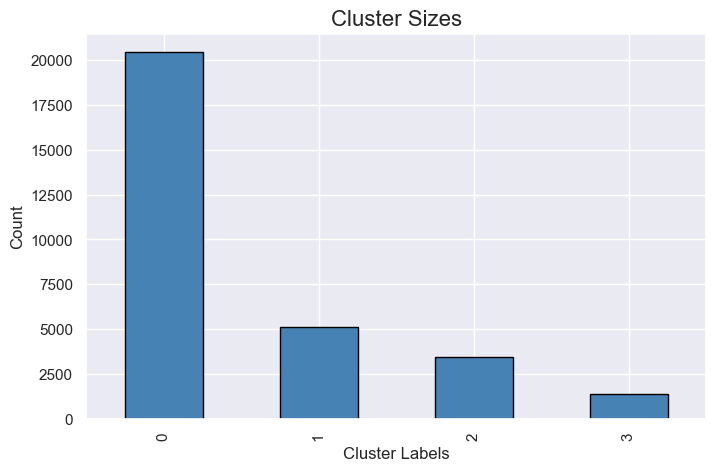

In [226]:
# Bar chart for cluster sizes
cluster_sizes = df_concat['labels'].value_counts().sort_index()
cluster_sizes.plot(kind='bar', color='steelblue', edgecolor='black', figsize=(8, 5))
plt.title('Cluster Sizes', fontsize=16)
plt.xlabel('Cluster Labels', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.show()


##### KMEANS WITH 5 CLUSTERS ON TOP OF SOM

In [227]:
n_clusters = 5
# Fit K-means
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans_labels = kmeans.fit_predict(weights_reshaped)  

In [228]:
kmeans_labels

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 2, 2, 2, 2, 2, 2,
       2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 4, 4, 4, 4, 4, 4, 4, 4, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 4, 4, 4, 4, 0, 0, 2, 2, 2, 2,
       2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 4, 4,
       4, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 4, 4, 4, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2,
       0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0,

In [229]:
cluster_assignments = [sm.winner(data_point) for data_point in dfs[time_feats].values]

In [230]:
bmu_clusters = {tuple(bmu): cluster for bmu, cluster in zip([(i // sm._weights.shape[1], i % sm._weights.shape[1]) for i in range(len(kmeans_labels))], kmeans_labels)}

# Assign each data point to its cluster
data_clusters = [bmu_clusters[tuple(bmu)] for bmu in cluster_assignments]

In [231]:
# Create a DataFrame for profiling
cluster_profiles_kmeans = (
    dfs[time_feats]
    .assign(cluster=data_clusters)
    .groupby('cluster')
    .agg(['mean', 'median', 'count'])
)

from IPython.display import display
display(cluster_profiles_kmeans)


late_night                  early_morning                    morning  \
              mean    median  count          mean    median  count      mean   
cluster                                                                        
0        -0.223389 -0.382509  20194     -0.196787 -0.399089  20194 -0.042400   
1        -0.331856 -0.382509   5126     -0.278251 -0.399089   5126  0.171433   
2         0.360816 -0.382509   1748      3.162311  2.198043   1748  0.221300   
3        -0.119859 -0.382509   1389     -0.260725 -0.399089   1389 -0.075608   
4         2.928166  1.808609   1963      0.119543 -0.399089   1963 -0.155048   

                            midday                  afternoon_evening  \
           median  count      mean    median  count              mean   
cluster                                                                 
0       -0.020673  20194 -0.252409 -0.583877  20194         -0.272411   
1       -0.020673   5126  1.191014  1.326684   5126          1.355976   
2       -0.020673   1748 -0.206246 -0.583877   1748         -0.431738   
3       -0.678476   1389  0.122439 -0.583877   1389          0.357470   
4       -0.678476   1963 -0.416471 -0.583877   1963         -0.606988   

                             night                   
           median  count      mean    median  count  
cluster                                              
0       -0.666907  20194 -0.188558 -0.347847  20194  
1        1.133422   5126 -0.110311 -0.347847   5126  
2       -0.666907   1748 -0.231358 -0.347847   1748  
3       -0.066797   1389  3.606303  2.403813   1389  
4       -0.666907   1963 -0.117958 -0.347847   1963

In [232]:
# Create a new DataFrame for profiling
df_concat = dfs.copy()  # Keep original `dfs` unchanged
df_concat['labels'] = data_clusters

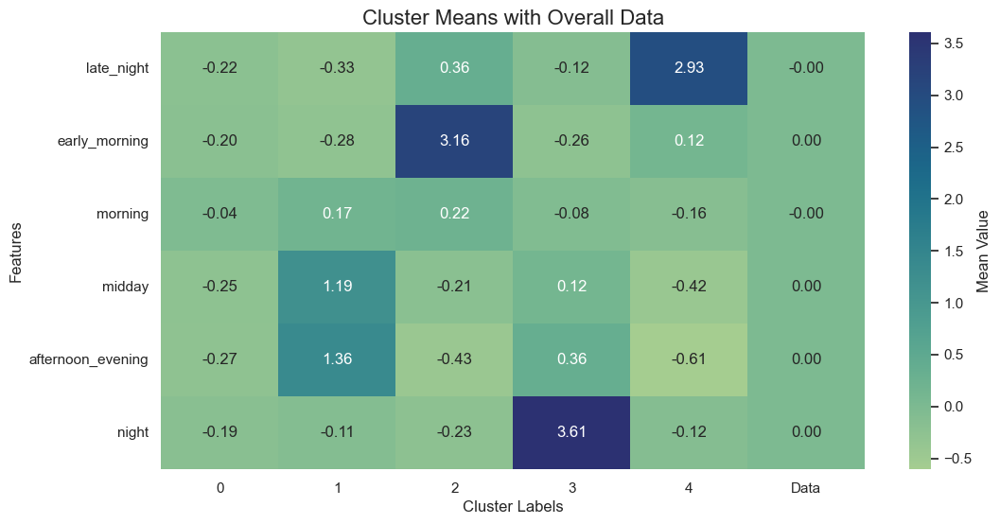

In [233]:
# Calculate overall means
overall_mean = df_concat[time_feats].mean().rename('Data')

# Calculate cluster means
cluster_means = df_concat.groupby('labels')[time_feats].mean()

# Combine overall means with cluster means
cluster_means_with_overall = cluster_means.T
cluster_means_with_overall['Data'] = overall_mean

# Heatmap of cluster means with overall data
plt.figure(figsize=(12, 6))
sns.heatmap(cluster_means_with_overall, annot=True, cmap='crest', fmt=".2f", cbar_kws={'label': 'Mean Value'})
plt.title('Cluster Means with Overall Data', fontsize=16)
plt.xlabel('Cluster Labels', fontsize=12)
plt.ylabel('Features', fontsize=12)
plt.show()


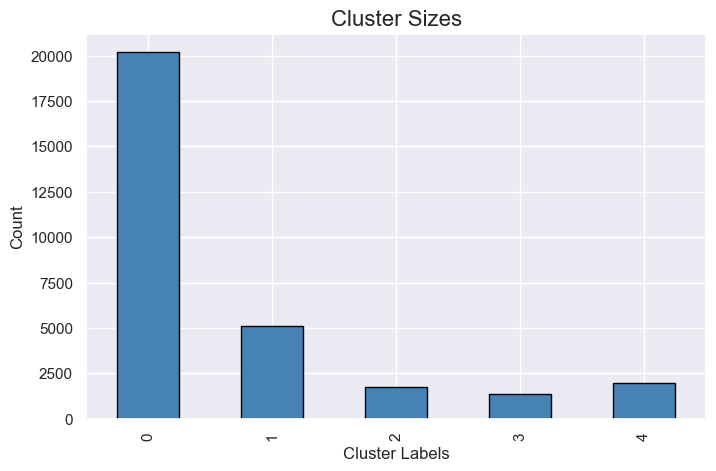

In [234]:
# Bar chart for cluster sizes
cluster_sizes = df_concat['labels'].value_counts().sort_index()
cluster_sizes.plot(kind='bar', color='steelblue', edgecolor='black', figsize=(8, 5))
plt.title('Cluster Sizes', fontsize=16)
plt.xlabel('Cluster Labels', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.show()


In [235]:
# Evaluate K-means
silhouette_kmeans = silhouette_score(dfs[time_feats].values, data_clusters)
print(f"Silhouette Score (K-means): {silhouette_kmeans}")

Silhouette Score (K-means): 0.3304729103116275


##### KMEANS WITH 6 CLUSTERS ON TOP OF SOM

In [236]:
n_clusters = 6
# Fit K-means
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans_labels = kmeans.fit_predict(weights_reshaped)  

In [237]:
cluster_assignments = [sm.winner(data_point) for data_point in dfs[time_feats].values]

In [238]:
bmu_clusters = {tuple(bmu): cluster for bmu, cluster in zip([(i // sm._weights.shape[1], i % sm._weights.shape[1]) for i in range(len(kmeans_labels))], kmeans_labels)}

# Assign each data point to its cluster
data_clusters = [bmu_clusters[tuple(bmu)] for bmu in cluster_assignments]

In [239]:
# Create a DataFrame for profiling
cluster_profiles_kmeans = (
    dfs[time_feats]
    .assign(cluster=data_clusters)
    .groupby('cluster')
    .agg(['mean', 'median', 'count'])
)

from IPython.display import display
display(cluster_profiles_kmeans)


late_night                  early_morning                    morning  \
              mean    median  count          mean    median  count      mean   
cluster                                                                        
0        -0.348245 -0.382509   3645     -0.302187 -0.399089   3645  0.279625   
1        -0.272839 -0.382509   2867     -0.274532 -0.399089   2867  0.087393   
2         0.360816 -0.382509   1748      3.162311  2.198043   1748  0.221300   
3        -0.118935 -0.382509   1301     -0.269332 -0.399089   1301 -0.113705   
4         2.928166  1.808609   1963      0.119543 -0.399089   1963 -0.155048   
5        -0.220808 -0.382509  18896     -0.186464 -0.399089  18896 -0.063735   

                            midday                  afternoon_evening  \
           median  count      mean    median  count              mean   
cluster                                                                 
0       -0.020673   3645  0.107227 -0.583877   3645          1.997284   
1       -0.678476   2867  2.205995  1.326684   2867          0.016301   
2       -0.020673   1748 -0.206246 -0.583877   1748         -0.431738   
3       -0.678476   1301  0.006473 -0.583877   1301          0.283766   
4       -0.678476   1963 -0.416471 -0.583877   1963         -0.606988   
5       -0.020673  18896 -0.293491 -0.583877  18896         -0.304288   

                             night                   
           median  count      mean    median  count  
cluster                                              
0        1.733532   3645 -0.078720 -0.347847   3645  
1       -0.066797   2867 -0.061836 -0.347847   2867  
2       -0.666907   1748 -0.231358 -0.347847   1748  
3       -0.066797   1301  3.652741  2.403813   1301  
4       -0.666907   1963 -0.117958 -0.347847   1963  
5       -0.666907  18896 -0.193270 -0.347847  18896

In [240]:
# Create a new DataFrame for profiling
df_concat = dfs.copy()  # Keep original `dfs` unchanged
df_concat['labels'] = data_clusters

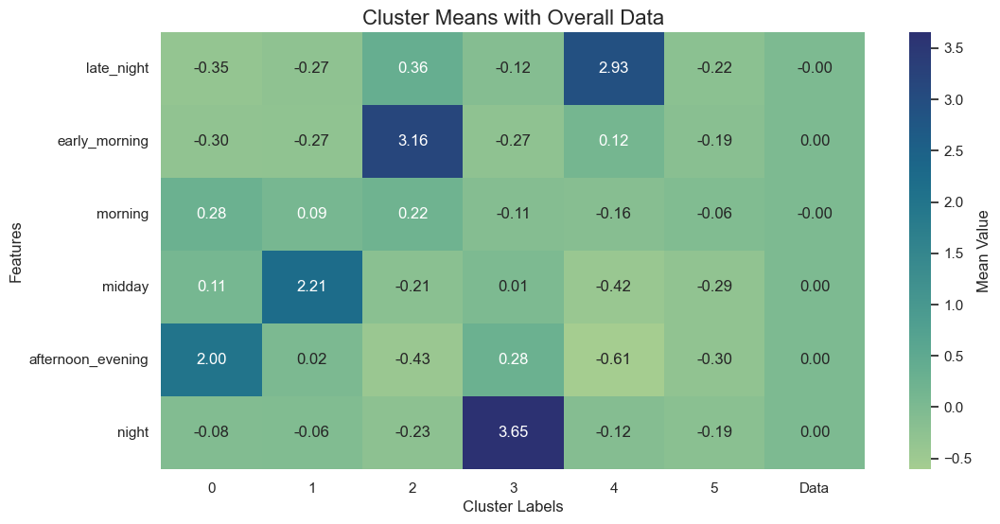

In [241]:
# Calculate overall means
overall_mean = df_concat[time_feats].mean().rename('Data')

# Calculate cluster means
cluster_means = df_concat.groupby('labels')[time_feats].mean()

# Combine overall means with cluster means
cluster_means_with_overall = cluster_means.T
cluster_means_with_overall['Data'] = overall_mean

# Heatmap of cluster means with overall data
plt.figure(figsize=(12, 6))
sns.heatmap(cluster_means_with_overall, annot=True, cmap='crest', fmt=".2f", cbar_kws={'label': 'Mean Value'})
plt.title('Cluster Means with Overall Data', fontsize=16)
plt.xlabel('Cluster Labels', fontsize=12)
plt.ylabel('Features', fontsize=12)
plt.show()


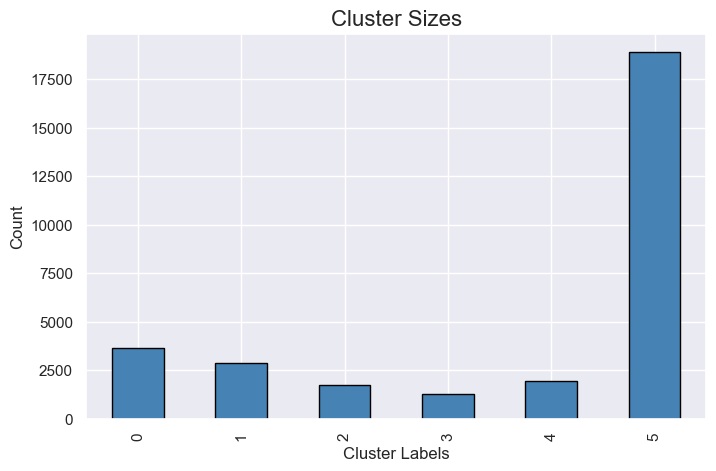

In [242]:
# Bar chart for cluster sizes
cluster_sizes = df_concat['labels'].value_counts().sort_index()
cluster_sizes.plot(kind='bar', color='steelblue', edgecolor='black', figsize=(8, 5))
plt.title('Cluster Sizes', fontsize=16)
plt.xlabel('Cluster Labels', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.show()


In [243]:
# Evaluate K-means
silhouette_kmeans = silhouette_score(dfs[time_feats].values, data_clusters)
print(f"Silhouette Score (K-means): {silhouette_kmeans}")

Silhouette Score (K-means): 0.32975384510983446


##### **HIERARCHICAL ON TOP OF SOM WITH 4 CLUSTERS**

In [244]:
n_clusters = 4
hierarchical = AgglomerativeClustering(
    n_clusters=n_clusters,
    metric='euclidean',  # Distance metric
    linkage='ward'         # Linkage criterion
)
hierarchical_labels = hierarchical.fit_predict(weights_reshaped) 

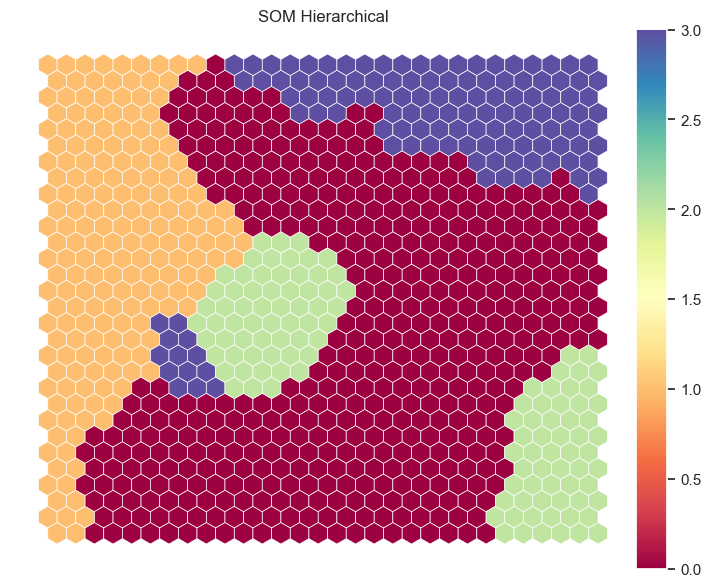

In [245]:
hclust_matrix = hierarchical_labels.reshape((M,N))

fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(hclust_matrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    hclust_matrix,
                    label="SOM Hierarchical",
                    cmap=cm.Spectral,
                    )

In [246]:
# Map hierarchical clusters to BMUs
bmu_to_cluster_hierarchical = {
    tuple(bmu): cluster for bmu, cluster in zip(
        [(i // sm._weights.shape[1], i % sm._weights.shape[1]) for i in range(len(hierarchical_labels))],
        hierarchical_labels
    )
}

# Assign clusters to data points
data_clusters_hierarchical = [bmu_to_cluster_hierarchical[tuple(bmu)] for bmu in cluster_assignments]

# Add cluster labels to a copy of the data for profiling
df_concat_hierarchical = dfs.copy()
df_concat_hierarchical['labels'] = data_clusters_hierarchical

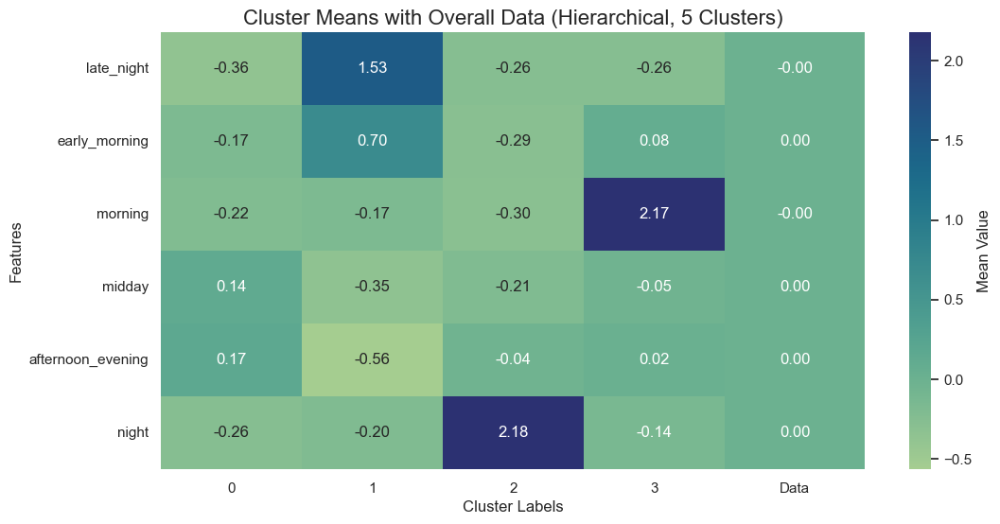

In [247]:
# Calculate overall means
overall_mean = df_concat_hierarchical[time_feats].mean().rename('Data')

# Calculate cluster means
cluster_means = df_concat_hierarchical.groupby('labels')[time_feats].mean()

# Combine overall means with cluster means
cluster_means_with_overall = cluster_means.T
cluster_means_with_overall['Data'] = overall_mean

# Heatmap of cluster means with overall data
plt.figure(figsize=(12, 6))
sns.heatmap(cluster_means_with_overall, annot=True, cmap='crest', fmt=".2f", cbar_kws={'label': 'Mean Value'})
plt.title('Cluster Means with Overall Data (Hierarchical, 5 Clusters)', fontsize=16)
plt.xlabel('Cluster Labels', fontsize=12)
plt.ylabel('Features', fontsize=12)
plt.show()


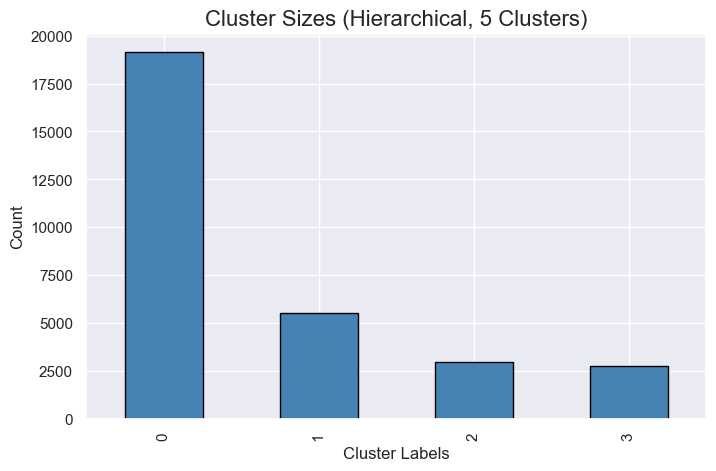

In [248]:
# Bar chart for cluster sizes
cluster_sizes = df_concat_hierarchical['labels'].value_counts().sort_index()
cluster_sizes.plot(kind='bar', color='steelblue', edgecolor='black', figsize=(8, 5))
plt.title('Cluster Sizes (Hierarchical, 5 Clusters)', fontsize=16)
plt.xlabel('Cluster Labels', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.show()


##### HIERARCHICAL ON TOP OF SOM WITH 5 CLUSTERS

In [249]:
n_clusters = 5
hierarchical = AgglomerativeClustering(
    n_clusters=n_clusters,
    metric='euclidean',  # Distance metric
    linkage='ward'         # Linkage criterion
)
hierarchical_labels = hierarchical.fit_predict(weights_reshaped) 

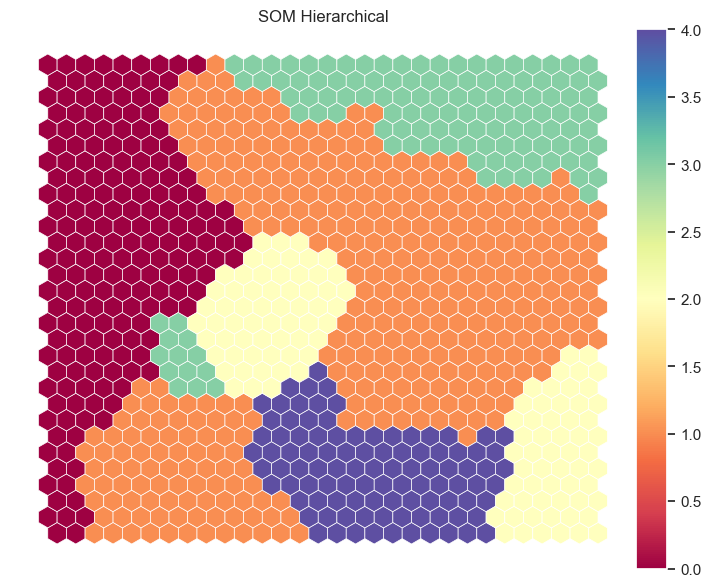

In [250]:
hclust_matrix = hierarchical_labels.reshape((M,N))

fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(hclust_matrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    hclust_matrix,
                    label="SOM Hierarchical",
                    cmap=cm.Spectral,
                    )

In [251]:
# Map hierarchical clusters to BMUs
bmu_to_cluster_hierarchical = {
    tuple(bmu): cluster for bmu, cluster in zip(
        [(i // sm._weights.shape[1], i % sm._weights.shape[1]) for i in range(len(hierarchical_labels))],
        hierarchical_labels
    )
}

# Assign clusters to data points
data_clusters_hierarchical = [bmu_to_cluster_hierarchical[tuple(bmu)] for bmu in cluster_assignments]

# Add cluster labels to a copy of the data for profiling
df_concat_hierarchical = dfs.copy()
df_concat_hierarchical['labels'] = data_clusters_hierarchical


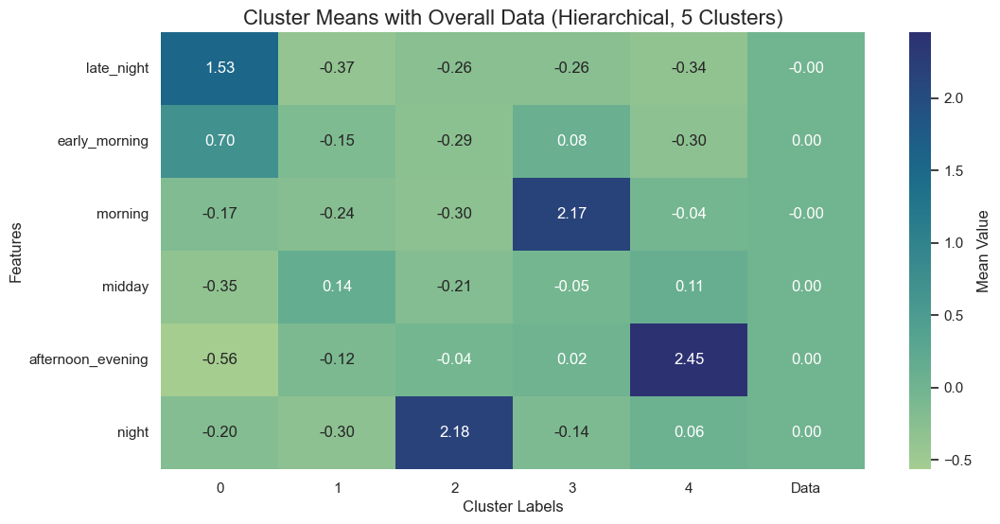

In [252]:
# Calculate overall means
overall_mean = df_concat_hierarchical[time_feats].mean().rename('Data')

# Calculate cluster means
cluster_means = df_concat_hierarchical.groupby('labels')[time_feats].mean()

# Combine overall means with cluster means
cluster_means_with_overall = cluster_means.T
cluster_means_with_overall['Data'] = overall_mean

# Heatmap of cluster means with overall data
plt.figure(figsize=(12, 6))
sns.heatmap(cluster_means_with_overall, annot=True, cmap='crest', fmt=".2f", cbar_kws={'label': 'Mean Value'})
plt.title('Cluster Means with Overall Data (Hierarchical, 5 Clusters)', fontsize=16)
plt.xlabel('Cluster Labels', fontsize=12)
plt.ylabel('Features', fontsize=12)
plt.show()


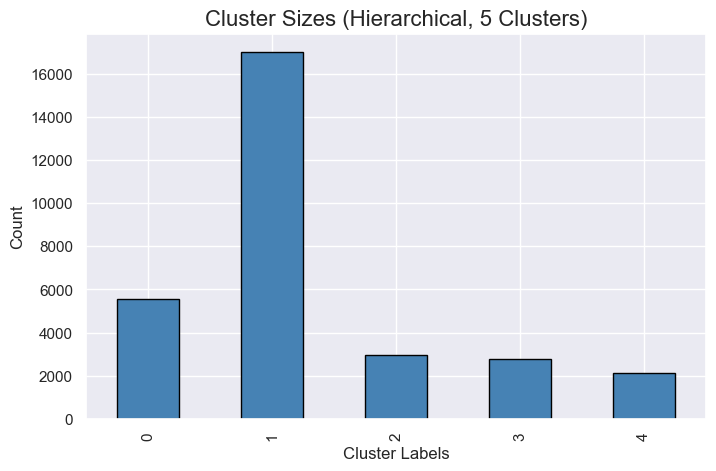

In [253]:
# Bar chart for cluster sizes
cluster_sizes = df_concat_hierarchical['labels'].value_counts().sort_index()
cluster_sizes.plot(kind='bar', color='steelblue', edgecolor='black', figsize=(8, 5))
plt.title('Cluster Sizes (Hierarchical, 5 Clusters)', fontsize=16)
plt.xlabel('Cluster Labels', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.show()


##### HIERARCHICAL WITH 6 CLUSTERS ON TOP OF SOM

In [254]:
n_clusters = 6
hierarchical = AgglomerativeClustering(
    n_clusters=n_clusters,
    metric='euclidean',  # Distance metric
    linkage='ward'         # Linkage criterion
)
hierarchical_labels = hierarchical.fit_predict(weights_reshaped) 

In [255]:
# Map hierarchical clusters to BMUs
bmu_to_cluster_hierarchical = {
    tuple(bmu): cluster for bmu, cluster in zip(
        [(i // sm._weights.shape[1], i % sm._weights.shape[1]) for i in range(len(hierarchical_labels))],
        hierarchical_labels
    )
}

# Assign clusters to data points
data_clusters_hierarchical = [bmu_to_cluster_hierarchical[tuple(bmu)] for bmu in cluster_assignments]

# Add cluster labels to a copy of the data for profiling
df_concat_hierarchical = dfs.copy()
df_concat_hierarchical['labels'] = data_clusters_hierarchical

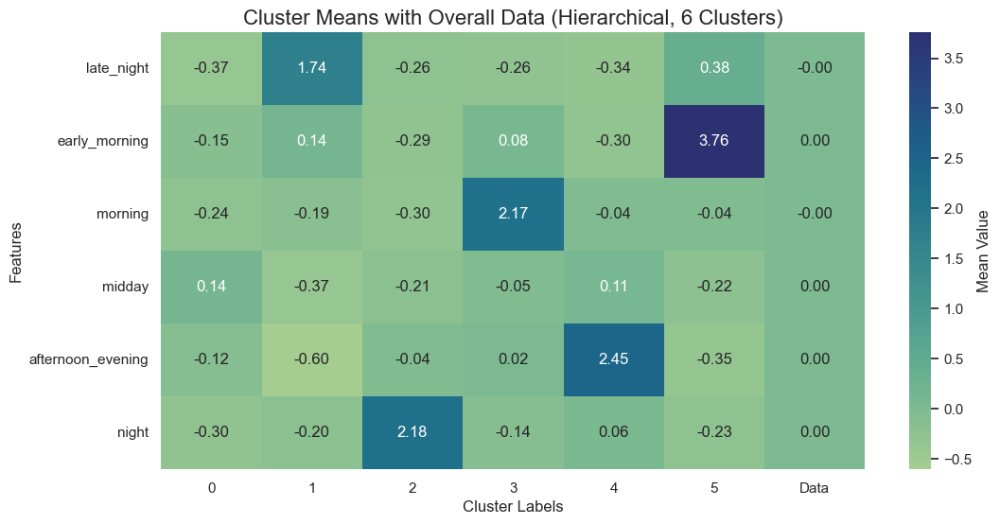

In [256]:
# Calculate overall means
overall_mean = df_concat_hierarchical[time_feats].mean().rename('Data')

# Calculate cluster means
cluster_means = df_concat_hierarchical.groupby('labels')[time_feats].mean()

# Combine overall means with cluster means
cluster_means_with_overall = cluster_means.T
cluster_means_with_overall['Data'] = overall_mean

# Heatmap of cluster means with overall data
plt.figure(figsize=(12, 6))
sns.heatmap(cluster_means_with_overall, annot=True, cmap='crest', fmt=".2f", cbar_kws={'label': 'Mean Value'})
plt.title('Cluster Means with Overall Data (Hierarchical, 6 Clusters)', fontsize=16)
plt.xlabel('Cluster Labels', fontsize=12)
plt.ylabel('Features', fontsize=12)
plt.show()


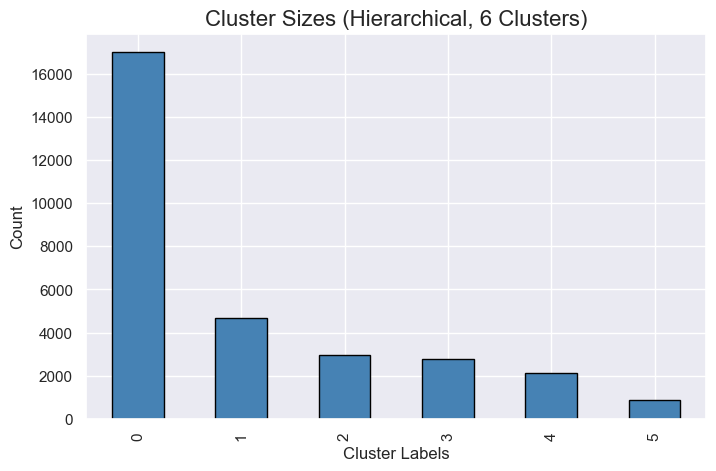

In [257]:
# Bar chart for cluster sizes
cluster_sizes = df_concat_hierarchical['labels'].value_counts().sort_index()
cluster_sizes.plot(kind='bar', color='steelblue', edgecolor='black', figsize=(8, 5))
plt.title('Cluster Sizes (Hierarchical, 6 Clusters)', fontsize=16)
plt.xlabel('Cluster Labels', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.show()


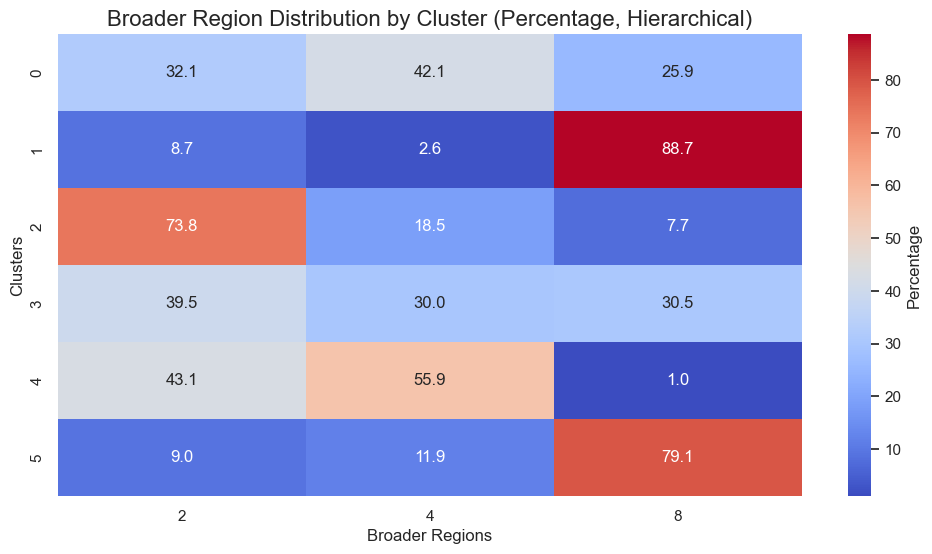

In [258]:
# Broader region distribution
broader_region_dist = (
    dfs.groupby(df_concat_hierarchical['labels'])['broader_region']
    .value_counts(normalize=True)
    .unstack()
    .fillna(0)
    * 100
)

# Heatmap of broader region distribution
plt.figure(figsize=(12, 6))
sns.heatmap(broader_region_dist, annot=True, fmt=".1f", cmap='coolwarm', cbar_kws={'label': 'Percentage'})
plt.title('Broader Region Distribution by Cluster (Percentage, Hierarchical)', fontsize=16)
plt.xlabel('Broader Regions', fontsize=12)
plt.ylabel('Clusters', fontsize=12)
plt.show()


## 3.2. Reduced number of time grouping features

##### ANOTHER GROUPING FOR TIME

In [259]:
dfs['early_morning2']= dfs[['HR_8', 'HR_9', 'HR_10', 'HR_11', 'HR_12', 'HR_13', 'HR_14']].sum(axis=1)
dfs['afternoon_evening2']= dfs[['HR_15', 'HR_16', 'HR_17', 'HR_18', 'HR_19', 'HR_20', 'HR_21']].sum(axis=1)
dfs['after_hours2']= dfs[['HR_22', 'HR_23', 'HR_0', 'HR_1', 'HR_2', 'HR_3', 'HR_4', 'HR_5', 'HR_6', 'HR_7']].sum(axis=1)

In [260]:
df['early_morning2']= df[['HR_8', 'HR_9', 'HR_10', 'HR_11', 'HR_12', 'HR_13', 'HR_14']].sum(axis=1)
df['afternoon_evening2']= df[['HR_15', 'HR_16', 'HR_17', 'HR_18', 'HR_19', 'HR_20', 'HR_21']].sum(axis=1)
df['after_hours2']= df[['HR_22', 'HR_23', 'HR_0', 'HR_1', 'HR_2', 'HR_3', 'HR_4', 'HR_5', 'HR_6', 'HR_7']].sum(axis=1)

In [261]:
new_time = ['early_morning2', 'afternoon_evening2', 'after_hours2', 'dow_diversity_score', 'hr_diversity_score']

#### 3.2.1. K-means

##### 4 clusters

In [262]:
number_clusters = 4
kmclust = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels = kmclust.fit_predict(dfs[new_time])
km_labels

array([0, 0, 0, ..., 0, 0, 0], dtype=int32)

In [263]:
df_concat = pd.concat((dfs[new_time], pd.Series(km_labels, name='labels', index=df.index)), axis=1)
df_concat.groupby('labels').mean()

,early_morning2,afternoon_evening2,after_hours2,dow_diversity_score,hr_diversity_score
labels,,,,,
0,-1.076151,-1.004508,-1.103054,-0.505292,-0.476111
1,-0.095222,-1.526503,9.677731,0.727872,0.753323
2,6.615854,0.047023,-0.817545,1.134811,1.090231
3,0.076740,6.842876,-1.316149,1.168182,1.024557


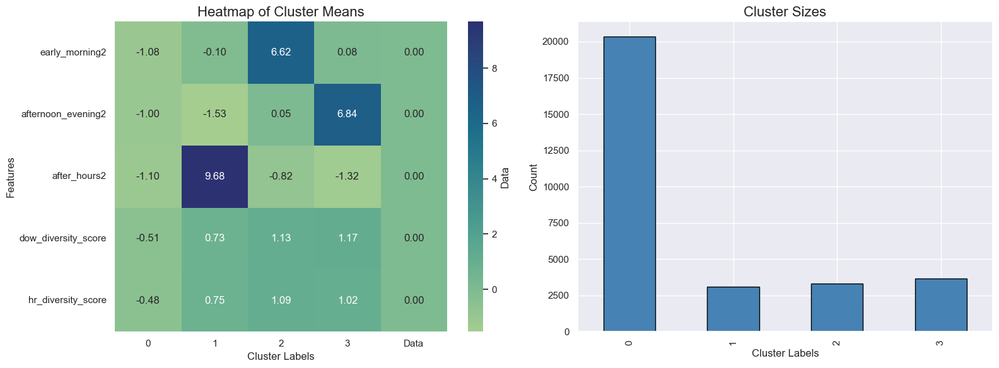

In [264]:
# Calculate cluster means
cluster_means = df_concat.groupby('labels').mean()[new_time]

# Calculate the overall mean of each feature in the dataset
overall_mean = df_concat[new_time].mean().rename('Data')

# Add the overall mean as a new column to the cluster means DataFrame
cluster_means_with_overall = cluster_means.T
cluster_means_with_overall['Data'] = overall_mean

# Plot the heatmap and bar chart side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Heatmap of cluster means with the overall data column
sns.heatmap(cluster_means_with_overall, ax=axes[0], annot=True, cmap='crest', fmt=".2f", cbar_kws={'label': 'Data'})
axes[0].set_title('Heatmap of Cluster Means', fontsize=16)
axes[0].set_ylabel('Features', fontsize=12)
axes[0].set_xlabel('Cluster Labels', fontsize=12)

# Bar chart of cluster sizes
cluster_sizes = df_concat['labels'].value_counts().sort_index()
cluster_sizes.plot(kind='bar', ax=axes[1], color='steelblue', edgecolor='black')
axes[1].set_title('Cluster Sizes', fontsize=16)
axes[1].set_ylabel('Count', fontsize=12)
axes[1].set_xlabel('Cluster Labels', fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()


##### 3 clusters

In [265]:
# final cluster solution
number_clusters = 3
kmclust = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels = kmclust.fit_predict(dfs[new_time])
km_labels

array([1, 1, 1, ..., 1, 1, 1], dtype=int32)

In [266]:
# Characterizing the final clusters
df_concat = pd.concat((dfs[new_time], pd.Series(km_labels, name='labels', index=df.index)), axis=1)
df_concat.groupby('labels').mean()

,early_morning2,afternoon_evening2,after_hours2,dow_diversity_score,hr_diversity_score
labels,,,,,
0,0.199577,-1.535888,9.087609,0.719205,0.754137
1,-0.805784,-0.897535,-1.176626,-0.426817,-0.418812
2,3.496388,5.164006,-1.245784,1.409034,1.347646


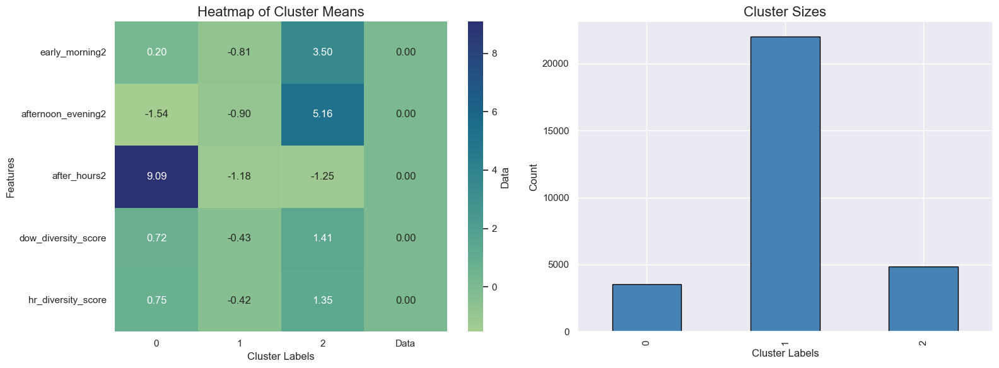

In [267]:
# Calculate cluster means
cluster_means = df_concat.groupby('labels').mean()[new_time]

# Calculate the overall mean of each feature in the dataset
overall_mean = df_concat[new_time].mean().rename('Data')

# Add the overall mean as a new column to the cluster means DataFrame
cluster_means_with_overall = cluster_means.T
cluster_means_with_overall['Data'] = overall_mean

# Plot the heatmap and bar chart side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Heatmap of cluster means with the overall data column
sns.heatmap(cluster_means_with_overall, ax=axes[0], annot=True, cmap='crest', fmt=".2f", cbar_kws={'label': 'Data'})
axes[0].set_title('Heatmap of Cluster Means', fontsize=16)
axes[0].set_ylabel('Features', fontsize=12)
axes[0].set_xlabel('Cluster Labels', fontsize=12)

# Bar chart of cluster sizes
cluster_sizes = df_concat['labels'].value_counts().sort_index()
cluster_sizes.plot(kind='bar', ax=axes[1], color='steelblue', edgecolor='black')
axes[1].set_title('Cluster Sizes', fontsize=16)
axes[1].set_ylabel('Count', fontsize=12)
axes[1].set_xlabel('Cluster Labels', fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()


#### 3.2.2 Gaussian Mixture Model

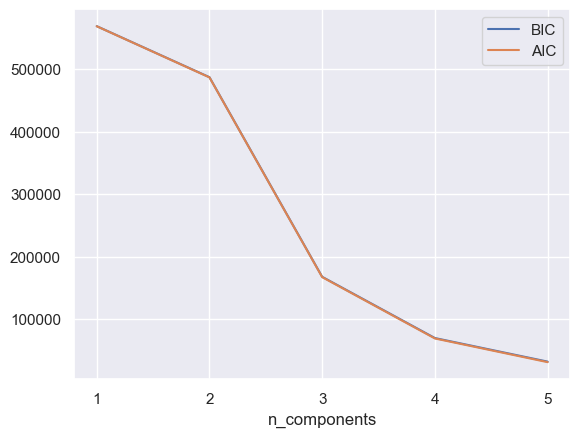

In [268]:
# Selecting number of components based on AIC and BIC
n_components = np.arange(1, 6)
models = [GaussianMixture(n, covariance_type='full', n_init=10, random_state=1).fit(dfs[new_time])
          for n in n_components]

bic_values = [m.bic(dfs[new_time]) for m in models]
aic_values = [m.aic(dfs[new_time]) for m in models]
plt.plot(n_components, bic_values, label='BIC')
plt.plot(n_components, aic_values, label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components')
plt.xticks(n_components)
plt.show()

In [269]:
gmm = GaussianMixture(n_components=3, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
gmm_labels = gmm.fit_predict(dfs[new_time])
labels_proba = gmm.predict_proba(dfs[new_time])

In [270]:
# Characterizing the 4 clusters
df_concat = pd.concat([dfs[new_time], 
                       pd.Series(gmm_labels, 
                                 name='labels', 
                                 index=df.index)], 
                    axis=1)

df_concat.groupby('labels').mean()

,early_morning2,afternoon_evening2,after_hours2,dow_diversity_score,hr_diversity_score
labels,,,,,
0,-1.293015,-2.394560,0.884674,-0.630842,-0.607927
1,1.496639,0.038715,5.701427,0.742141,0.895342
2,0.026403,0.859679,-2.013297,0.009335,-0.044451


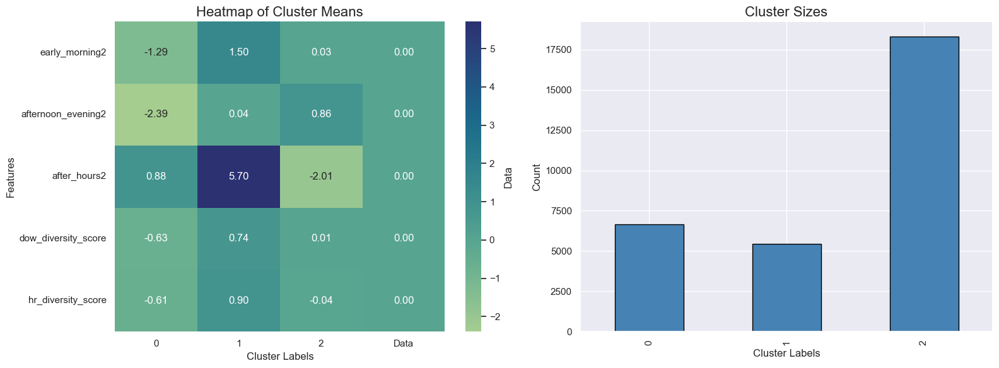

In [271]:
# Calculate cluster means
cluster_means = df_concat.groupby('labels').mean()

# Calculate the overall mean of each feature in the dataset
overall_mean = df_concat[new_time].mean().rename('Data')

# Add the overall mean as a new column to the cluster means DataFrame
cluster_means_with_overall = cluster_means.T
cluster_means_with_overall['Data'] = overall_mean

# Plot the heatmap and bar chart side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Heatmap of cluster means with the overall data column
sns.heatmap(cluster_means_with_overall, ax=axes[0], annot=True, cmap='crest', fmt=".2f", cbar_kws={'label': 'Data'})
axes[0].set_title('Heatmap of Cluster Means', fontsize=16)
axes[0].set_ylabel('Features', fontsize=12)
axes[0].set_xlabel('Cluster Labels', fontsize=12)

# Bar chart of cluster sizes
cluster_sizes = df_concat['labels'].value_counts().sort_index()
cluster_sizes.plot(kind='bar', ax=axes[1], color='steelblue', edgecolor='black')
axes[1].set_title('Cluster Sizes', fontsize=16)
axes[1].set_ylabel('Count', fontsize=12)
axes[1].set_xlabel('Cluster Labels', fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()


In [272]:
# Characterizing the 4 clusters
df_concat = pd.concat([dfs[time_feats], 
                       pd.Series(gmm_labels, 
                                 name='labels', 
                                 index=df.index)], 
                    axis=1)

df_concat.groupby('labels').mean()

,late_night,early_morning,morning,midday,afternoon_evening,night
labels,,,,,,
0,0.216637,0.072798,-0.311626,-0.409447,-0.643407,-0.251653
1,1.023677,0.886336,0.361180,0.120939,-0.158111,0.573592
2,-0.382509,-0.289434,0.006221,0.113082,0.280985,-0.078614


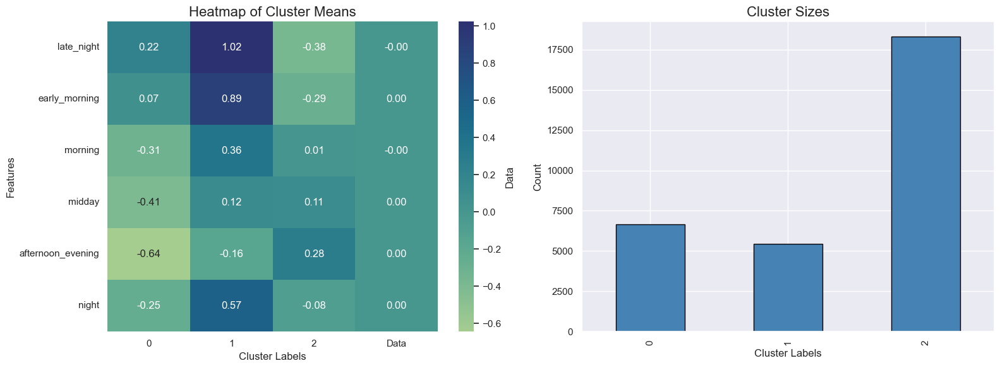

In [273]:
# Calculate cluster means
cluster_means = df_concat.groupby('labels').mean()

# Calculate the overall mean of each feature in the dataset
overall_mean = df_concat[time_feats].mean().rename('Data')

# Add the overall mean as a new column to the cluster means DataFrame
cluster_means_with_overall = cluster_means.T
cluster_means_with_overall['Data'] = overall_mean

# Plot the heatmap and bar chart side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Heatmap of cluster means with the overall data column
sns.heatmap(cluster_means_with_overall, ax=axes[0], annot=True, cmap='crest', fmt=".2f", cbar_kws={'label': 'Data'})
axes[0].set_title('Heatmap of Cluster Means', fontsize=16)
axes[0].set_ylabel('Features', fontsize=12)
axes[0].set_xlabel('Cluster Labels', fontsize=12)

# Bar chart of cluster sizes
cluster_sizes = df_concat['labels'].value_counts().sort_index()
cluster_sizes.plot(kind='bar', ax=axes[1], color='steelblue', edgecolor='black')
axes[1].set_title('Cluster Sizes', fontsize=16)
axes[1].set_ylabel('Count', fontsize=12)
axes[1].set_xlabel('Cluster Labels', fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()


This clustering solution does not effectively differentiate customers based on the time of day they place orders. 

#### 3.2.3 Self-Organizing Maps

In [274]:
M = 30
N = 30
neighborhood_function = 'gaussian' 
topology = 'hexagonal' 
n_feats = len(dfs[new_time].columns)
learning_rate = .7
sigma = 3.0     # Neighborhood radius

som_data = dfs[new_time].values

sm = MiniSom(M, N,              # 10x10 map size
             n_feats,           # Number of the elements of the vectors in input.
             sigma=sigma,
             learning_rate=learning_rate, 
             topology=topology, 
             neighborhood_function=neighborhood_function, 
             activation_distance='euclidean',
             random_seed=42
             )

# Initializes the weights of the SOM picking random samples from data.
sm.random_weights_init(som_data) 


print("Before training:")
print("QE", np.round(sm.quantization_error(som_data),4))
print("TE", np.round(sm.topographic_error(som_data),4))


# Trains the SOM using all the vectors in data sequentially
# minisom does not distinguish between unfolding and fine tuning phase;

sm.train_batch(som_data, 50000)

print("After training:")
print("QE", np.round(sm.quantization_error(som_data),4))
print("TE", np.round(sm.topographic_error(som_data),4))


Before training:


/opt/anaconda3/lib/python3.12/site-packages/minisom.py:631: RuntimeWarning: invalid value encountered in sqrt
  return sqrt(-2 * cross_term + input_data_sq + weights_flat_sq.T)


QE 0.5175
TE 0.993
After training:
QE 0.5867
TE 0.0411


In [275]:
weights = sm.get_weights()
weights.shape


(30, 30, 5)

In [276]:
def plot_hexagons(som,              # Trained SOM model 
                  sf,               # matplotlib figure object
                  colornorm,        # colornorm
                  matrix_vals,      # SOM weights or
                  label="",         # title for figure
                  cmap=cm.Grays,    # colormap to use
                  annot=False       
                  ):

    
    axs = sf.subplots(1,1)
    
    for i in range(matrix_vals.shape[0]):
        for j in range(matrix_vals.shape[1]):

            wx, wy = som.convert_map_to_euclidean((i,j)) 

            hex = RegularPolygon((wx, wy), 
                                numVertices=6, 
                                radius= np.sqrt(1/3),
                                facecolor=cmap(colornorm(matrix_vals[i, j])), 
                                alpha=1, 
                                edgecolor='white',
                                linewidth=.5)
            axs.add_patch(hex)
            if annot==True:
                annot_val = np.round(matrix_vals[i,j],2)
                if int(annot_val) == annot_val:
                    annot_val = int(annot_val)
                axs.text(wx,wy, annot_val, 
                        ha='center', va='center', 
                        fontsize='x-small')


    ## Remove axes for hex plot
    axs.margins(.05)
    axs.set_aspect('equal')
    axs.axis("off")
    axs.set_title(label)

    # ## Add colorbar
    divider = make_axes_locatable(axs)
    ax_cb = divider.append_axes("right", size="5%", pad="0%")

    ## Create a Mappable object
    cmap_sm = plt.cm.ScalarMappable(cmap=cmap, norm=colornorm)
    cmap_sm.set_array([])

    ## Create custom colorbar 
    cb1 = colorbar.Colorbar(ax_cb,
                            orientation='vertical', 
                            alpha=1,
                            mappable=cmap_sm
                            )
    cb1.ax.get_yaxis().labelpad = 6

    # Add colorbar to plot
    sf.add_axes(ax_cb)




    return sf 


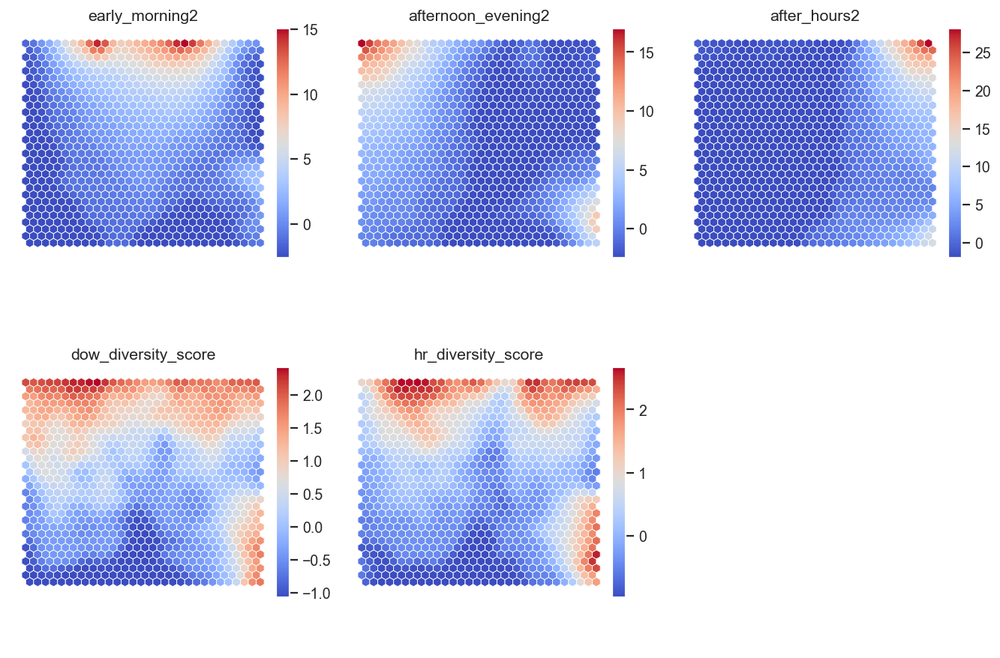

In [277]:
figsize = (10, 7)
fig = plt.figure(figsize=figsize, constrained_layout=True, dpi=128)

# Adjust subfigure layout to match 6 features
subfigs = fig.subfigures(2, 3, wspace=.15)

colornorm = mpl_colors.Normalize(vmin=np.min(weights), vmax=np.max(weights))

# Loop over all 6 features
for cpi, sf in zip(range(weights.shape[2]), subfigs.flatten()):
    matrix_vals = weights[:, :, cpi]
    vext = np.max(np.abs([np.min(matrix_vals), np.max(matrix_vals)]))
    colornorm = mpl_colors.Normalize(vmin=np.min(matrix_vals), vmax=np.max(matrix_vals))

    sf = plot_hexagons(sm, sf, 
                       colornorm,
                       matrix_vals,
                       label=dfs[new_time].columns[cpi],
                       cmap=cm.coolwarm)


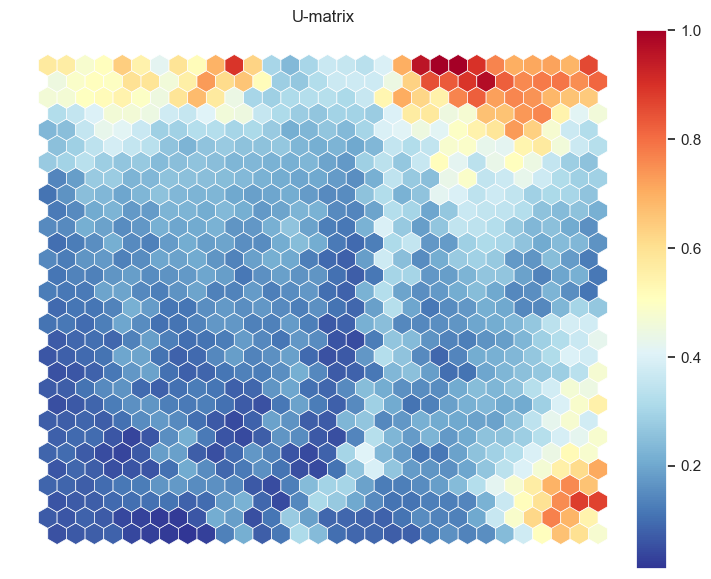

In [278]:
umatrix = sm.distance_map(scaling='mean')
fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=np.min(umatrix), vmax=np.max(umatrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    umatrix,
                    label="U-matrix",
                    cmap=cm.RdYlBu_r
                    )

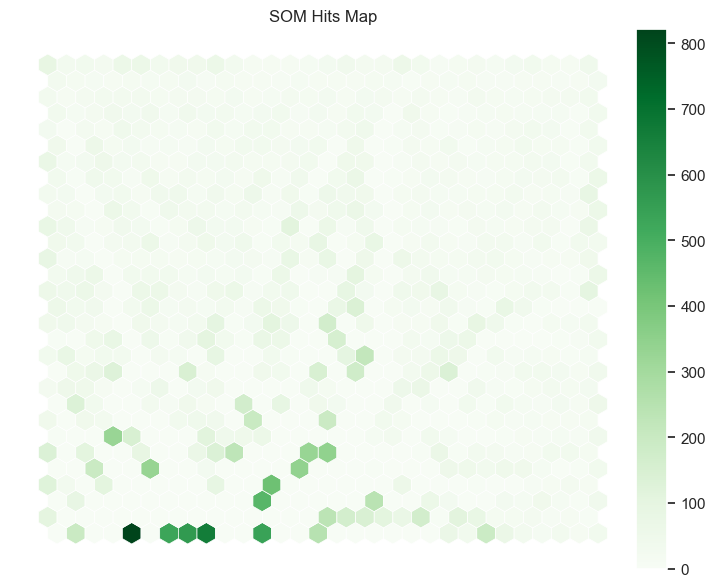

In [279]:
hitsmatrix = sm.activation_response(dfs[new_time].values)


fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(hitsmatrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    hitsmatrix,
                    label="SOM Hits Map",
                    cmap=cm.Greens
                    )

In [280]:
sm.quantization_error(dfs[new_time].values)

0.5866924030199874

##### KMEANS WITH 3 CLUSTERS

In [281]:
# Extract SOM weights
weights = sm.get_weights()  # Shape: (rows, cols, features)

# Reshape weights into a 2D array for clustering
weights_reshaped = weights.reshape(-1, weights.shape[-1])  # Shape: (rows*cols, features)


In [282]:
n_clusters = 3
# Fit K-means
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans_labels = kmeans.fit_predict(weights_reshaped)  

In [283]:
cluster_assignments = [sm.winner(data_point) for data_point in dfs[new_time].values]

In [284]:
bmu_clusters = {tuple(bmu): cluster for bmu, cluster in zip([(i // sm._weights.shape[1], i % sm._weights.shape[1]) for i in range(len(kmeans_labels))], kmeans_labels)}

# Assign each data point to its cluster
data_clusters = [bmu_clusters[tuple(bmu)] for bmu in cluster_assignments]

In [285]:
# Create a DataFrame for profiling
cluster_profiles_kmeans = (
    dfs[new_time]
    .assign(cluster=data_clusters)
    .groupby('cluster')
    .agg(['mean', 'median', 'count'])
)

from IPython.display import display
display(cluster_profiles_kmeans)


early_morning2                  afternoon_evening2                   \
                  mean    median  count               mean    median  count   
cluster                                                                       
0            -0.408006 -1.019998  22431          -1.094035 -1.139553  22431   
1             0.429889 -0.821524   3062          -1.429280 -2.475229   3062   
2             1.590351  0.559853   4927           5.869037  4.807652   4927   

        after_hours2                  dow_diversity_score                   \
                mean    median  count                mean    median  count   
cluster                                                                      
0          -1.028033 -2.013297  22431           -0.385058 -0.390011  22431   
1           9.797272  8.173752   3062            0.830144  0.956580   3062   
2          -1.408450 -2.013297   4927            1.237131  0.956580   4927   

        hr_diversity_score                   
                      mean    median  count  
cluster                                      
0                -0.376315 -0.404062  22431  
1                 0.880654  0.735840   3062  
2                 1.165935  1.305791   4927

In [286]:
# Create a new DataFrame for profiling
df_concat = dfs.copy()  # Keep original `dfs` unchanged
df_concat['labels'] = data_clusters

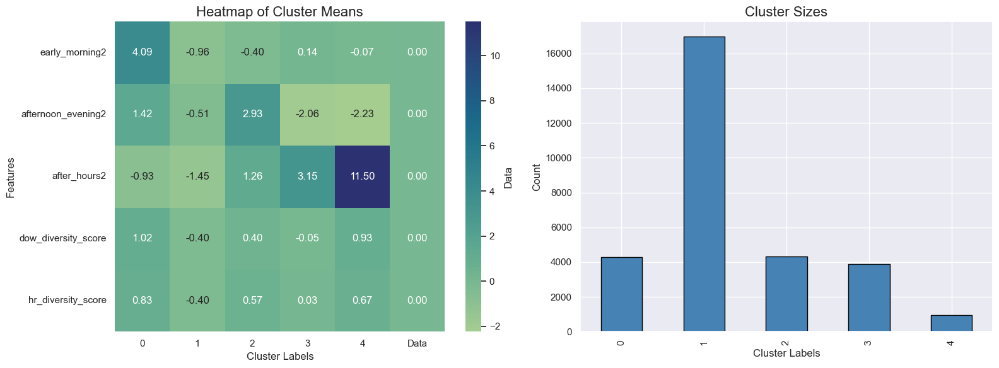

In [287]:
df_concat = pd.concat([dfs[time_feats+new_time], 
                       pd.Series(hc5_labels, 
                                 name='labels', 
                                 index=df.index)], 
                    axis=1)

# Calculate cluster means
cluster_means = df_concat.groupby('labels').mean()[new_time]

# Calculate the overall mean of each feature in the dataset
overall_mean = df_concat[new_time].mean().rename('Data')

# Add the overall mean as a new column to the cluster means DataFrame
cluster_means_with_overall = cluster_means.T
cluster_means_with_overall['Data'] = overall_mean

# Plot the heatmap and bar chart side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Heatmap of cluster means with the overall data column
sns.heatmap(cluster_means_with_overall, ax=axes[0], annot=True, cmap='crest', fmt=".2f", cbar_kws={'label': 'Data'})
axes[0].set_title('Heatmap of Cluster Means', fontsize=16)
axes[0].set_ylabel('Features', fontsize=12)
axes[0].set_xlabel('Cluster Labels', fontsize=12)

# Bar chart of cluster sizes
cluster_sizes = df_concat['labels'].value_counts().sort_index()
cluster_sizes.plot(kind='bar', ax=axes[1], color='steelblue', edgecolor='black')
axes[1].set_title('Cluster Sizes', fontsize=16)
axes[1].set_ylabel('Count', fontsize=12)
axes[1].set_xlabel('Cluster Labels', fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()

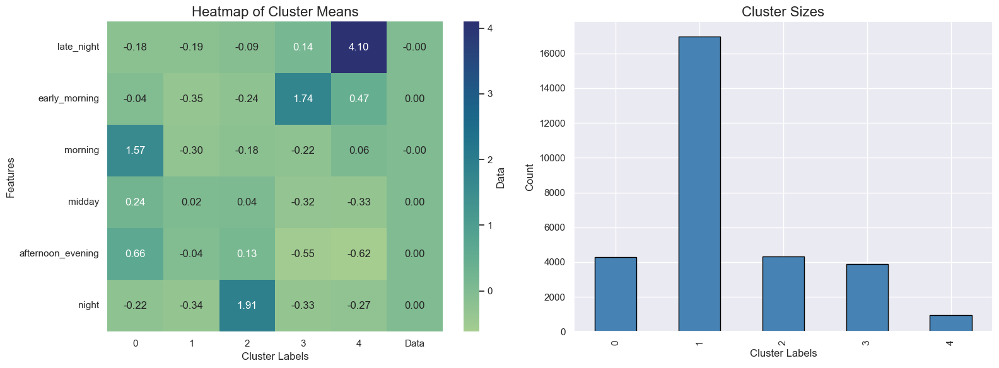

In [288]:
# Calculate cluster means
cluster_means = df_concat.groupby('labels').mean()[time_feats]

# Calculate the overall mean of each feature in the dataset
overall_mean = df_concat[time_feats].mean().rename('Data')

# Add the overall mean as a new column to the cluster means DataFrame
cluster_means_with_overall = cluster_means.T
cluster_means_with_overall['Data'] = overall_mean

# Plot the heatmap and bar chart side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Heatmap of cluster means with the overall data column
sns.heatmap(cluster_means_with_overall, ax=axes[0], annot=True, cmap='crest', fmt=".2f", cbar_kws={'label': 'Data'})
axes[0].set_title('Heatmap of Cluster Means', fontsize=16)
axes[0].set_ylabel('Features', fontsize=12)
axes[0].set_xlabel('Cluster Labels', fontsize=12)

# Bar chart of cluster sizes
cluster_sizes = df_concat['labels'].value_counts().sort_index()
cluster_sizes.plot(kind='bar', ax=axes[1], color='steelblue', edgecolor='black')
axes[1].set_title('Cluster Sizes', fontsize=16)
axes[1].set_ylabel('Count', fontsize=12)
axes[1].set_xlabel('Cluster Labels', fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()


##### KMEANS WITH 4 CLUSTERS

In [289]:
# Extract SOM weights
weights = sm.get_weights()  # Shape: (rows, cols, features)

# Reshape weights into a 2D array for clustering
weights_reshaped = weights.reshape(-1, weights.shape[-1])  # Shape: (rows*cols, features)


In [290]:
n_clusters = 4
# Fit K-means
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans_labels = kmeans.fit_predict(weights_reshaped)  

In [291]:
cluster_assignments = [sm.winner(data_point) for data_point in dfs[new_time].values]

In [292]:
bmu_clusters = {tuple(bmu): cluster for bmu, cluster in zip([(i // sm._weights.shape[1], i % sm._weights.shape[1]) for i in range(len(kmeans_labels))], kmeans_labels)}

# Assign each data point to its cluster
data_clusters = [bmu_clusters[tuple(bmu)] for bmu in cluster_assignments]

In [293]:
# Create a DataFrame for profiling
cluster_profiles_kmeans = (
    dfs[new_time]
    .assign(cluster=data_clusters)
    .groupby('cluster')
    .agg(['mean', 'median', 'count'])
)

from IPython.display import display
display(cluster_profiles_kmeans)


early_morning2                  afternoon_evening2                   \
                  mean    median  count               mean    median  count   
cluster                                                                       
0            -0.225603 -1.019998  17789          -0.726061 -1.023276  17789   
1             1.047334  0.010036   1462          -1.109676 -2.475229   1462   
2             1.673735  0.559853   4211           6.449964  5.396333   4211   
3            -0.656231 -1.205435   6958          -1.814106 -2.475229   6958   

        after_hours2                   dow_diversity_score                   \
                mean     median  count                mean    median  count   
cluster                                                                       
0          -1.952294  -2.013297  17789           -0.375023 -0.390011  17789   
1          13.745110  12.039083   1462            1.305201  1.293228   1462   
2          -1.369322  -2.013297   4211            1.331681  1.629875   4211   
3           2.931908   2.289041   6958           -0.121390 -0.390011   6958   

        hr_diversity_score                   
                      mean    median  count  
cluster                                      
0                -0.384710 -0.404062  17789  
1                 1.365047  1.305791   1462  
2                 1.246914  1.305791   4211  
3                -0.057897 -0.404062   6958

In [294]:
# Create a new DataFrame for profiling
df_concat = dfs.copy()  # Keep original `dfs` unchanged
df_concat['labels'] = data_clusters

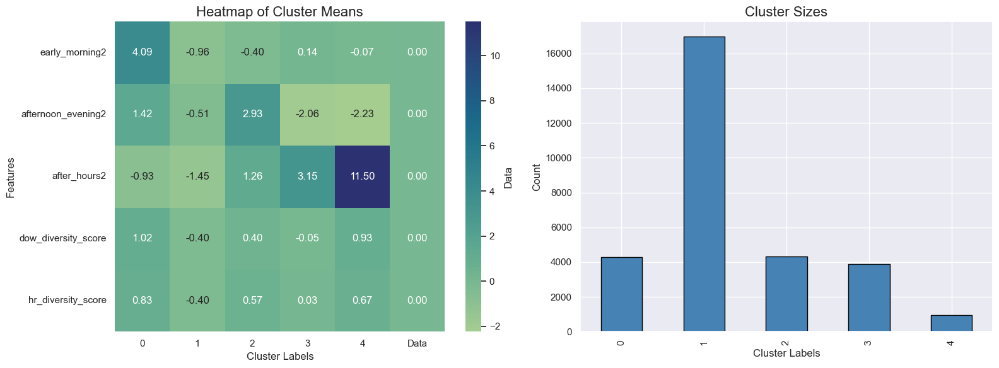

In [295]:
df_concat = pd.concat([dfs[time_feats+new_time], 
                       pd.Series(hc5_labels, 
                                 name='labels', 
                                 index=df.index)], 
                    axis=1)

# Calculate cluster means
cluster_means = df_concat.groupby('labels').mean()[new_time]

# Calculate the overall mean of each feature in the dataset
overall_mean = df_concat[new_time].mean().rename('Data')

# Add the overall mean as a new column to the cluster means DataFrame
cluster_means_with_overall = cluster_means.T
cluster_means_with_overall['Data'] = overall_mean

# Plot the heatmap and bar chart side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Heatmap of cluster means with the overall data column
sns.heatmap(cluster_means_with_overall, ax=axes[0], annot=True, cmap='crest', fmt=".2f", cbar_kws={'label': 'Data'})
axes[0].set_title('Heatmap of Cluster Means', fontsize=16)
axes[0].set_ylabel('Features', fontsize=12)
axes[0].set_xlabel('Cluster Labels', fontsize=12)

# Bar chart of cluster sizes
cluster_sizes = df_concat['labels'].value_counts().sort_index()
cluster_sizes.plot(kind='bar', ax=axes[1], color='steelblue', edgecolor='black')
axes[1].set_title('Cluster Sizes', fontsize=16)
axes[1].set_ylabel('Count', fontsize=12)
axes[1].set_xlabel('Cluster Labels', fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()

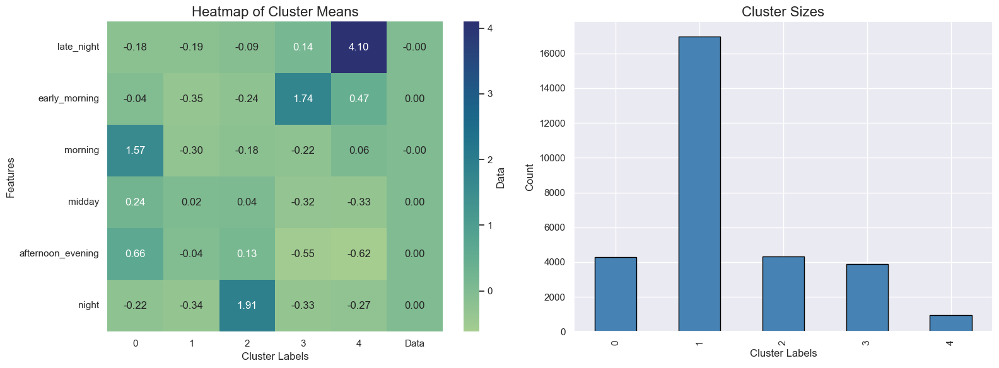

In [296]:
# Calculate cluster means
cluster_means = df_concat.groupby('labels').mean()[time_feats]

# Calculate the overall mean of each feature in the dataset
overall_mean = df_concat[time_feats].mean().rename('Data')

# Add the overall mean as a new column to the cluster means DataFrame
cluster_means_with_overall = cluster_means.T
cluster_means_with_overall['Data'] = overall_mean

# Plot the heatmap and bar chart side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Heatmap of cluster means with the overall data column
sns.heatmap(cluster_means_with_overall, ax=axes[0], annot=True, cmap='crest', fmt=".2f", cbar_kws={'label': 'Data'})
axes[0].set_title('Heatmap of Cluster Means', fontsize=16)
axes[0].set_ylabel('Features', fontsize=12)
axes[0].set_xlabel('Cluster Labels', fontsize=12)

# Bar chart of cluster sizes
cluster_sizes = df_concat['labels'].value_counts().sort_index()
cluster_sizes.plot(kind='bar', ax=axes[1], color='steelblue', edgecolor='black')
axes[1].set_title('Cluster Sizes', fontsize=16)
axes[1].set_ylabel('Count', fontsize=12)
axes[1].set_xlabel('Cluster Labels', fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()


##### HIERARCHICAL WITH 3 CLUSTERS


In [297]:
n_clusters = 3
hierarchical = AgglomerativeClustering(
    n_clusters=n_clusters,
    metric='euclidean',  # Distance metric
    linkage='ward'         # Linkage criterion
)
hierarchical_labels = hierarchical.fit_predict(weights_reshaped) 

In [298]:
# Map hierarchical clusters to BMUs
bmu_to_cluster_hierarchical = {
    tuple(bmu): cluster for bmu, cluster in zip(
        [(i // sm._weights.shape[1], i % sm._weights.shape[1]) for i in range(len(hierarchical_labels))],
        hierarchical_labels
    )
}

# Assign clusters to data points
data_clusters_hierarchical = [bmu_to_cluster_hierarchical[tuple(bmu)] for bmu in cluster_assignments]

# Add cluster labels to a copy of the data for profiling
df_concat_hierarchical = dfs.copy()
df_concat_hierarchical['labels'] = data_clusters_hierarchical


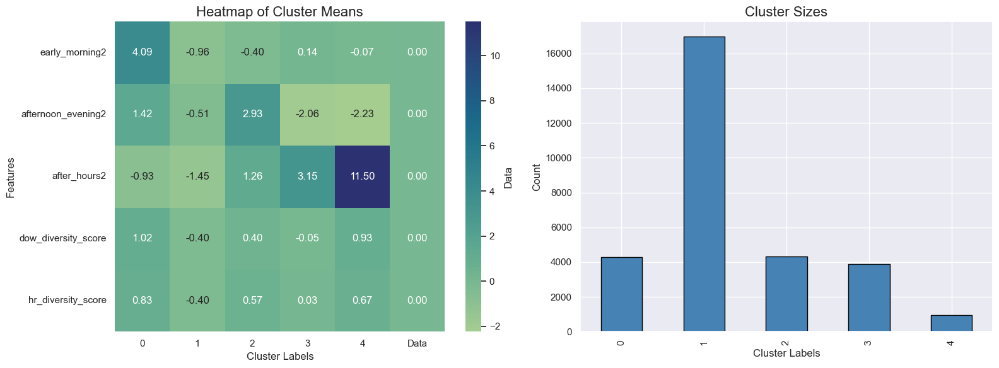

In [299]:
df_concat_hierarchical = pd.concat([dfs[time_feats+new_time], 
                       pd.Series(hc5_labels, 
                                 name='labels', 
                                 index=df.index)], axis=1)

# Calculate cluster means
cluster_means = df_concat_hierarchical.groupby('labels').mean()[new_time]

# Calculate the overall mean of each feature in the dataset
overall_mean = df_concat_hierarchical[new_time].mean().rename('Data')

# Add the overall mean as a new column to the cluster means DataFrame
cluster_means_with_overall = cluster_means.T
cluster_means_with_overall['Data'] = overall_mean

# Plot the heatmap and bar chart side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Heatmap of cluster means with the overall data column
sns.heatmap(cluster_means_with_overall, ax=axes[0], annot=True, cmap='crest', fmt=".2f", cbar_kws={'label': 'Data'})
axes[0].set_title('Heatmap of Cluster Means', fontsize=16)
axes[0].set_ylabel('Features', fontsize=12)
axes[0].set_xlabel('Cluster Labels', fontsize=12)

# Bar chart of cluster sizes
cluster_sizes = df_concat_hierarchical['labels'].value_counts().sort_index()
cluster_sizes.plot(kind='bar', ax=axes[1], color='steelblue', edgecolor='black')
axes[1].set_title('Cluster Sizes', fontsize=16)
axes[1].set_ylabel('Count', fontsize=12)
axes[1].set_xlabel('Cluster Labels', fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()


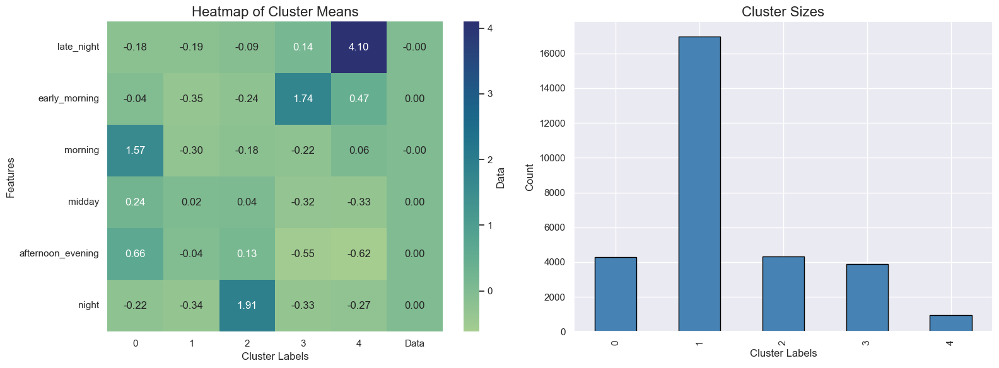

In [300]:
# Calculate cluster means
cluster_means = df_concat_hierarchical.groupby('labels').mean()[time_feats]

# Calculate the overall mean of each feature in the dataset
overall_mean = df_concat_hierarchical[time_feats].mean().rename('Data')

# Add the overall mean as a new column to the cluster means DataFrame
cluster_means_with_overall = cluster_means.T
cluster_means_with_overall['Data'] = overall_mean

# Plot the heatmap and bar chart side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Heatmap of cluster means with the overall data column
sns.heatmap(cluster_means_with_overall, ax=axes[0], annot=True, cmap='crest', fmt=".2f", cbar_kws={'label': 'Data'})
axes[0].set_title('Heatmap of Cluster Means', fontsize=16)
axes[0].set_ylabel('Features', fontsize=12)
axes[0].set_xlabel('Cluster Labels', fontsize=12)

# Bar chart of cluster sizes
cluster_sizes = df_concat_hierarchical['labels'].value_counts().sort_index()
cluster_sizes.plot(kind='bar', ax=axes[1], color='steelblue', edgecolor='black')
axes[1].set_title('Cluster Sizes', fontsize=16)
axes[1].set_ylabel('Count', fontsize=12)
axes[1].set_xlabel('Cluster Labels', fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()


##### HIERARCHICAL 4 CLUSTERS

In [301]:
n_clusters = 4
hierarchical = AgglomerativeClustering(
    n_clusters=n_clusters,
    metric='euclidean',  # Distance metric
    linkage='ward'         # Linkage criterion
)
hierarchical_labels = hierarchical.fit_predict(weights_reshaped) 

In [302]:
# Map hierarchical clusters to BMUs
bmu_to_cluster_hierarchical = {
    tuple(bmu): cluster for bmu, cluster in zip(
        [(i // sm._weights.shape[1], i % sm._weights.shape[1]) for i in range(len(hierarchical_labels))],
        hierarchical_labels
    )
}

# Assign clusters to data points
data_clusters_hierarchical = [bmu_to_cluster_hierarchical[tuple(bmu)] for bmu in cluster_assignments]

# Add cluster labels to a copy of the data for profiling
df_concat_hierarchical = dfs.copy()
df_concat_hierarchical['labels'] = data_clusters_hierarchical


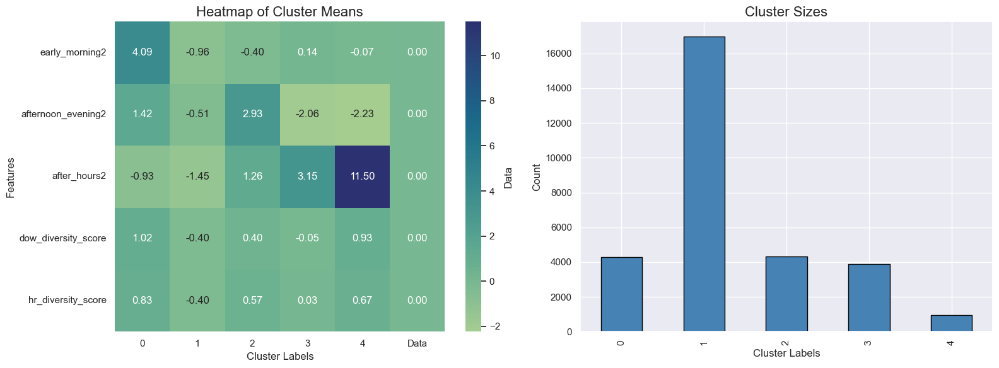

In [303]:
df_concat_hierarchical = pd.concat([dfs[time_feats+new_time], 
                       pd.Series(hc5_labels, 
                                 name='labels', 
                                 index=df.index)], 
                    axis=1)

# Calculate cluster means
cluster_means = df_concat_hierarchical.groupby('labels').mean()[new_time]

# Calculate the overall mean of each feature in the dataset
overall_mean = df_concat_hierarchical[new_time].mean().rename('Data')

# Add the overall mean as a new column to the cluster means DataFrame
cluster_means_with_overall = cluster_means.T
cluster_means_with_overall['Data'] = overall_mean

# Plot the heatmap and bar chart side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Heatmap of cluster means with the overall data column
sns.heatmap(cluster_means_with_overall, ax=axes[0], annot=True, cmap='crest', fmt=".2f", cbar_kws={'label': 'Data'})
axes[0].set_title('Heatmap of Cluster Means', fontsize=16)
axes[0].set_ylabel('Features', fontsize=12)
axes[0].set_xlabel('Cluster Labels', fontsize=12)

# Bar chart of cluster sizes
cluster_sizes = df_concat_hierarchical['labels'].value_counts().sort_index()
cluster_sizes.plot(kind='bar', ax=axes[1], color='steelblue', edgecolor='black')
axes[1].set_title('Cluster Sizes', fontsize=16)
axes[1].set_ylabel('Count', fontsize=12)
axes[1].set_xlabel('Cluster Labels', fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()


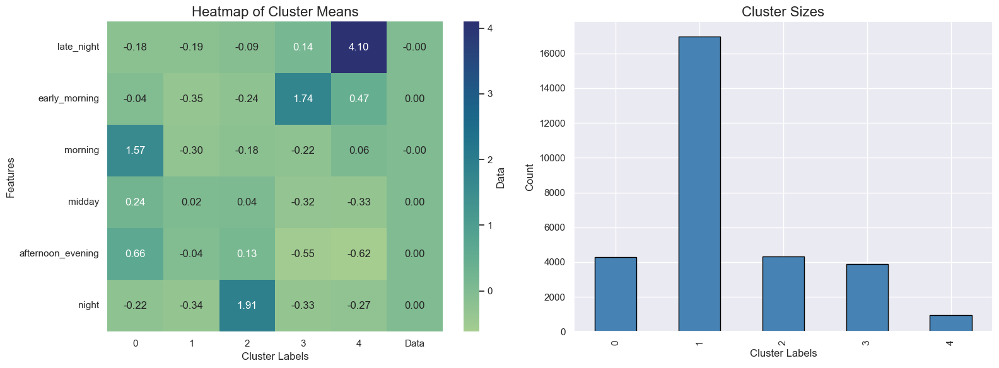

In [304]:
# Calculate cluster means
cluster_means = df_concat_hierarchical.groupby('labels').mean()[time_feats]

# Calculate the overall mean of each feature in the dataset
overall_mean = df_concat_hierarchical[time_feats].mean().rename('Data')

# Add the overall mean as a new column to the cluster means DataFrame
cluster_means_with_overall = cluster_means.T
cluster_means_with_overall['Data'] = overall_mean

# Plot the heatmap and bar chart side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Heatmap of cluster means with the overall data column
sns.heatmap(cluster_means_with_overall, ax=axes[0], annot=True, cmap='crest', fmt=".2f", cbar_kws={'label': 'Data'})
axes[0].set_title('Heatmap of Cluster Means', fontsize=16)
axes[0].set_ylabel('Features', fontsize=12)
axes[0].set_xlabel('Cluster Labels', fontsize=12)

# Bar chart of cluster sizes
cluster_sizes = df_concat_hierarchical['labels'].value_counts().sort_index()
cluster_sizes.plot(kind='bar', ax=axes[1], color='steelblue', edgecolor='black')
axes[1].set_title('Cluster Sizes', fontsize=16)
axes[1].set_ylabel('Count', fontsize=12)
axes[1].set_xlabel('Cluster Labels', fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()


#### Final conclusions

The clusters generated using this new grouping of time features result in highly imbalanced clusters. Clusters that contain more than two-thirds of the dataset are not considered meaningful or appropriate for segmentation, beacuse they lack granularity to differentiate patterns.

# 4. Final Clustering Solutions for each Perspective

`Perspective 1 - Value and Loyalty Features`

K-Means on top of SOM shows to be a better solution overall for value and loyalty perspective, due to the trade-off between cluster-size imbalance, interpretability, $R^2$ score and Silouette Score.

`Perspective 2 - Preference Features`

K-Means on top of SOM shows to be a better solution overall for preference perspective, due to the trade-off between cluster-size imbalance, interpretability, $R^2$ score and Silouette Score.

`Perspective 3 - Time Features`

For this perspective, the final cluster solutions provided are not very good cluster approaches, not segmenting well, very imbalanced and with not many insights.

Therefore, we will not use this perspective to merge with the others for the final clustering solution.